# Generate GD gene signature using pooled data (GD/CD4/CD8)

## Table of Contents <a name="0"></a>
1. [Load data](#1)
2. [Demultiplex and remove doublets (Demuxlet)](#2)
3. [Add scTCR data](#3)
4. [Pool data](#4)
5. [QC](#5)
6. [Normalize and log](#6)
7. [Feature selection](#7)
8. [Data correction](#8)
9. [Dimensionality reduction and visualization](#9)
10. [Subset out Macs (via barcode) and re-run](#10)
11. [Re-run preprocessing (w/o macs)](#11)
12. [Re-run dimensionality reduction and visualization](#12)
13. [Generate GD Vd2- TP gene signatures](#13)
14. [Make volcano plot - PTT](#14)
15. [Dec 21, 2021 - Remake Fig 5A-C (volcano plot) - Vd2- signature](#15)
16. [May 27, 2022 - More volcano plots & Signature scores](#16)
17. [Aug 12, 2022 - IL-15 expression](#17)
18. [Dec 2, 2022 - plot heat map of gene sig across Vd2-, Vd2+, CD4, and CD8](#18)
18. [Bottom of notebook](#18)

## 1. Load data <a name="1"></a>
[Return to top](#0)

In [1]:
# Check working directory
!pwd

/Users/brandonkevinchen/fonglab/Projects/project-cr1_gd_project/analysis/kidney_gd_cd4_cd8_gene_sig


In [2]:
# Load libraries
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns

In [3]:
# Define save/load path
results_file = './write/analysis3_gd_signature.h5ad'  # the file that will store the analysis results
test_file = 'write/test_save.h5ad'  # temp save location used to test for adata.write errors

In [4]:
# Set display variables
sc.settings.verbosity = 1             # verbosity: errors (0), warnings (1), info (2), hints (3)
#sc.logging.print_versions()
sc.logging.print_header()
#sc.settings.set_figure_params(dpi=80, frameon=False, figsize=(3, 3))
sc.settings.set_figure_params(dpi=80, dpi_save=1000, frameon=False)

scanpy==1.7.2 anndata==0.7.6 umap==0.5.1 numpy==1.20.2 scipy==1.6.2 pandas==1.2.4 scikit-learn==0.24.1 statsmodels==0.12.2 python-igraph==0.9.1


### Reload data

In [5]:
#adata = sc.read(results_file)

### Initial load

In [6]:
adata_gd = sc.read_10x_mtx(
    '../../data/cellranger_outs/genex_outs/Chiara_Kidney_Pooled_gdTCR_GENEX_out/filtered_feature_bc_matrix/',  # the directory with the `.mtx` file
    var_names='gene_symbols',                  # use gene symbols for the variable names (variables-axis index)
    cache=True)                                # write a cache file for faster subsequent reading
adata_gd.var_names_make_unique()  # this is unnecessary if using `var_names='gene_ids'` in `sc.read_10x_mtx`

adata_cd4 = sc.read_10x_mtx(
    '../../data/cellranger_outs/genex_outs/Chiara_Kidney_Pooled_CD4pos_GENEX_out/filtered_feature_bc_matrix/',  # the directory with the `.mtx` file
    var_names='gene_symbols',                  # use gene symbols for the variable names (variables-axis index)
    cache=True)                                # write a cache file for faster subsequent reading
adata_cd4.var_names_make_unique()  # this is unnecessary if using `var_names='gene_ids'` in `sc.read_10x_mtx`

adata_cd8 = sc.read_10x_mtx(
    '../../data/cellranger_outs/genex_outs/Chiara_Kidney_Pooled_CD8pos_GENEX_out/filtered_feature_bc_matrix/',  # the directory with the `.mtx` file
    var_names='gene_symbols',                  # use gene symbols for the variable names (variables-axis index)
    cache=True)                                # write a cache file for faster subsequent reading
adata_cd8.var_names_make_unique()  # this is unnecessary if using `var_names='gene_ids'` in `sc.read_10x_mtx`

## 2. Remove doublets and add sample_id labels (Demuxlet) <a name="2"></a>
[Return to top](#0)

In [7]:
# Load Demuxlet output
demux_path_gd = "~/fonglab/Projects/project-cr1_gd_project/data/demux_outs/Chiara_Kidney_Pooled_gdTCR_GENEX/Chiara_Kidney_Pooled_gdTCR_GENEX.whitelist.best"
demux_gd = pd.read_csv(demux_path_gd, delimiter = '\t')
print(demux_gd.shape)

demux_path_cd4 = "~/fonglab/Projects/project-cr1_gd_project/data/demux_outs/Chiara_Kidney_Pooled_CD4pos_GENEX/Chiara_Kidney_Pooled_CD4pos_GENEX.whitelist.best"
demux_cd4 = pd.read_csv(demux_path_cd4, delimiter = '\t')
print(demux_cd4.shape)

demux_path_cd8 = "~/fonglab/Projects/project-cr1_gd_project/data/demux_outs/Chiara_Kidney_Pooled_CD8pos_GENEX/Chiara_Kidney_Pooled_CD8pos_GENEX.whitelist.best"
demux_cd8 = pd.read_csv(demux_path_cd8, delimiter = '\t')
print(demux_cd8.shape)

(3615, 22)
(7649, 22)
(8854, 22)


### GD

In [8]:
# Prep annotations
df = demux_gd[['BARCODE', 'BEST']]
df['DOUBLET'] = df['BEST'].str.split('-', 1).apply(lambda x: x[0])
df['SAMPLE_ID'] = df['BEST'].str.split('-', 1).apply(lambda x: x[1])
df.head()

<ipython-input-8-202819c96bf2>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['DOUBLET'] = df['BEST'].str.split('-', 1).apply(lambda x: x[0])
<ipython-input-8-202819c96bf2>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['SAMPLE_ID'] = df['BEST'].str.split('-', 1).apply(lambda x: x[1])


,BARCODE,BEST,DOUBLET,SAMPLE_ID
0,AAACCTGCACAGCCCA-1,SNG-KID21,SNG,KID21
1,AAACCTGCAGGACCCT-1,SNG-KID21,SNG,KID21
2,AAACCTGCATTCACTT-1,SNG-KID19,SNG,KID19
3,AAACGGGAGCTAGTTC-1,SNG-KID21,SNG,KID21
4,AAACGGGAGTTTCCTT-1,DBL-KID18-KID90-0.500,DBL,KID18-KID90-0.500


In [9]:
# Check doublet numbers
df['DOUBLET'].value_counts()

SNG    3468
DBL     122
AMB      25
Name: DOUBLET, dtype: int64

In [10]:
# Annotate
adata_gd.obs['barcode'] = adata_gd.obs.index

doublet_map = dict(zip(df['BARCODE'], df['DOUBLET']))
adata_gd.obs['doublet'] = adata_gd.obs['barcode'].map(doublet_map)

sample_id_map = dict(zip(df['BARCODE'], df['SAMPLE_ID']))
adata_gd.obs['sample_id'] = adata_gd.obs['barcode'].map(sample_id_map)

adata_gd.obs.head()

,barcode,doublet,sample_id
AAACCTGCACAGCCCA-1,AAACCTGCACAGCCCA-1,SNG,KID21
AAACCTGCAGGACCCT-1,AAACCTGCAGGACCCT-1,SNG,KID21
AAACCTGCATTCACTT-1,AAACCTGCATTCACTT-1,SNG,KID19
AAACGGGAGCTAGTTC-1,AAACGGGAGCTAGTTC-1,SNG,KID21
AAACGGGAGTTTCCTT-1,AAACGGGAGTTTCCTT-1,DBL,KID18-KID90-0.500


### CD4

In [11]:
# Prep annotations
df = demux_cd4[['BARCODE', 'BEST']]
df['DOUBLET'] = df['BEST'].str.split('-', 1).apply(lambda x: x[0])
df['SAMPLE_ID'] = df['BEST'].str.split('-', 1).apply(lambda x: x[1])
df.head()

<ipython-input-11-6e53b57bfbc5>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['DOUBLET'] = df['BEST'].str.split('-', 1).apply(lambda x: x[0])
<ipython-input-11-6e53b57bfbc5>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['SAMPLE_ID'] = df['BEST'].str.split('-', 1).apply(lambda x: x[1])


,BARCODE,BEST,DOUBLET,SAMPLE_ID
0,AAACCTGAGAAACCGC-1,SNG-KID90,SNG,KID90
1,AAACCTGAGACAAGCC-1,SNG-KID18,SNG,KID18
2,AAACCTGAGATGTGTA-1,SNG-KID04,SNG,KID04
3,AAACCTGAGTCGTACT-1,SNG-KID90,SNG,KID90
4,AAACCTGCACGGTGTC-1,SNG-KID90,SNG,KID90


In [12]:
# Check doublet numbers
df['DOUBLET'].value_counts()

SNG    6960
DBL     684
AMB       5
Name: DOUBLET, dtype: int64

In [13]:
# Annotate
adata_cd4.obs['barcode'] = adata_cd4.obs.index

doublet_map = dict(zip(df['BARCODE'], df['DOUBLET']))
adata_cd4.obs['doublet'] = adata_cd4.obs['barcode'].map(doublet_map)

sample_id_map = dict(zip(df['BARCODE'], df['SAMPLE_ID']))
adata_cd4.obs['sample_id'] = adata_cd4.obs['barcode'].map(sample_id_map)

adata_cd4.obs.head()

,barcode,doublet,sample_id
AAACCTGAGAAACCGC-1,AAACCTGAGAAACCGC-1,SNG,KID90
AAACCTGAGACAAGCC-1,AAACCTGAGACAAGCC-1,SNG,KID18
AAACCTGAGATGTGTA-1,AAACCTGAGATGTGTA-1,SNG,KID04
AAACCTGAGTCGTACT-1,AAACCTGAGTCGTACT-1,SNG,KID90
AAACCTGCACGGTGTC-1,AAACCTGCACGGTGTC-1,SNG,KID90


### CD8

In [14]:
# Prep annotations
df = demux_cd8[['BARCODE', 'BEST']]
df['DOUBLET'] = df['BEST'].str.split('-', 1).apply(lambda x: x[0])
df['SAMPLE_ID'] = df['BEST'].str.split('-', 1).apply(lambda x: x[1])
df.head()

<ipython-input-14-f81c0655c2c5>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['DOUBLET'] = df['BEST'].str.split('-', 1).apply(lambda x: x[0])
<ipython-input-14-f81c0655c2c5>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['SAMPLE_ID'] = df['BEST'].str.split('-', 1).apply(lambda x: x[1])


,BARCODE,BEST,DOUBLET,SAMPLE_ID
0,AAACCTGAGAAGGGTA-1,SNG-KID18,SNG,KID18
1,AAACCTGAGACAATAC-1,SNG-KID18,SNG,KID18
2,AAACCTGAGAGTACAT-1,SNG-KID90,SNG,KID90
3,AAACCTGAGATAGCAT-1,SNG-KID06,SNG,KID06
4,AAACCTGAGGAGCGTT-1,SNG-KID06,SNG,KID06


In [15]:
# Check doublet numbers
df['DOUBLET'].value_counts()

SNG    8005
DBL     847
AMB       2
Name: DOUBLET, dtype: int64

In [16]:
# Annotate
adata_cd8.obs['barcode'] = adata_cd8.obs.index

doublet_map = dict(zip(df['BARCODE'], df['DOUBLET']))
adata_cd8.obs['doublet'] = adata_cd8.obs['barcode'].map(doublet_map)

sample_id_map = dict(zip(df['BARCODE'], df['SAMPLE_ID']))
adata_cd8.obs['sample_id'] = adata_cd8.obs['barcode'].map(sample_id_map)

adata_cd8.obs.head()

,barcode,doublet,sample_id
AAACCTGAGAAGGGTA-1,AAACCTGAGAAGGGTA-1,SNG,KID18
AAACCTGAGACAATAC-1,AAACCTGAGACAATAC-1,SNG,KID18
AAACCTGAGAGTACAT-1,AAACCTGAGAGTACAT-1,SNG,KID90
AAACCTGAGATAGCAT-1,AAACCTGAGATAGCAT-1,SNG,KID06
AAACCTGAGGAGCGTT-1,AAACCTGAGGAGCGTT-1,SNG,KID06


### Subset data

In [17]:
# Counts - before
print(adata_gd.shape)
print(adata_cd4.shape)
print(adata_cd8.shape)

(3615, 33538)
(7650, 33538)
(8854, 33538)


In [18]:
# Subset for singlets
adata_gd = adata_gd[adata_gd.obs['doublet'] == 'SNG']
adata_cd4 = adata_cd4[adata_cd4.obs['doublet'] == 'SNG']
adata_cd8 = adata_cd8[adata_cd8.obs['doublet'] == 'SNG']

In [19]:
# Counts - after
print(adata_gd.shape)
print(adata_cd4.shape)
print(adata_cd8.shape)

(3468, 33538)
(6960, 33538)
(8005, 33538)


## 3. Add scTCR data <a name="3"></a>
[Return to top](#0)

### Load requisite functions and data

In [20]:
# Import libraries
import time
import anndata as ad
from scipy.sparse import csr_matrix
import logging
import matplotlib.pyplot as plt
import matplotlib.axes as axes

sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions() 
sc.settings.set_figure_params(dpi=100, dpi_save = 1000)

-----
anndata     0.7.6
scanpy      1.7.2
sinfo       0.3.1
-----
PIL                 8.1.2
anndata             0.7.6
anyio               NA
appnope             0.1.2
argon2              20.1.0
attr                20.3.0
babel               2.9.0
backcall            0.2.0
brotli              NA
certifi             2020.12.05
cffi                1.14.5
chardet             4.0.0
colorama            0.4.4
cycler              0.10.0
cython_runtime      NA
dateutil            2.8.1
decorator           5.0.7
deprecation         2.1.0
get_version         2.1
h5py                3.2.1
idna                2.10
igraph              0.9.1
ipykernel           5.5.3
ipython_genutils    0.2.0
ipywidgets          7.6.3
jedi                0.18.0
jinja2              2.11.3
joblib              1.0.1
json5               NA
jsonschema          3.2.0
jupyter_packaging   NA
jupyter_server      1.6.2
jupyterlab_server   2.4.0
kiwisolver          1.3.1
legacy_api_wrap     0.0.0
leidenalg           0.8.4
llvml

In [21]:
# Load metadata
metainfo = pd.read_csv("metadata.csv")
metainfo

,index,GEX,TCR,sample,patient,comp,cell
0,1,Chiara_Kidney_Pooled_gdTCR_GENEX_out,Chiara_Kidney_gd_filtered_contig_annotations_e...,Chiara_Kidney_Pooled_gdTCR,Chiara_Kidney_Pooled,tumor,gd
1,2,Chiara_Kidney_Pooled_CD4pos_GENEX_out,Chiara_Kidney_Pooled_CD4pos_TCR_out_filtered_c...,Chiara_Kidney_Pooled_CD4pos,Chiara_Kidney_Pooled,tumor,cd4
2,3,Chiara_Kidney_Pooled_CD8pos_GENEX_out,Chiara_Kidney_Pooled_CD8pos_TCR_out_filtered_c...,Chiara_Kidney_Pooled_CD8pos,Chiara_Kidney_Pooled,tumor,cd8


In [22]:
# Define functions for parsing TCR data

def filter_chains(df):
    df_filtered = pd.DataFrame()
    for barcodes in df['barcode'].unique():
        cell = df[df['barcode'] == barcodes]
        max_umis, max_reads, max_length = cell['umis'].max(), cell['reads'].max(), cell['length'].max()
        if cell.shape[0] > 1:
            cell = cell[cell['umis'] == max_umis]
            if cell.shape[0] > 1:
                cell = cell[cell['umis'] == max_reads]
                if cell.shape[0] > 1:
                    cell = cell[cell['length'] == max_length]
                    if cell.shape[0] > 1:
                        cell = cell.head()
        df_filtered = df_filtered.append(cell, ignore_index = True)
    return df_filtered

def merge_counts(df):
    df['UMICount'] = df['UMICount_x'] + df['UMICount_y']
    df['cloneCount'] = df['cloneCount_x'] + df['cloneCount_y']
    df = df.drop(['Chains_x','Chains_y','UMICount_x','UMICount_y','cloneCount_x','cloneCount_y'], axis = 1)
    return(df)

In [23]:
# Use a "cleanup function" to relabel TRAV_DV_ rows as 'TRD' if J, C, and D genes are also delta genes
def edit_multi_chain(df):
    df['chain'][(df['chain'] == 'Multi') & 
                (df['v_gene'].str.contains('DV')) &
                (df['d_gene'].str.contains('DD|None')) &
                (df['j_gene'].str.contains('DJ')) &
                (df['c_gene'].str.contains('DC'))] = 'TRD'
    return df

### A. Annotate - gd

In [24]:
def pair_data(df):  # gd version
    gammas, deltas = df[df['Chains'] == "TRG"], df[df['Chains'] == "TRD"]
    overlapping_barcodes = list(set(gammas['cell.barcode'].tolist()) & set(deltas['cell.barcode'].tolist()))
    gammas, deltas = gammas[gammas['cell.barcode'].isin(overlapping_barcodes)], deltas[deltas['cell.barcode'].isin(overlapping_barcodes)]
    df_pair = pd.merge(gammas, deltas, on = "cell.barcode")
    df_pair = merge_counts(df_pair)
    rename_cols = ["cell.barcode", "gammaClonalSeq", "gammaCDR3", "gammaVGene",
                 "gammaJGene", "gammaDGene", "gammaCGene","deltaClonalSeq",
                 "deltaCDR3", "deltaVGene", "deltaJGene", "deltaDGene", "deltaCGene","UMICount",
                 "cloneCount"]
    df_pair.columns = rename_cols
    return(df_pair)

In [25]:
# Parse TCR data
tcr_data = metainfo[metainfo['cell'] == 'gd']['TCR'].tolist()
match_sample = dict(zip(metainfo['TCR'], metainfo['sample']))

path = '/Users/brandonkevinchen/fonglab/Projects/project-cr1_gd_project/analysis/pooled_tcr/data/'

singlets_df = pd.DataFrame()
paired_df = pd.DataFrame()

# MODIFIED for gamma delta chains
for f in tcr_data:
    print("Parsing {} file".format(f))
    temp_tcr = pd.read_csv(path + f + '.csv')
    print("\t{} input number of VDJ calls".format(temp_tcr.shape[0]))
    temp_tcr = temp_tcr[temp_tcr['productive'] == True]  # changed STR to BOOL
    print("\t{} productive CDR3".format(temp_tcr.shape[0]))
    
    # FIX 1: use a "cleanup function" to relabel TRAVDV rows as 'TRD' if J, C, and D genes are also delta genes
    temp_tcr = edit_multi_chain(temp_tcr)
    
    temp_tcr = temp_tcr[temp_tcr['chain'].isin(["TRG", "TRD"])]
    print("\t{} single-chain TCR calls".format(temp_tcr.shape[0]))
    gammas, deltas = filter_chains(temp_tcr[temp_tcr['chain'] == "TRG"]), filter_chains(temp_tcr[temp_tcr['chain'] == "TRD"])
    temp_tcr = gammas.append(deltas, ignore_index = True)
    print("\t{} TCR calls after filtering multi-chains".format(temp_tcr.shape[0]))
    keep_cols = ["barcode", "chain", "reads", "umis",
                     "cdr3_nt", "cdr3", "v_gene", "j_gene",
                     "d_gene", "c_gene"]
    temp_tcr = temp_tcr[keep_cols]
    rename = ["cell.barcode", "Chains", "cloneCount", "UMICount",
                       "clonalSequence", "aaSeqCDR3", "bestVGene", "bestJGene",
                       "bestDGene", "bestCGene"]
    temp_tcr.columns = rename
    temp_pair = pair_data(temp_tcr)
    print("\t{} gamma/delta pairs".format(temp_pair.shape[0]))
    
    temp_tcr['Sample_ID'] = [match_sample[f]] * temp_tcr.shape[0]
    temp_pair['Sample_ID'] = [match_sample[f]] * temp_pair.shape[0]
    
    singlets_df = singlets_df.append(temp_tcr, ignore_index = True)
    paired_df = paired_df.append(temp_pair, ignore_index = True)

Parsing Chiara_Kidney_gd_filtered_contig_annotations_edited file
	5281 input number of VDJ calls
	3965 productive CDR3
	3792 single-chain TCR calls
	3458 TCR calls after filtering multi-chains
	1098 gamma/delta pairs


In [26]:
# Add batch name(s) to 'adata.obs'
adata_gd.obs['batch_name'] = 'Chiara_Kidney_Pooled_gdTCR'  # gd_edit
adata_gd.obs.head()

Trying to set attribute `.obs` of view, copying.


,barcode,doublet,sample_id,batch_name
AAACCTGCACAGCCCA-1,AAACCTGCACAGCCCA-1,SNG,KID21,Chiara_Kidney_Pooled_gdTCR
AAACCTGCAGGACCCT-1,AAACCTGCAGGACCCT-1,SNG,KID21,Chiara_Kidney_Pooled_gdTCR
AAACCTGCATTCACTT-1,AAACCTGCATTCACTT-1,SNG,KID19,Chiara_Kidney_Pooled_gdTCR
AAACGGGAGCTAGTTC-1,AAACGGGAGCTAGTTC-1,SNG,KID21,Chiara_Kidney_Pooled_gdTCR
AAACGGGCAATACGCT-1,AAACGGGCAATACGCT-1,SNG,KID19,Chiara_Kidney_Pooled_gdTCR


In [27]:
# Prepare to add TCR annotations to 'adata' object
obs_df = adata_gd.obs  ## gd edit
obs_df['cell.barcode'] = obs_df.index.str.split('-').str.get(0) + "-1"

new_obs = pd.DataFrame()
update_tcr = pd.DataFrame()
update_singlet = pd.DataFrame()

# For each unique 'Sample_ID' of 'paired_df', create paired/singlets df subsets
for x in paired_df['Sample_ID'].unique():
    temp_tcr = paired_df[paired_df['Sample_ID'] == x]
    temp_singlet = singlets_df[singlets_df['Sample_ID'] == x]    
    
    # Caculate counts (of clonal expansion)
    temp_tcr['gd'] = temp_tcr['gammaClonalSeq'] + ";" + temp_tcr['deltaClonalSeq']
    count_gd = temp_tcr['gd'].value_counts().to_dict()
    temp_tcr['count'] = temp_tcr['gd'].map(count_gd)
    counts = temp_tcr['count'].tolist()
    expansion_call = []
    for c in counts:
        if c > 2 : expansion_call.append('high')
        elif c == 2: expansion_call.append('low')  # EDIT
        else: expansion_call.append('none')  # EDIT
    temp_tcr['expand'] = expansion_call
    
    # If 'Sample_ID' is in 'batch_name' of the 'adata.obs' copy, create 'adata.obs' copy subset
    if x in obs_df['batch_name'].unique():
        temp_obs = obs_df[obs_df['batch_name'] == x]
        
        # Add TCR expansion calling to 'new_obs'
        expansion_map = dict(zip(temp_tcr['cell.barcode'],temp_tcr['expand']))
        TRDV_map = dict(zip(temp_tcr['cell.barcode'],temp_tcr['deltaVGene']))
        temp_obs['tcr_expansion'] = temp_obs['cell.barcode'].map(expansion_map)
        temp_obs['trdv'] = temp_obs['cell.barcode'].map(TRDV_map)
        new_obs = new_obs.append(temp_obs)
        
        # Add cluster calls to TCR data
        #leiden_map = dict(zip(temp_obs['cell.barcode'],temp_obs['leiden']))
        sample_id_map = dict(zip(temp_obs['cell.barcode'],temp_obs['sample_id']))
        #temp_tcr['leiden'] = temp_tcr['cell.barcode'].map(leiden_map)
        temp_tcr['sample_id'] = temp_tcr['cell.barcode'].map(sample_id_map)
        #temp_singlet['leiden'] = temp_singlet['cell.barcode'].map(leiden_map)
        temp_singlet['sample_id'] = temp_singlet['cell.barcode'].map(sample_id_map)

    # Else, 'louvain', 'leiden', and 'patient' columns with 'None' booleans
    else:
        #temp_tcr['leiden'] = [None] * temp_tcr.shape[0]
        temp_tcr['sample_id'] = [None] * temp_tcr.shape[0]
        #temp_singlet['leiden'] = [None] * temp_singlet.shape[0]
        temp_singlet['sample_id'] = [None] * temp_singlet.shape[0]
    
    # Append results to "update" dataframes
    update_tcr = update_tcr.append(temp_tcr, ignore_index=True)
    update_singlet = update_singlet.append(temp_singlet, ignore_index = True)

In [28]:
print(update_singlet.shape)
print(update_tcr.shape)
update_singlet.to_csv("TCR_gd_singlets.csv", index = False)
update_tcr.to_csv("TCR_gd_paired.csv", index = False)

(3458, 12)
(1098, 20)


In [29]:
# Examine 'new_obs'
print(new_obs.shape)
new_obs.head()

(3468, 7)


,barcode,doublet,sample_id,batch_name,cell.barcode,tcr_expansion,trdv
AAACCTGCACAGCCCA-1,AAACCTGCACAGCCCA-1,SNG,KID21,Chiara_Kidney_Pooled_gdTCR,AAACCTGCACAGCCCA-1,NaN,NaN
AAACCTGCAGGACCCT-1,AAACCTGCAGGACCCT-1,SNG,KID21,Chiara_Kidney_Pooled_gdTCR,AAACCTGCAGGACCCT-1,high,TRDV1
AAACCTGCATTCACTT-1,AAACCTGCATTCACTT-1,SNG,KID19,Chiara_Kidney_Pooled_gdTCR,AAACCTGCATTCACTT-1,NaN,NaN
AAACGGGAGCTAGTTC-1,AAACGGGAGCTAGTTC-1,SNG,KID21,Chiara_Kidney_Pooled_gdTCR,AAACGGGAGCTAGTTC-1,NaN,NaN
AAACGGGCAATACGCT-1,AAACGGGCAATACGCT-1,SNG,KID19,Chiara_Kidney_Pooled_gdTCR,AAACGGGCAATACGCT-1,NaN,NaN


In [30]:
# TCR expansion counts
print(new_obs['tcr_expansion'].value_counts())
print('\nTotal paried TCR: ' + str(new_obs['tcr_expansion'].value_counts().sum()))

high    649
none    323
low      80
Name: tcr_expansion, dtype: int64

Total paried TCR: 1052


In [31]:
# TCR trdv counts
print(new_obs['trdv'].value_counts())
print('\nTotal delta V genes: ' + str(new_obs['trdv'].value_counts().sum()))

TRDV2        513
TRDV1        381
TRAV29DV5     99
TRDV3         57
TRAV23DV6      1
TRAV14DV4      1
Name: trdv, dtype: int64

Total delta V genes: 1052


In [32]:
# Add TCR data to adata.obs
adata_gd.obs = new_obs

print(adata_gd.obs.shape)
adata_gd.obs.head()

(3468, 7)


,barcode,doublet,sample_id,batch_name,cell.barcode,tcr_expansion,trdv
AAACCTGCACAGCCCA-1,AAACCTGCACAGCCCA-1,SNG,KID21,Chiara_Kidney_Pooled_gdTCR,AAACCTGCACAGCCCA-1,NaN,NaN
AAACCTGCAGGACCCT-1,AAACCTGCAGGACCCT-1,SNG,KID21,Chiara_Kidney_Pooled_gdTCR,AAACCTGCAGGACCCT-1,high,TRDV1
AAACCTGCATTCACTT-1,AAACCTGCATTCACTT-1,SNG,KID19,Chiara_Kidney_Pooled_gdTCR,AAACCTGCATTCACTT-1,NaN,NaN
AAACGGGAGCTAGTTC-1,AAACGGGAGCTAGTTC-1,SNG,KID21,Chiara_Kidney_Pooled_gdTCR,AAACGGGAGCTAGTTC-1,NaN,NaN
AAACGGGCAATACGCT-1,AAACGGGCAATACGCT-1,SNG,KID19,Chiara_Kidney_Pooled_gdTCR,AAACGGGCAATACGCT-1,NaN,NaN


### B. Annotate - cd4

In [33]:
def pair_data(df):  # alpha/beta version
    alphas, betas = df[df['Chains'] == "TRA"], df[df['Chains'] == "TRB"]
    overlapping_barcodes = list(set(alphas['cell.barcode'].tolist()) & set(betas['cell.barcode'].tolist()))
    alphas, betas = alphas[alphas['cell.barcode'].isin(overlapping_barcodes)], betas[betas['cell.barcode'].isin(overlapping_barcodes)]
    df_pair = pd.merge(alphas, betas, on = "cell.barcode")
    df_pair = merge_counts(df_pair)
    rename_cols = ["cell.barcode", "alphaClonalSeq", "alphaCDR3", "alphaVGene",
                 "alphaJGene", "alphaDGene", "alphaCGene","betaClonalSeq",
                 "betaCDR3", "betaVGene", "betaJGene", "betaDGene", "betaCGene","UMICount",
                 "cloneCount"]
    df_pair.columns = rename_cols
    return(df_pair)

In [34]:
# Parse TCR data - alpha/beta version
tcr_data = metainfo[metainfo['cell'] == 'cd4']['TCR'].tolist()  # cd4 edit
match_sample = dict(zip(metainfo['TCR'], metainfo['sample']))

path = '/Users/brandonkevinchen/fonglab/Projects/project-cr1_gd_project/analysis/pooled_tcr/data/'

singlets_df = pd.DataFrame()
paired_df = pd.DataFrame()

for f in tcr_data:
    print("Parsing {} file".format(f))
    temp_tcr = pd.read_csv(path + f + '.csv')
    print("\t{} input number of VDJ calls".format(temp_tcr.shape[0]))
    temp_tcr = temp_tcr[temp_tcr['productive'] == True]  # changed STR to BOOL
    print("\t{} productive CDR3".format(temp_tcr.shape[0]))
    temp_tcr = temp_tcr[temp_tcr['chain'].isin(["TRA", "TRB"])]
    print("\t{} single-chain TCR calls".format(temp_tcr.shape[0]))
    alphas, betas = filter_chains(temp_tcr[temp_tcr['chain'] == "TRA"]), filter_chains(temp_tcr[temp_tcr['chain'] == "TRB"])
    temp_tcr = alphas.append(betas, ignore_index = True)
    print("\t{} TCR calls after filtering multi-chains".format(temp_tcr.shape[0]))
    keep_cols = ["barcode", "chain", "reads", "umis",
                     "cdr3_nt", "cdr3", "v_gene", "j_gene",
                     "d_gene", "c_gene"]
    temp_tcr = temp_tcr[keep_cols]
    rename = ["cell.barcode", "Chains", "cloneCount", "UMICount",
                       "clonalSequence", "aaSeqCDR3", "bestVGene", "bestJGene",
                       "bestDGene", "bestCGene"]
    temp_tcr.columns = rename
    temp_pair = pair_data(temp_tcr)
    print("\t{} alpha/beta pairs".format(temp_pair.shape[0]))
    
    temp_tcr['Sample_ID'] = [match_sample[f]] * temp_tcr.shape[0]
    temp_pair['Sample_ID'] = [match_sample[f]] * temp_pair.shape[0]
    
    singlets_df = singlets_df.append(temp_tcr, ignore_index = True)
    paired_df = paired_df.append(temp_pair, ignore_index = True)

Parsing Chiara_Kidney_Pooled_CD4pos_TCR_out_filtered_contig_annotations file
	14970 input number of VDJ calls
	10873 productive CDR3
	10872 single-chain TCR calls
	9683 TCR calls after filtering multi-chains
	3804 alpha/beta pairs


In [35]:
# Add batch name(s) to 'adata.obs'
adata_cd4.obs['batch_name'] = 'Chiara_Kidney_Pooled_CD4pos'  # cd4_edit
adata_cd4.obs.head()

Trying to set attribute `.obs` of view, copying.


,barcode,doublet,sample_id,batch_name
AAACCTGAGAAACCGC-1,AAACCTGAGAAACCGC-1,SNG,KID90,Chiara_Kidney_Pooled_CD4pos
AAACCTGAGACAAGCC-1,AAACCTGAGACAAGCC-1,SNG,KID18,Chiara_Kidney_Pooled_CD4pos
AAACCTGAGATGTGTA-1,AAACCTGAGATGTGTA-1,SNG,KID04,Chiara_Kidney_Pooled_CD4pos
AAACCTGAGTCGTACT-1,AAACCTGAGTCGTACT-1,SNG,KID90,Chiara_Kidney_Pooled_CD4pos
AAACCTGCACGGTGTC-1,AAACCTGCACGGTGTC-1,SNG,KID90,Chiara_Kidney_Pooled_CD4pos


In [36]:
# Prepare to add TCR annotations to 'adata' object
obs_df = adata_cd4.obs  ## cd4 edit
obs_df['cell.barcode'] = obs_df.index.str.split('-').str.get(0) + "-1"

new_obs = pd.DataFrame()
update_tcr = pd.DataFrame()
update_singlet = pd.DataFrame()

# For each unique 'Sample_ID' of 'paired_df', create paired/singlets df subsets
for x in paired_df['Sample_ID'].unique():
    temp_tcr = paired_df[paired_df['Sample_ID'] == x]
    temp_singlet = singlets_df[singlets_df['Sample_ID'] == x]    
    
    # Caculate counts (of clonal expansion)
    temp_tcr['ab'] = temp_tcr['alphaClonalSeq'] + ";" + temp_tcr['betaClonalSeq']
    count_ab = temp_tcr['ab'].value_counts().to_dict()
    temp_tcr['count'] = temp_tcr['ab'].map(count_ab)
    counts = temp_tcr['count'].tolist()
    expansion_call = []
    for c in counts:
        if c > 2 : expansion_call.append('high')
        elif c == 2: expansion_call.append('low')  # EDIT
        else: expansion_call.append('none')  # EDIT
    temp_tcr['expand'] = expansion_call
    
    # If 'Sample_ID' is in 'batch_name' of the 'adata.obs' copy, create 'adata.obs' copy subset
    if x in obs_df['batch_name'].unique():
        temp_obs = obs_df[obs_df['batch_name'] == x]
        
        # Add TCR expansion calling to 'new_obs'
        expansion_map = dict(zip(temp_tcr['cell.barcode'],temp_tcr['expand']))
        TRDV_map = dict(zip(temp_tcr['cell.barcode'],temp_tcr['betaVGene']))
        temp_obs['tcr_expansion'] = temp_obs['cell.barcode'].map(expansion_map)
        temp_obs['trdv'] = temp_obs['cell.barcode'].map(TRDV_map)
        new_obs = new_obs.append(temp_obs)
        
        # Add cluster calls to TCR data
        #leiden_map = dict(zip(temp_obs['cell.barcode'],temp_obs['leiden']))
        sample_id_map = dict(zip(temp_obs['cell.barcode'],temp_obs['sample_id']))
        #temp_tcr['leiden'] = temp_tcr['cell.barcode'].map(leiden_map)
        temp_tcr['sample_id'] = temp_tcr['cell.barcode'].map(sample_id_map)
        #temp_singlet['leiden'] = temp_singlet['cell.barcode'].map(leiden_map)
        temp_singlet['sample_id'] = temp_singlet['cell.barcode'].map(sample_id_map)

    # Else, 'louvain', 'leiden', and 'patient' columns with 'None' booleans
    else:
        #temp_tcr['leiden'] = [None] * temp_tcr.shape[0]
        temp_tcr['sample_id'] = [None] * temp_tcr.shape[0]
        #temp_singlet['leiden'] = [None] * temp_singlet.shape[0]
        temp_singlet['sample_id'] = [None] * temp_singlet.shape[0]
    
    # Append results to "update" dataframes
    update_tcr = update_tcr.append(temp_tcr, ignore_index=True)
    update_singlet = update_singlet.append(temp_singlet, ignore_index = True)

In [37]:
print(update_singlet.shape)
print(update_tcr.shape)
update_singlet.to_csv("TCR_cd4_singlets.csv", index = False)
update_tcr.to_csv("TCR_cd4_paired.csv", index = False)

(9683, 12)
(3804, 20)


In [38]:
# Examine 'new_obs'
print(new_obs.shape)
new_obs.head()

(6960, 7)


,barcode,doublet,sample_id,batch_name,cell.barcode,tcr_expansion,trdv
AAACCTGAGAAACCGC-1,AAACCTGAGAAACCGC-1,SNG,KID90,Chiara_Kidney_Pooled_CD4pos,AAACCTGAGAAACCGC-1,none,TRBV5-6
AAACCTGAGACAAGCC-1,AAACCTGAGACAAGCC-1,SNG,KID18,Chiara_Kidney_Pooled_CD4pos,AAACCTGAGACAAGCC-1,high,TRBV6-1
AAACCTGAGATGTGTA-1,AAACCTGAGATGTGTA-1,SNG,KID04,Chiara_Kidney_Pooled_CD4pos,AAACCTGAGATGTGTA-1,NaN,NaN
AAACCTGAGTCGTACT-1,AAACCTGAGTCGTACT-1,SNG,KID90,Chiara_Kidney_Pooled_CD4pos,AAACCTGAGTCGTACT-1,none,TRBV28
AAACCTGCACGGTGTC-1,AAACCTGCACGGTGTC-1,SNG,KID90,Chiara_Kidney_Pooled_CD4pos,AAACCTGCACGGTGTC-1,NaN,NaN


In [39]:
# expansion counts
print(new_obs['tcr_expansion'].value_counts())
print('\nTotal paried TCR: ' + str(new_obs['tcr_expansion'].value_counts().sum()))

none    2296
high     765
low      409
Name: tcr_expansion, dtype: int64

Total paried TCR: 3470


In [40]:
# Add TCR data to adata.obs
adata_cd4.obs = new_obs

print(adata_cd4.obs.shape)
adata_cd4.obs.head()

(6960, 7)


,barcode,doublet,sample_id,batch_name,cell.barcode,tcr_expansion,trdv
AAACCTGAGAAACCGC-1,AAACCTGAGAAACCGC-1,SNG,KID90,Chiara_Kidney_Pooled_CD4pos,AAACCTGAGAAACCGC-1,none,TRBV5-6
AAACCTGAGACAAGCC-1,AAACCTGAGACAAGCC-1,SNG,KID18,Chiara_Kidney_Pooled_CD4pos,AAACCTGAGACAAGCC-1,high,TRBV6-1
AAACCTGAGATGTGTA-1,AAACCTGAGATGTGTA-1,SNG,KID04,Chiara_Kidney_Pooled_CD4pos,AAACCTGAGATGTGTA-1,NaN,NaN
AAACCTGAGTCGTACT-1,AAACCTGAGTCGTACT-1,SNG,KID90,Chiara_Kidney_Pooled_CD4pos,AAACCTGAGTCGTACT-1,none,TRBV28
AAACCTGCACGGTGTC-1,AAACCTGCACGGTGTC-1,SNG,KID90,Chiara_Kidney_Pooled_CD4pos,AAACCTGCACGGTGTC-1,NaN,NaN


### C. Annotate - cd8

In [41]:
def pair_data(df):  # alpha/beta version
    alphas, betas = df[df['Chains'] == "TRA"], df[df['Chains'] == "TRB"]
    overlapping_barcodes = list(set(alphas['cell.barcode'].tolist()) & set(betas['cell.barcode'].tolist()))
    alphas, betas = alphas[alphas['cell.barcode'].isin(overlapping_barcodes)], betas[betas['cell.barcode'].isin(overlapping_barcodes)]
    df_pair = pd.merge(alphas, betas, on = "cell.barcode")
    df_pair = merge_counts(df_pair)
    rename_cols = ["cell.barcode", "alphaClonalSeq", "alphaCDR3", "alphaVGene",
                 "alphaJGene", "alphaDGene", "alphaCGene","betaClonalSeq",
                 "betaCDR3", "betaVGene", "betaJGene", "betaDGene", "betaCGene","UMICount",
                 "cloneCount"]
    df_pair.columns = rename_cols
    return(df_pair)

In [42]:
# Parse TCR data - alpha/beta version
tcr_data = metainfo[metainfo['cell'] == 'cd8']['TCR'].tolist()  # cd8 edit
match_sample = dict(zip(metainfo['TCR'], metainfo['sample']))

path = '/Users/brandonkevinchen/fonglab/Projects/project-cr1_gd_project/analysis/pooled_tcr/data/'

singlets_df = pd.DataFrame()
paired_df = pd.DataFrame()

for f in tcr_data:
    print("Parsing {} file".format(f))
    temp_tcr = pd.read_csv(path + f + '.csv')
    print("\t{} input number of VDJ calls".format(temp_tcr.shape[0]))
    temp_tcr = temp_tcr[temp_tcr['productive'] == True]  # changed STR to BOOL
    print("\t{} productive CDR3".format(temp_tcr.shape[0]))
    temp_tcr = temp_tcr[temp_tcr['chain'].isin(["TRA", "TRB"])]
    print("\t{} single-chain TCR calls".format(temp_tcr.shape[0]))
    alphas, betas = filter_chains(temp_tcr[temp_tcr['chain'] == "TRA"]), filter_chains(temp_tcr[temp_tcr['chain'] == "TRB"])
    temp_tcr = alphas.append(betas, ignore_index = True)
    print("\t{} TCR calls after filtering multi-chains".format(temp_tcr.shape[0]))
    keep_cols = ["barcode", "chain", "reads", "umis",
                     "cdr3_nt", "cdr3", "v_gene", "j_gene",
                     "d_gene", "c_gene"]
    temp_tcr = temp_tcr[keep_cols]
    rename = ["cell.barcode", "Chains", "cloneCount", "UMICount",
                       "clonalSequence", "aaSeqCDR3", "bestVGene", "bestJGene",
                       "bestDGene", "bestCGene"]
    temp_tcr.columns = rename
    temp_pair = pair_data(temp_tcr)
    print("\t{} alpha/beta pairs".format(temp_pair.shape[0]))
    
    temp_tcr['Sample_ID'] = [match_sample[f]] * temp_tcr.shape[0]
    temp_pair['Sample_ID'] = [match_sample[f]] * temp_pair.shape[0]
    
    singlets_df = singlets_df.append(temp_tcr, ignore_index = True)
    paired_df = paired_df.append(temp_pair, ignore_index = True)

Parsing Chiara_Kidney_Pooled_CD8pos_TCR_out_filtered_contig_annotations file
	16606 input number of VDJ calls
	11720 productive CDR3
	11720 single-chain TCR calls
	10302 TCR calls after filtering multi-chains
	3784 alpha/beta pairs


In [43]:
# Add batch name(s) to 'adata.obs'
adata_cd8.obs['batch_name'] = 'Chiara_Kidney_Pooled_CD8pos'  # cd8_edit
#adata_cd8.obs.head()

Trying to set attribute `.obs` of view, copying.


In [44]:
# Prepare to add TCR annotations to 'adata' object

obs_df = adata_cd8.obs  ## cd8 edit
obs_df['cell.barcode'] = obs_df.index.str.split('-').str.get(0) + "-1"

new_obs = pd.DataFrame()
update_tcr = pd.DataFrame()
update_singlet = pd.DataFrame()

# For each unique 'Sample_ID' of 'paired_df', create paired/singlets df subsets
for x in paired_df['Sample_ID'].unique():
    temp_tcr = paired_df[paired_df['Sample_ID'] == x]
    temp_singlet = singlets_df[singlets_df['Sample_ID'] == x]    
    
    # Caculate counts (of clonal expansion)
    temp_tcr['ab'] = temp_tcr['alphaClonalSeq'] + ";" + temp_tcr['betaClonalSeq']
    count_ab = temp_tcr['ab'].value_counts().to_dict()
    temp_tcr['count'] = temp_tcr['ab'].map(count_ab)
    counts = temp_tcr['count'].tolist()
    expansion_call = []
    for c in counts:
        if c > 2 : expansion_call.append('high')
        elif c == 2: expansion_call.append('low')  # EDIT
        else: expansion_call.append('none')  # EDIT
    temp_tcr['expand'] = expansion_call
    
    # If 'Sample_ID' is in 'batch_name' of the 'adata.obs' copy, create 'adata.obs' copy subset
    if x in obs_df['batch_name'].unique():
        temp_obs = obs_df[obs_df['batch_name'] == x]
        
        # Add TCR expansion calling to 'new_obs'
        expansion_map = dict(zip(temp_tcr['cell.barcode'],temp_tcr['expand']))
        TRDV_map = dict(zip(temp_tcr['cell.barcode'],temp_tcr['betaVGene']))
        temp_obs['tcr_expansion'] = temp_obs['cell.barcode'].map(expansion_map)
        temp_obs['trdv'] = temp_obs['cell.barcode'].map(TRDV_map)
        new_obs = new_obs.append(temp_obs)
        
        # Add cluster calls to TCR data
        #leiden_map = dict(zip(temp_obs['cell.barcode'],temp_obs['leiden']))
        sample_id_map = dict(zip(temp_obs['cell.barcode'],temp_obs['sample_id']))
        #temp_tcr['leiden'] = temp_tcr['cell.barcode'].map(leiden_map)
        temp_tcr['sample_id'] = temp_tcr['cell.barcode'].map(sample_id_map)
        #temp_singlet['leiden'] = temp_singlet['cell.barcode'].map(leiden_map)
        temp_singlet['sample_id'] = temp_singlet['cell.barcode'].map(sample_id_map)

    # Else, 'louvain', 'leiden', and 'patient' columns with 'None' booleans
    else:
        #temp_tcr['leiden'] = [None] * temp_tcr.shape[0]
        temp_tcr['sample_id'] = [None] * temp_tcr.shape[0]
        #temp_singlet['leiden'] = [None] * temp_singlet.shape[0]
        temp_singlet['sample_id'] = [None] * temp_singlet.shape[0]
    
    # Append results to "update" dataframes
    update_tcr = update_tcr.append(temp_tcr, ignore_index=True)
    update_singlet = update_singlet.append(temp_singlet, ignore_index = True)

In [45]:
print(update_singlet.shape)
print(update_tcr.shape)
update_singlet.to_csv("TCR_cd8_singlets.csv", index = False)
update_tcr.to_csv("TCR_cd8_paired.csv", index = False)

(10302, 12)
(3784, 20)


In [46]:
# Examine 'new_obs'
print(new_obs.shape)
new_obs.head()

(8005, 7)


,barcode,doublet,sample_id,batch_name,cell.barcode,tcr_expansion,trdv
AAACCTGAGAAGGGTA-1,AAACCTGAGAAGGGTA-1,SNG,KID18,Chiara_Kidney_Pooled_CD8pos,AAACCTGAGAAGGGTA-1,high,TRBV27
AAACCTGAGACAATAC-1,AAACCTGAGACAATAC-1,SNG,KID18,Chiara_Kidney_Pooled_CD8pos,AAACCTGAGACAATAC-1,NaN,NaN
AAACCTGAGAGTACAT-1,AAACCTGAGAGTACAT-1,SNG,KID90,Chiara_Kidney_Pooled_CD8pos,AAACCTGAGAGTACAT-1,high,TRBV20-1
AAACCTGAGATAGCAT-1,AAACCTGAGATAGCAT-1,SNG,KID06,Chiara_Kidney_Pooled_CD8pos,AAACCTGAGATAGCAT-1,high,TRBV5-8
AAACCTGAGGAGCGTT-1,AAACCTGAGGAGCGTT-1,SNG,KID06,Chiara_Kidney_Pooled_CD8pos,AAACCTGAGGAGCGTT-1,high,TRBV28


In [47]:
# expansion counts
print(new_obs['tcr_expansion'].value_counts())
print('\nTotal paried TCR: ' + str(new_obs['tcr_expansion'].value_counts().sum()))

high    2210
none     919
low      364
Name: tcr_expansion, dtype: int64

Total paried TCR: 3493


In [48]:
# Add TCR data to adata.obs
adata_cd8.obs = new_obs  # cd8 edit

print(adata_cd8.obs.shape)
adata_cd8.obs.head()

(8005, 7)


,barcode,doublet,sample_id,batch_name,cell.barcode,tcr_expansion,trdv
AAACCTGAGAAGGGTA-1,AAACCTGAGAAGGGTA-1,SNG,KID18,Chiara_Kidney_Pooled_CD8pos,AAACCTGAGAAGGGTA-1,high,TRBV27
AAACCTGAGACAATAC-1,AAACCTGAGACAATAC-1,SNG,KID18,Chiara_Kidney_Pooled_CD8pos,AAACCTGAGACAATAC-1,NaN,NaN
AAACCTGAGAGTACAT-1,AAACCTGAGAGTACAT-1,SNG,KID90,Chiara_Kidney_Pooled_CD8pos,AAACCTGAGAGTACAT-1,high,TRBV20-1
AAACCTGAGATAGCAT-1,AAACCTGAGATAGCAT-1,SNG,KID06,Chiara_Kidney_Pooled_CD8pos,AAACCTGAGATAGCAT-1,high,TRBV5-8
AAACCTGAGGAGCGTT-1,AAACCTGAGGAGCGTT-1,SNG,KID06,Chiara_Kidney_Pooled_CD8pos,AAACCTGAGGAGCGTT-1,high,TRBV28


### Save

In [49]:
adata_gd.write('write/adata_gd_after_tcr.h5ad')
adata_cd4.write('write/adata_cd4_after_tcr.h5ad')
adata_cd8.write('write/adata_cd8_after_tcr.h5ad')

... storing 'doublet' as categorical
... storing 'sample_id' as categorical
... storing 'batch_name' as categorical
... storing 'tcr_expansion' as categorical
... storing 'trdv' as categorical
... storing 'feature_types' as categorical
... storing 'doublet' as categorical
... storing 'sample_id' as categorical
... storing 'batch_name' as categorical
... storing 'tcr_expansion' as categorical
... storing 'trdv' as categorical
... storing 'feature_types' as categorical
... storing 'doublet' as categorical
... storing 'sample_id' as categorical
... storing 'batch_name' as categorical
... storing 'tcr_expansion' as categorical
... storing 'trdv' as categorical
... storing 'feature_types' as categorical


## 4. Pool data <a name="4"></a>
[Return to top](#0)

In [50]:
adata_gd = sc.read('write/adata_gd_after_tcr.h5ad')
adata_cd4 = sc.read('write/adata_cd4_after_tcr.h5ad')
adata_cd8 = sc.read('write/adata_cd8_after_tcr.h5ad')

In [51]:
# Concat AnnData objects
adata = adata_gd.concatenate(adata_cd4, adata_cd8, batch_categories=['gd', 'cd4', 'cd8'])
adata

AnnData object with n_obs × n_vars = 18433 × 33538
    obs: 'barcode', 'doublet', 'sample_id', 'batch_name', 'cell.barcode', 'tcr_expansion', 'trdv', 'batch'
    var: 'gene_ids', 'feature_types'

In [52]:
adata.obs['batch'].value_counts()

cd8    8005
cd4    6960
gd     3468
Name: batch, dtype: int64

In [53]:
adata.obs['sample_id'].value_counts()

KID21    3400
KID18    3311
KID90    3138
KID19    3085
KID06    2984
KID04    2515
Name: sample_id, dtype: int64

In [54]:
df = adata.obs[['batch', 'sample_id']]
df['sort_sample'] = [i+'_'+j for i,j in zip(df['batch'], df['sample_id'])]
df['sort_sample'].value_counts()

<ipython-input-54-570b3e11af9e>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['sort_sample'] = [i+'_'+j for i,j in zip(df['batch'], df['sample_id'])]


cd8_KID90    1633
cd8_KID04    1395
cd8_KID06    1330
cd4_KID21    1312
cd8_KID18    1283
cd8_KID19    1259
cd4_KID19    1207
cd4_KID18    1197
cd4_KID06    1173
cd4_KID90    1134
cd8_KID21    1105
gd_KID21      983
cd4_KID04     937
gd_KID18      831
gd_KID19      619
gd_KID06      481
gd_KID90      371
gd_KID04      183
Name: sort_sample, dtype: int64

In [55]:
adata.write('write/after_concat.h5ad')

... storing 'barcode' as categorical
... storing 'batch_name' as categorical
... storing 'cell.barcode' as categorical
... storing 'trdv' as categorical


## 5. QC <a name="5"></a>
[Return to top](#0)

In [56]:
adata = sc.read('write/after_concat.h5ad')

In [57]:
sc.settings.set_figure_params(dpi=80)

normalizing counts per cell
    finished (0:00:00)


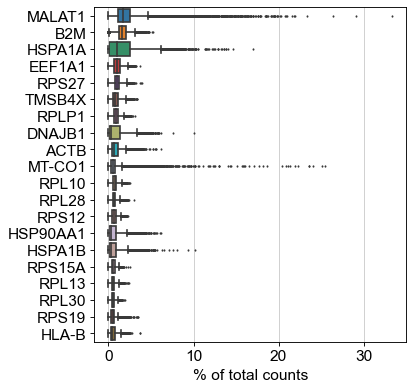

In [58]:
sc.pl.highest_expr_genes(adata, n_top=20)

In [59]:
print(adata.shape)
sc.pp.filter_cells(adata, min_genes=200)
print(adata.shape)
sc.pp.filter_genes(adata, min_cells=3)
print(adata.shape)

(18433, 33538)


filtered out 29 cells that have less than 200 genes expressed


(18404, 33538)


filtered out 14542 genes that are detected in less than 3 cells


(18404, 18996)


In [60]:
mito_genes = adata.var_names.str.startswith('MT-')
# for each cell compute fraction of counts in mito genes vs. all genes
# the `.A1` is only necessary as X is sparse (to transform to a dense array after summing)
adata.obs['percent_mito'] = np.sum(
    adata[:, mito_genes].X, axis=1).A1 / np.sum(adata.X, axis=1).A1
# add the total counts per cell as observations-annotation to adata
adata.obs['n_counts'] = adata.X.sum(axis=1).A1

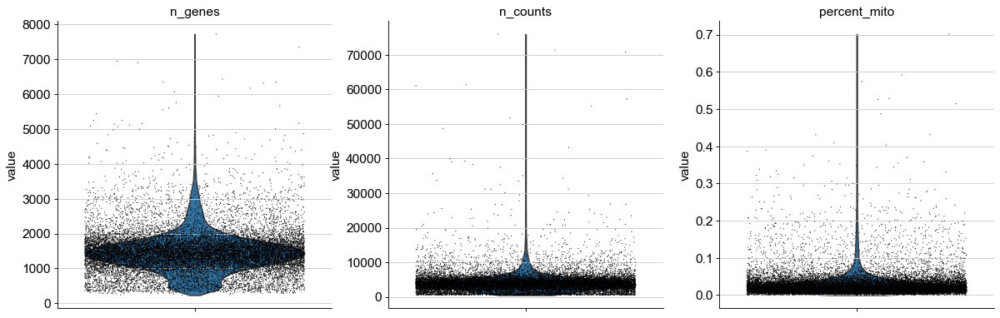

In [61]:
sc.pl.violin(adata, ['n_genes', 'n_counts', 'percent_mito'],
             jitter=0.4, multi_panel=True)

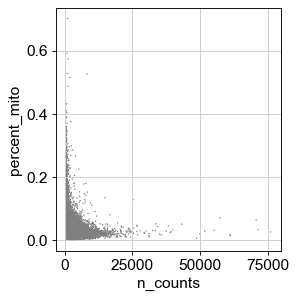

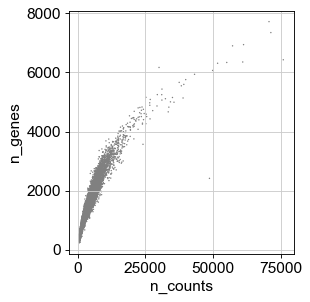

In [62]:
sc.pl.scatter(adata, x='n_counts', y='percent_mito')
sc.pl.scatter(adata, x='n_counts', y='n_genes')

### Examine KID21 for "weirdness"

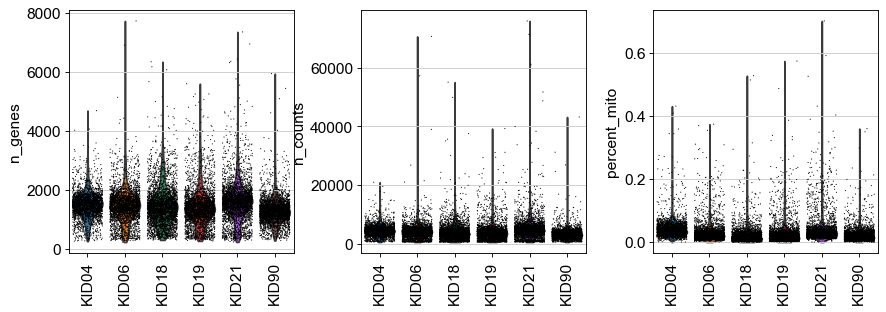

In [63]:
sc.pl.violin(adata, ['n_genes', 'n_counts', 'percent_mito'],
             jitter=0.4, groupby='sample_id', rotation=90)

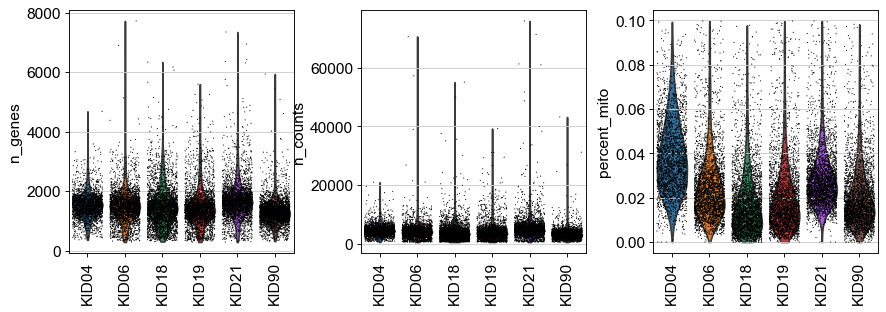

In [64]:
sc.pl.violin(adata[adata.obs.percent_mito < 0.10, :], 
             ['n_genes', 'n_counts', 'percent_mito'],
             jitter=0.4, groupby='sample_id', rotation=90)

KID04


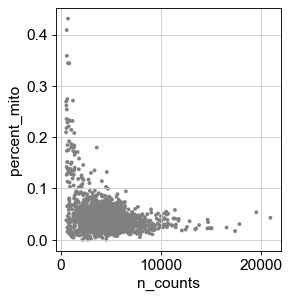

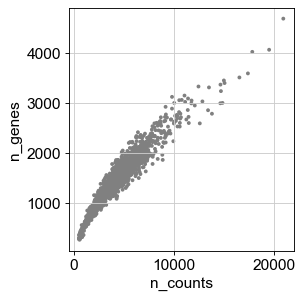

KID06


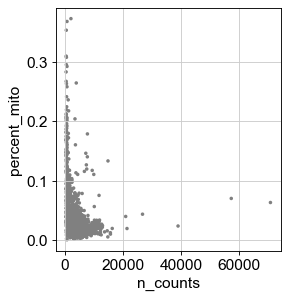

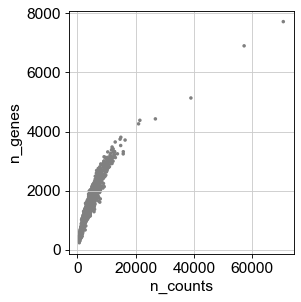

KID18


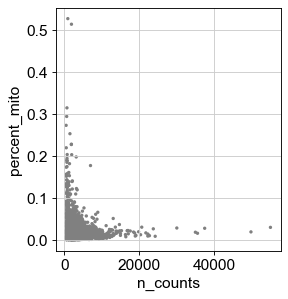

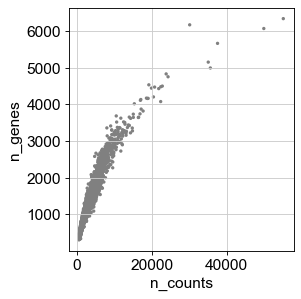

KID19


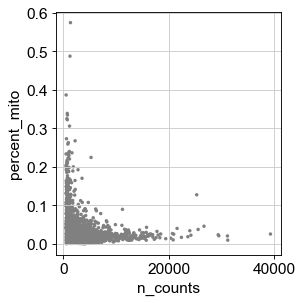

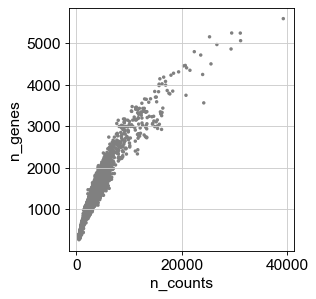

KID21


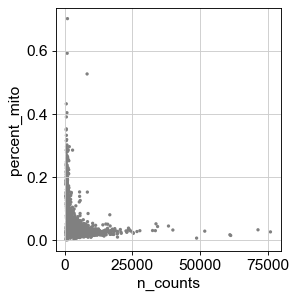

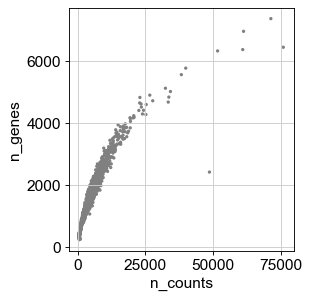

KID90


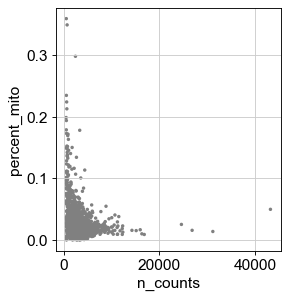

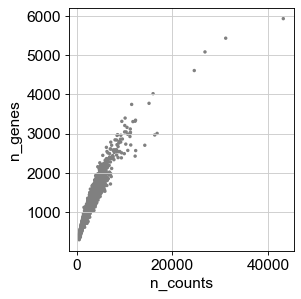

[None, None, None, None, None, None]

In [65]:
sample_list = sorted(adata.obs['sample_id'].unique())
def plt_fn(x):
    print(x)
    sc.pl.scatter(adata[adata.obs['sample_id'] == x], x='n_counts', y='percent_mito')
    sc.pl.scatter(adata[adata.obs['sample_id'] == x], x='n_counts', y='n_genes')
list(map(plt_fn, sample_list))

/Users/brandonkevinchen/miniconda3/envs/scanpy3/lib/python3.8/site-packages/scanpy/preprocessing/_normalization.py:138: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)
normalizing counts per cell
    finished (0:00:00)


KID04


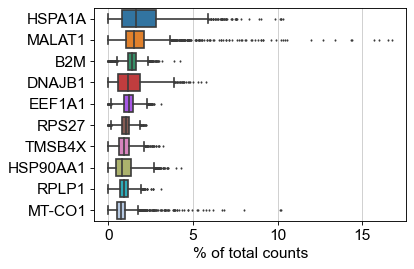

/Users/brandonkevinchen/miniconda3/envs/scanpy3/lib/python3.8/site-packages/scanpy/preprocessing/_normalization.py:138: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)
normalizing counts per cell
    finished (0:00:00)


KID06


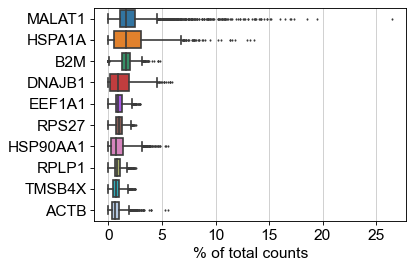

/Users/brandonkevinchen/miniconda3/envs/scanpy3/lib/python3.8/site-packages/scanpy/preprocessing/_normalization.py:138: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)
normalizing counts per cell


KID18


    finished (0:00:00)


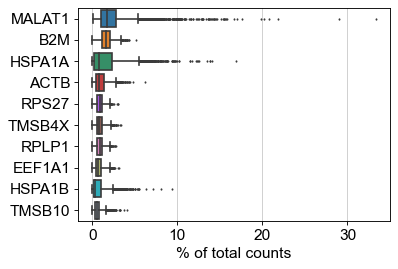

/Users/brandonkevinchen/miniconda3/envs/scanpy3/lib/python3.8/site-packages/scanpy/preprocessing/_normalization.py:138: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)
normalizing counts per cell


KID19


    finished (0:00:00)


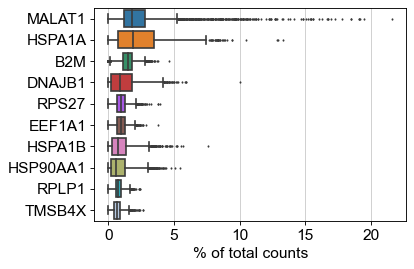

/Users/brandonkevinchen/miniconda3/envs/scanpy3/lib/python3.8/site-packages/scanpy/preprocessing/_normalization.py:138: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)
normalizing counts per cell
    finished (0:00:00)


KID21


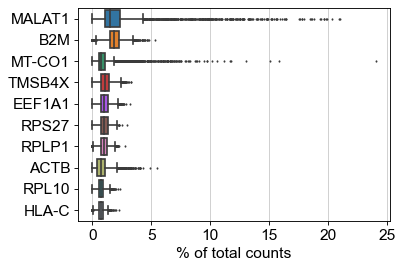

/Users/brandonkevinchen/miniconda3/envs/scanpy3/lib/python3.8/site-packages/scanpy/preprocessing/_normalization.py:138: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)
normalizing counts per cell
    finished (0:00:00)


KID90


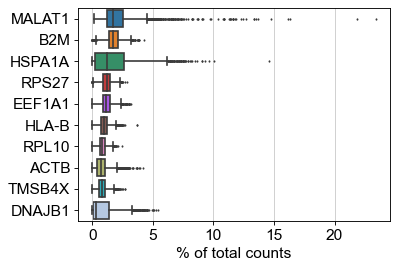

[None, None, None, None, None, None]

In [66]:
sample_list = sorted(adata.obs['sample_id'].unique())
def plt_fn(x):
    print(x)
    sc.pl.highest_expr_genes(adata[adata.obs['sample_id'] == x], n_top=10)
list(map(plt_fn, sample_list))

### Subset for live singlets

In [67]:
# (1) Preliminary subset / (2) Final subset
print(adata.shape)
adata = adata[adata.obs.n_genes < 4000, :]
adata = adata[adata.obs.n_counts < 20000, :]
adata = adata[adata.obs.percent_mito < 0.10, :]  # originally 0.08
print(adata.shape)

(18404, 18996)
(17660, 18996)


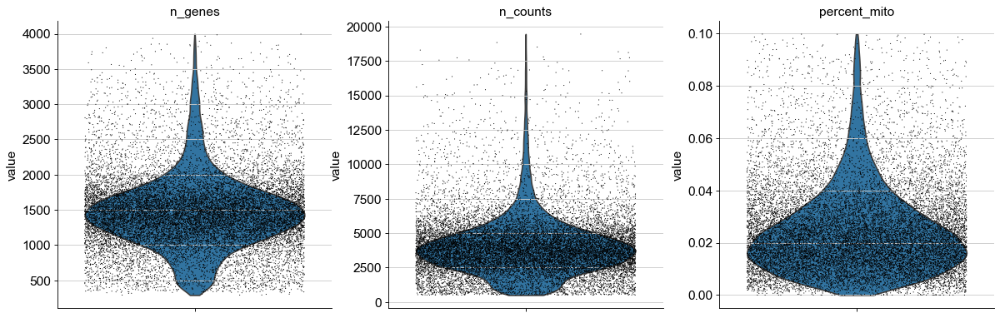

In [68]:
sc.pl.violin(adata, ['n_genes', 'n_counts', 'percent_mito'],
             jitter=0.4, multi_panel=True)

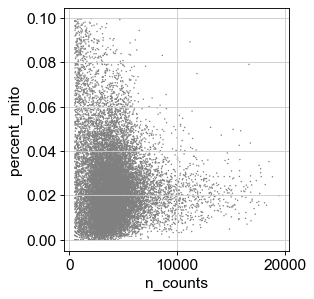

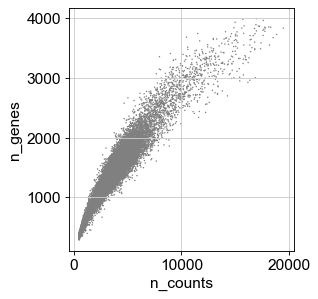

In [69]:
sc.pl.scatter(adata, x='n_counts', y='percent_mito')
sc.pl.scatter(adata, x='n_counts', y='n_genes')

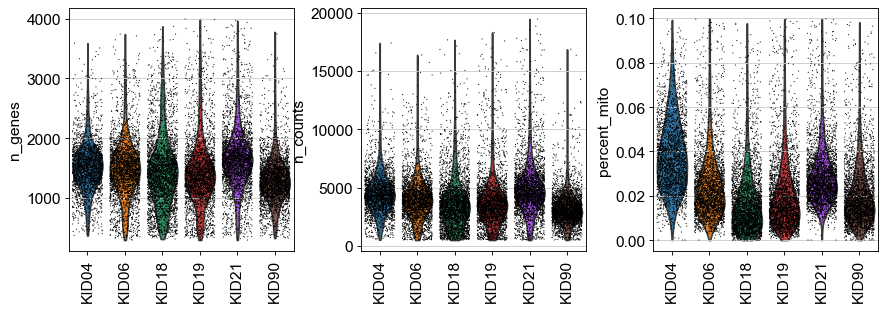

In [70]:
sc.settings.set_figure_params(dpi=80)
sc.pl.violin(adata, ['n_genes', 'n_counts', 'percent_mito'],
             jitter=0.4, groupby='sample_id', rotation=90,
            save='_qc_sample_id')

In [71]:
adata.write('write/after_qc.h5ad')

## 6. Normalize and log <a name="6"></a>
[Return to top](#0)

In [72]:
adata = sc.read('write/after_qc.h5ad')

In [73]:
# Normalize counts (to 10k reads per cell)
sc.pp.normalize_total(adata, target_sum=1e4)

normalizing counts per cell
    finished (0:00:00)


In [74]:
# Logarithmize
sc.pp.log1p(adata)

In [75]:
# Save normed and logged counts
adata.raw = adata

In [76]:
adata.write('write/after_norm_and_log.h5ad')

## 7. Feature selection <a name="7"></a>
[Return to top](#0)

In [77]:
adata = sc.read('write/after_norm_and_log.h5ad')

In [78]:
# Identify highly variable genes
sc.pp.highly_variable_genes(adata, 
                            min_mean=0.0125, max_mean=3, 
                            min_disp=0.5)

extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


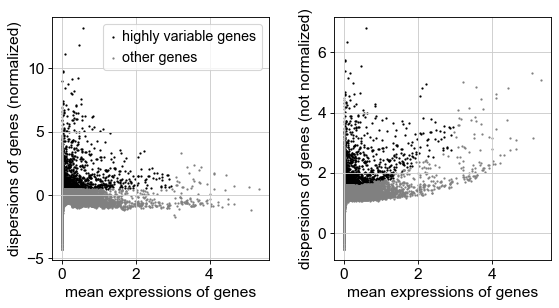

In [79]:
# Plot highly variable genes
sc.settings.set_figure_params(dpi=80)
sc.pl.highly_variable_genes(adata)

In [80]:
# Filter for highly variable genes
print(adata.shape)
adata = adata[:, adata.var.highly_variable]
print(adata.shape)

(17660, 18996)
(17660, 1899)


In [81]:
adata.write('write/after_feature_selection.h5ad')

## 8. Data correction <a name="8"></a>
[Return to top](#0)

### Regress out technical and biological effects

In [82]:
adata = sc.read('write/after_feature_selection.h5ad')

In [83]:
# Regress out counts per cell and % mitochondrial genes
#%%time
sc.pp.regress_out(adata, ['n_counts', 'percent_mito'])

regressing out ['n_counts', 'percent_mito']
    sparse input is densified and may lead to high memory use
    finished (0:00:52)


In [84]:
adata.write('write/before_batch_correction.h5ad')
adata

AnnData object with n_obs × n_vars = 17660 × 1899
    obs: 'barcode', 'doublet', 'sample_id', 'batch_name', 'cell.barcode', 'tcr_expansion', 'trdv', 'batch', 'n_genes', 'percent_mito', 'n_counts'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'sample_id_colors'

### Batch correction using Combat (on sample_id)

#### Before batch correction

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:05)
computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:29)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:12)


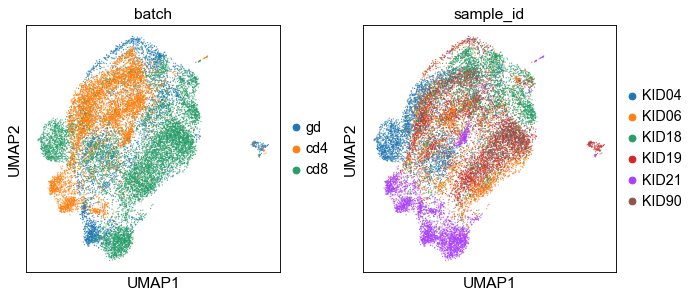

In [85]:
sc.tl.pca(adata, svd_solver='arpack')
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40)
sc.tl.umap(adata)
sc.pl.umap(adata, color=['batch', 'sample_id'], size=5, alpha=0.8,
          save='_before_batch_correction')

#### Apply batch correction (sample_id) - Combat

In [86]:
adata = sc.read('write/before_batch_correction.h5ad')

In [87]:
sc.pp.combat(adata, key='sample_id')  # potential covariates: sample_id?

Standardizing Data across genes.

Found 6 batches

Found 0 numerical variables:
	

Fitting L/S model and finding priors

Finding parametric adjustments

Adjusting data



computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:11)
computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:12)


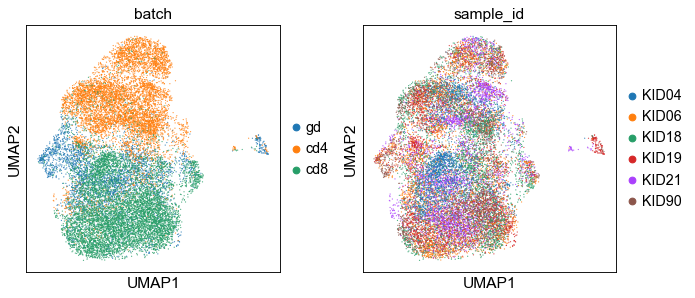

In [88]:
sc.tl.pca(adata, svd_solver='arpack')
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40)
sc.tl.umap(adata)
sc.pl.umap(adata, color=['batch', 'sample_id'], size=5, alpha=0.8,
          save='_combat_sample_id')

In [89]:
adata.write('write/after_combat_sample_id.h5ad')

#### Apply batch correction (sample_id) - Harmony

In [ ]:
adata = sc.read('write/before_batch_correction.h5ad')

In [ ]:
import scanpy.external as sce
sc.tl.pca(adata)
sce.pp.harmony_integrate(adata, 'sample_id')

In [ ]:
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40, use_rep='X_pca_harmony')
sc.tl.umap(adata)
sc.pl.umap(adata, color=['batch', 'sample_id'], size=5, alpha=0.8,
          save='_harmony_sample_id')

In [ ]:
adata.write('write/after_harmony_sample_id.h5ad')

#### Apply batch correction (by digest) - Combat

In [ ]:
adata = sc.read('write/before_batch_correction.h5ad')

In [ ]:
adata.obs['digest'].value_counts()

In [ ]:
adata.obs['digest'] = adata.obs['sample_id']
digest_map = {'KID21': 'digest2',
             'KID04': 'digest1',
             'KID06': 'digest1',
             'KID18': 'digest1',
             'KID19': 'digest1',
             'KID90': 'digest1'}
adata.obs['digest'] = adata.obs['digest'].map(digest_map)
adata.obs['digest'].value_counts()

In [ ]:
sc.pp.combat(adata, key='digest')  # potential covariates: sample_id?

In [ ]:
sc.tl.pca(adata, svd_solver='arpack')
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40)
sc.tl.umap(adata)
sc.pl.umap(adata, color=['batch', 'sample_id'], size=5, alpha=0.8,
          save='_combat_digest')

In [ ]:
adata.write('write/after_combat_digest.h5ad')

### Scale (using Combat corrected data)?

In [90]:
adata = sc.read('write/after_combat_sample_id.h5ad')

In [91]:
# Scale to unit variance; clip values exceeding sd 10
sc.pp.scale(adata, max_value=10)

In [92]:
adata.write('write/after_scaling.h5ad')
adata

AnnData object with n_obs × n_vars = 17660 × 1899
    obs: 'barcode', 'doublet', 'sample_id', 'batch_name', 'cell.barcode', 'tcr_expansion', 'trdv', 'batch', 'n_genes', 'percent_mito', 'n_counts'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'batch_colors', 'hvg', 'neighbors', 'pca', 'sample_id_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

## 9. Dimensionality reduction and visualization <a name="9"></a>
[Return to top](#0)

In [93]:
adata = sc.read('write/after_scaling.h5ad')  # WITH SCALING

In [94]:
sc.tl.pca(adata, svd_solver='arpack')
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40)
sc.tl.umap(adata)
sc.tl.leiden(adata)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:13)
computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:12)
running Leiden clustering
    finished: found 20 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:04)


In [95]:
sc.settings.set_figure_params(dpi=80, dpi_save=1000, frameon=False)

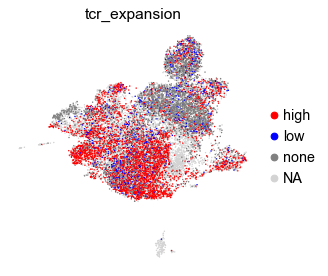

In [96]:
sc.pl.umap(adata, color='tcr_expansion', palette=['red', 'blue', 'grey', 'green'])

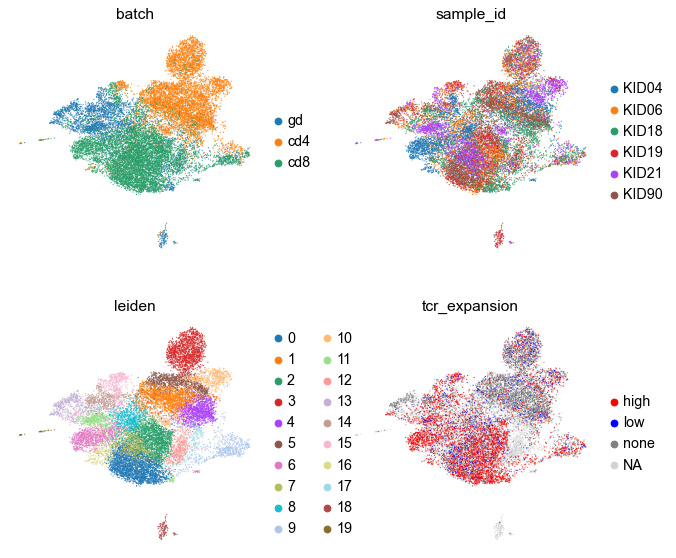

In [97]:
# Main annotations
sc.pl.umap(adata, color=['batch', 'sample_id', 'leiden', 'tcr_expansion'], size=5, alpha=0.8, ncols=2,
          save='_annotations1')

computing density on 'umap'
--> added
    'umap_density_batch', densities (adata.obs)
    'umap_density_batch_params', parameter (adata.uns)
/Users/brandonkevinchen/miniconda3/envs/scanpy3/lib/python3.8/site-packages/scanpy/plotting/_tools/__init__.py:1186: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. This has been deprecated since 3.3 and in 3.6, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = mpl.cm.get_cmap("YlOrRd").copy()
  color_map.set_over('black')
/Users/brandonkevinchen/miniconda3/envs/scanpy3/lib/python3.8/site-packages/scanpy/plotting/_tools/__init__.py:1187: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. This has been deprecated since 3.3 and in 3.6, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = mpl.cm.g

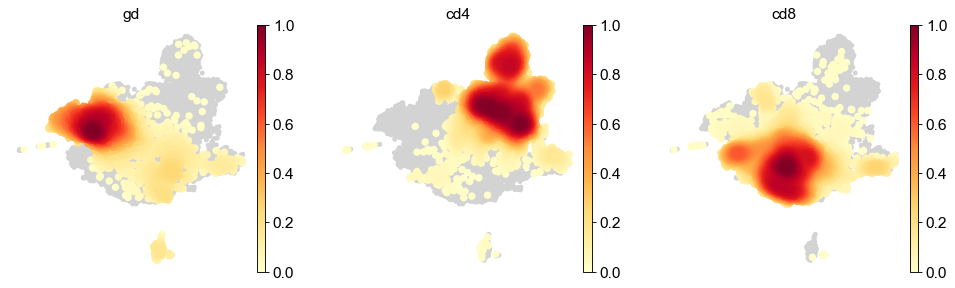

In [98]:
# Density plot - batch
sc.tl.embedding_density(adata, basis='umap', groupby='batch')
sc.pl.embedding_density(adata, basis='umap', key='umap_density_batch')

computing density on 'umap'
--> added
    'umap_density_sample_id', densities (adata.obs)
    'umap_density_sample_id_params', parameter (adata.uns)


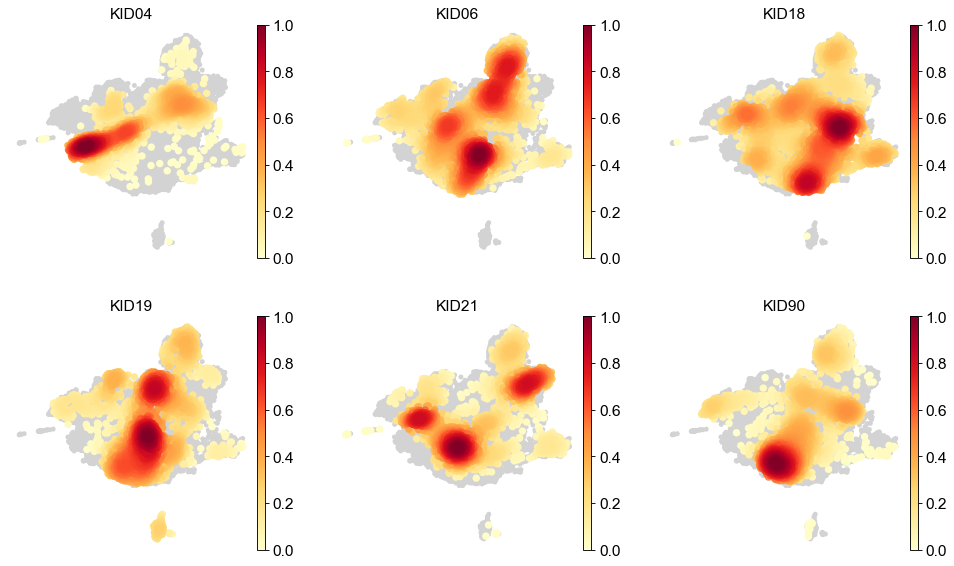

In [99]:
# Density plot - sample_id
sc.tl.embedding_density(adata, basis='umap', groupby='sample_id')
sc.pl.embedding_density(adata, basis='umap', key='umap_density_sample_id', ncols=3)

In [100]:
adata.write(results_file)
adata

AnnData object with n_obs × n_vars = 17660 × 1899
    obs: 'barcode', 'doublet', 'sample_id', 'batch_name', 'cell.barcode', 'tcr_expansion', 'trdv', 'batch', 'n_genes', 'percent_mito', 'n_counts', 'leiden', 'umap_density_batch', 'umap_density_sample_id'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'batch_colors', 'hvg', 'neighbors', 'pca', 'sample_id_colors', 'umap', 'leiden', 'tcr_expansion_colors', 'leiden_colors', 'umap_density_batch_params', 'umap_density_sample_id_params'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

### Apr 28, 2021(?) (Wed)

In [9]:
adata = sc.read(results_file)
adata

AnnData object with n_obs × n_vars = 17660 × 1899
    obs: 'barcode', 'doublet', 'sample_id', 'batch_name', 'cell.barcode', 'tcr_expansion', 'trdv', 'batch', 'n_genes', 'percent_mito', 'n_counts', 'leiden', 'umap_density_batch', 'umap_density_sample_id'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'batch_colors', 'hvg', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'sample_id_colors', 'tcr_expansion_colors', 'umap', 'umap_density_batch_params', 'umap_density_sample_id_params'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

### Examine outputs

In [10]:
sc.settings.set_figure_params(dpi=80)

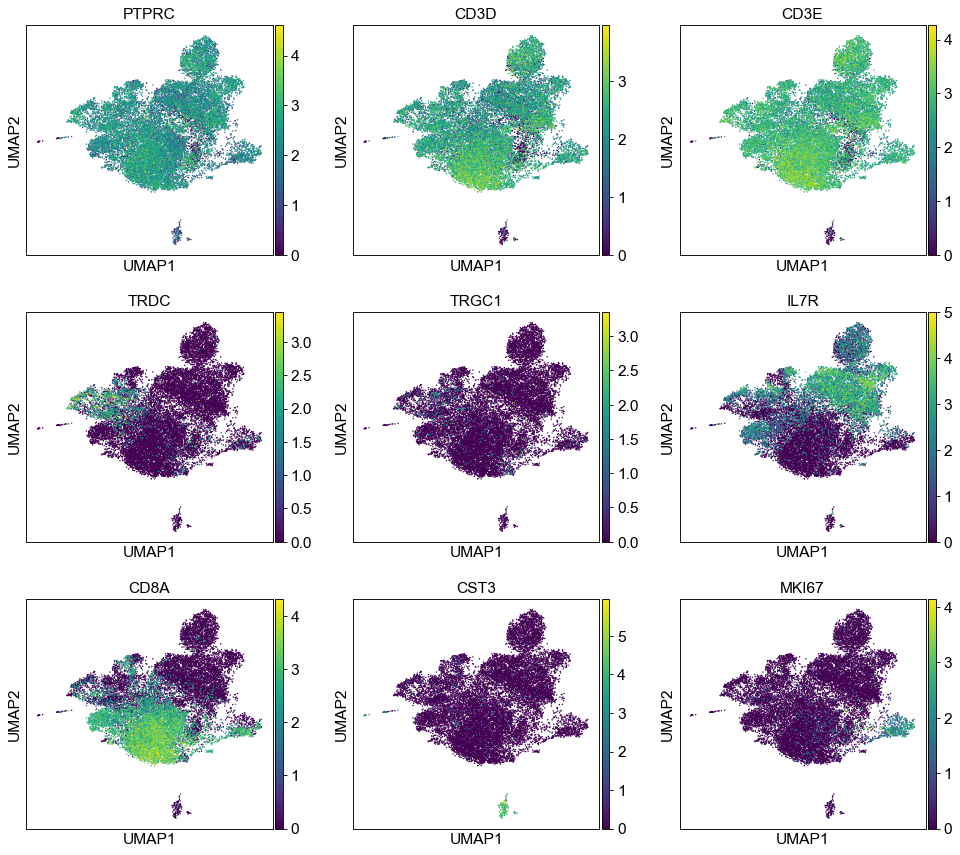

In [11]:
# Check for major subsets
sc.pl.umap(adata, color=['PTPRC', 'CD3D', 'CD3E', 'TRDC', 'TRGC1', 'IL7R', 'CD8A', 'CST3', 'MKI67'], ncols=3)

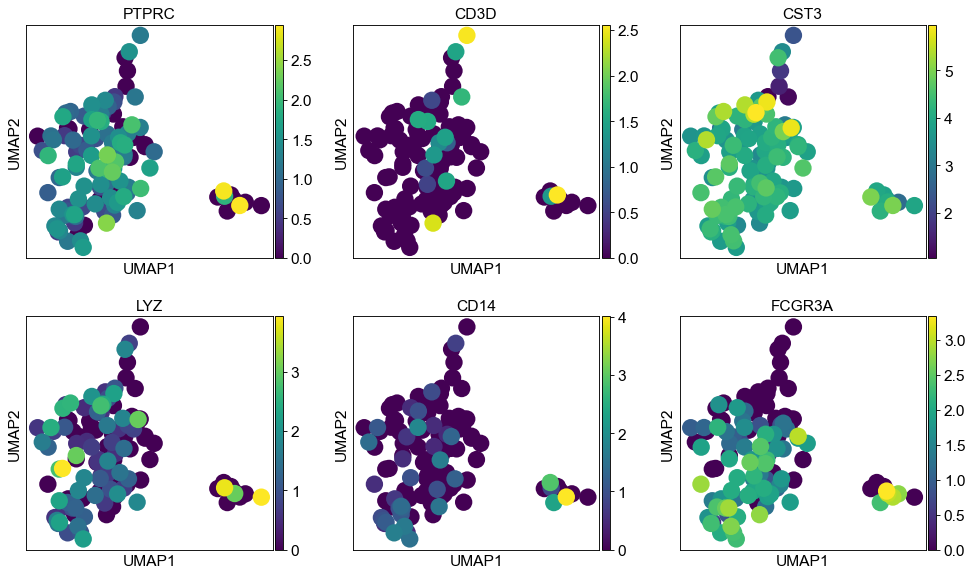

In [29]:
# Examine outlier cluster 18 - mac?
sc.pl.umap(adata[adata.obs['leiden'] == '18'], 
           color=['PTPRC', 'CD3D', 'CST3', 'LYZ', 'CD14', 'FCGR3A'], ncols=3)

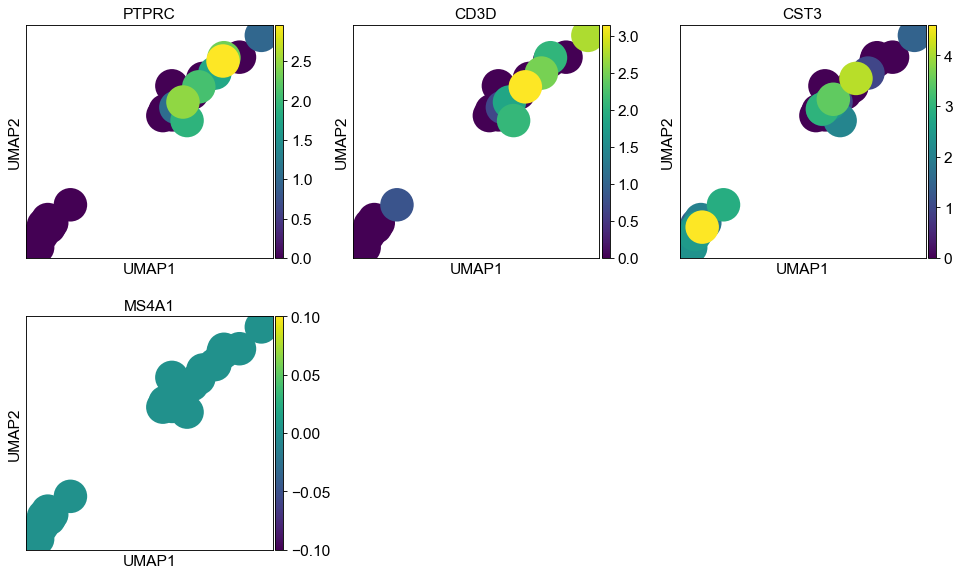

In [34]:
# Examine outlier cluster 19
sc.pl.umap(adata[adata.obs['leiden'] == '19'], 
           color=['PTPRC', 'CD3D', 'CST3', 'FCGR3A'], ncols=3)

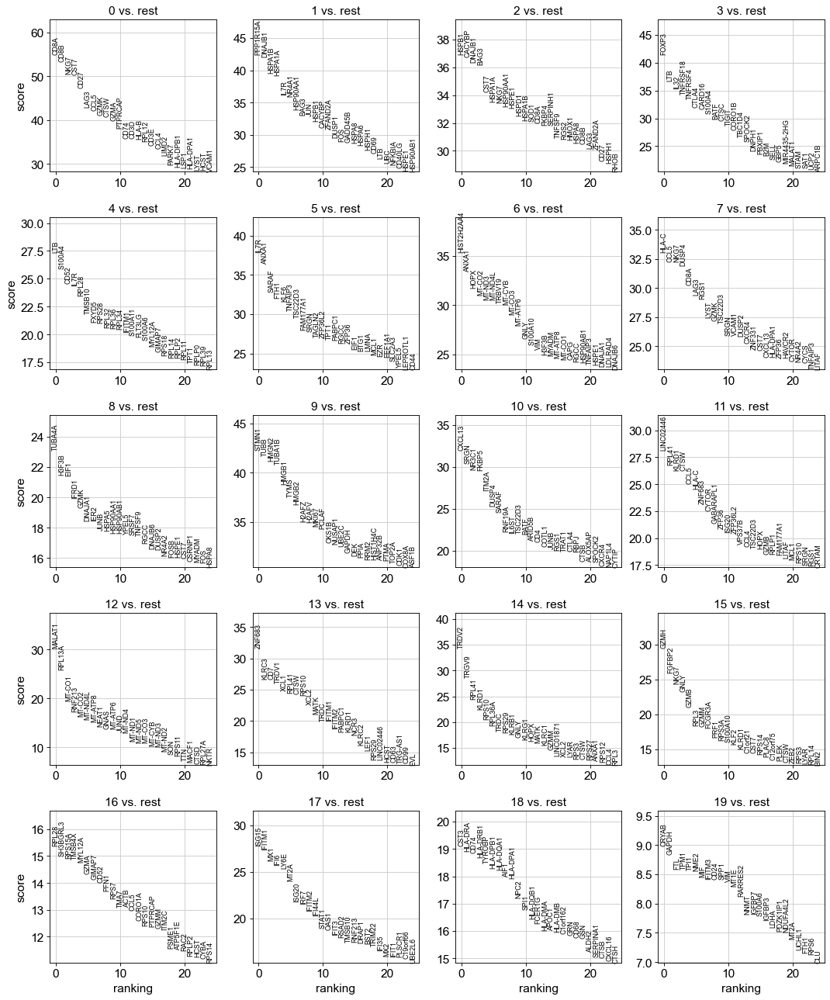

In [31]:
sc.tl.rank_genes_groups(adata, 'leiden', method='wilcoxon')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

In [32]:
adata.write(results_file)

### Apr 30, 2021(?) (Fri)

In [128]:
adata = sc.read(results_file)
adata

AnnData object with n_obs × n_vars = 17660 × 1899
    obs: 'barcode', 'doublet', 'sample_id', 'batch_name', 'cell.barcode', 'tcr_expansion', 'trdv', 'batch', 'n_genes', 'percent_mito', 'n_counts', 'leiden', 'umap_density_batch', 'umap_density_sample_id'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'batch_colors', 'hvg', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'rank_genes_groups', 'sample_id_colors', 'tcr_expansion_colors', 'umap', 'umap_density_batch_params', 'umap_density_sample_id_params'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

## 10. Subset out Macs (via barcode) and re-run <a name="10"></a>
[Return to top](#0)

### Get mac barcodes

In [129]:
sc.settings.set_figure_params(dpi=60)

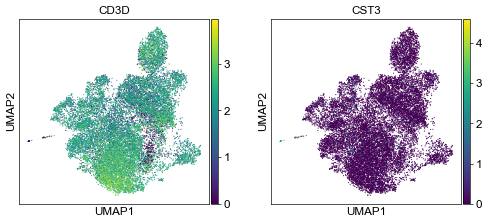

In [130]:
# Confirm mac cluster number
sc.pl.umap(adata[adata.obs['leiden'] != '18'], color=['CD3D', 'CST3'])

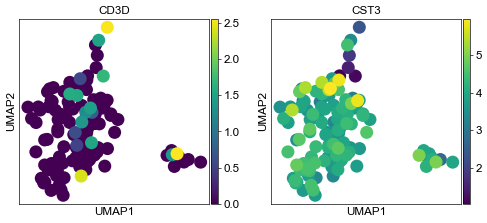

In [131]:
# Confirm mac cluster number
sc.pl.umap(adata[adata.obs['leiden'] == '18'], color=['CD3D', 'CST3'])

In [132]:
# Get non-mac barcodes
mac_barcodes = adata[adata.obs['leiden'] == '18'].obs.index
mac_barcodes

Index(['AAACGGGTCAGGTAAA-1-gd', 'ACGAGCCTCTTAGAGC-1-gd',
       'ACGATGTCAAAGGTGC-1-gd', 'ACTTGTTAGGACGAAA-1-gd',
       'AGACGTTGTCCGTGAC-1-gd', 'AGATTGCGTTCTCATT-1-gd',
       'AGCAGCCGTACTTCTT-1-gd', 'AGCATACGTTCGTCTC-1-gd',
       'AGCGGTCCAGTAGAGC-1-gd', 'AGCTCTCAGTACGCGA-1-gd',
       ...
       'TCTCATAAGGCCGAAT-1-cd4', 'TGGGCGTGTCCATGAT-1-cd4',
       'TTCGGTCGTTGAACTC-1-cd4', 'TTCTTAGTCTTACCGC-1-cd4',
       'AACTCAGAGTTTCCTT-1-cd8', 'AGGGATGGTTATCCGA-1-cd8',
       'CACACCTGTCGACTGC-1-cd8', 'CGACCTTGTGGTACAG-1-cd8',
       'TCACGAAGTCAAACTC-1-cd8', 'TCGAGGCCATGTTGAC-1-cd8'],
      dtype='object', length=123)

### Reload and subset

In [136]:
# Load pooled (raw) data
adata = sc.read('write/after_concat.h5ad')
adata

AnnData object with n_obs × n_vars = 18433 × 33538
    obs: 'barcode', 'doublet', 'sample_id', 'batch_name', 'cell.barcode', 'tcr_expansion', 'trdv', 'batch'
    var: 'gene_ids', 'feature_types'

In [137]:
adata.obs.head()

,barcode,doublet,sample_id,batch_name,cell.barcode,tcr_expansion,trdv,batch
AAACCTGCACAGCCCA-1-gd,AAACCTGCACAGCCCA-1,SNG,KID21,Chiara_Kidney_Pooled_gdTCR,AAACCTGCACAGCCCA-1,NaN,NaN,gd
AAACCTGCAGGACCCT-1-gd,AAACCTGCAGGACCCT-1,SNG,KID21,Chiara_Kidney_Pooled_gdTCR,AAACCTGCAGGACCCT-1,high,TRDV1,gd
AAACCTGCATTCACTT-1-gd,AAACCTGCATTCACTT-1,SNG,KID19,Chiara_Kidney_Pooled_gdTCR,AAACCTGCATTCACTT-1,NaN,NaN,gd
AAACGGGAGCTAGTTC-1-gd,AAACGGGAGCTAGTTC-1,SNG,KID21,Chiara_Kidney_Pooled_gdTCR,AAACGGGAGCTAGTTC-1,NaN,NaN,gd
AAACGGGCAATACGCT-1-gd,AAACGGGCAATACGCT-1,SNG,KID19,Chiara_Kidney_Pooled_gdTCR,AAACGGGCAATACGCT-1,NaN,NaN,gd


In [153]:
# Subset on NON mac_barcodes
adata = adata[~adata.obs.index.isin(mac_barcodes)]
adata

View of AnnData object with n_obs × n_vars = 18310 × 33538
    obs: 'barcode', 'doublet', 'sample_id', 'batch_name', 'cell.barcode', 'tcr_expansion', 'trdv', 'batch'
    var: 'gene_ids', 'feature_types'

## 11. Re-run preprocessing (w/o macs) <a name="11"></a>
[Return to top](#0)

### (5) QC

In [155]:
sc.settings.set_figure_params(dpi=60)

/Users/brandonkevinchen/miniconda3/envs/scanpy3/lib/python3.8/site-packages/scanpy/preprocessing/_normalization.py:138: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


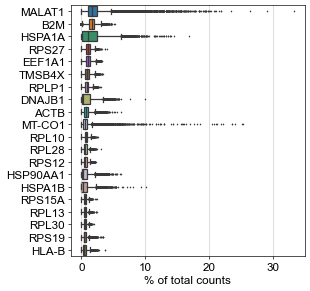

In [156]:
sc.pl.highest_expr_genes(adata, n_top=20)

In [157]:
print(adata.shape)
sc.pp.filter_cells(adata, min_genes=200)
print(adata.shape)
sc.pp.filter_genes(adata, min_cells=3)
print(adata.shape)

(18310, 33538)
(18281, 33538)
(18281, 18766)


In [158]:
mito_genes = adata.var_names.str.startswith('MT-')
# for each cell compute fraction of counts in mito genes vs. all genes
# the `.A1` is only necessary as X is sparse (to transform to a dense array after summing)
adata.obs['percent_mito'] = np.sum(
    adata[:, mito_genes].X, axis=1).A1 / np.sum(adata.X, axis=1).A1
# add the total counts per cell as observations-annotation to adata
adata.obs['n_counts'] = adata.X.sum(axis=1).A1

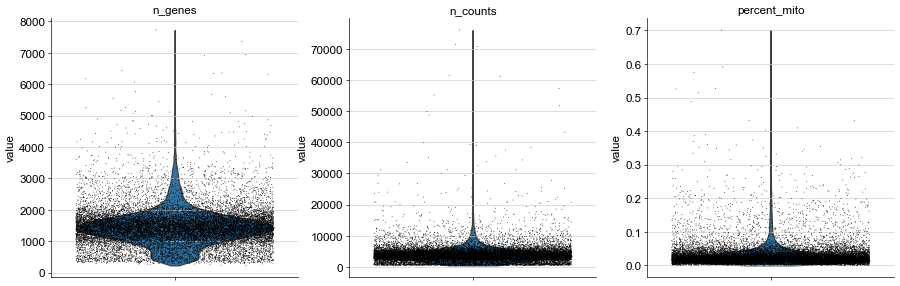

In [159]:
sc.pl.violin(adata, ['n_genes', 'n_counts', 'percent_mito'],
             jitter=0.4, multi_panel=True)

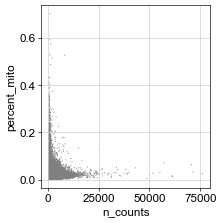

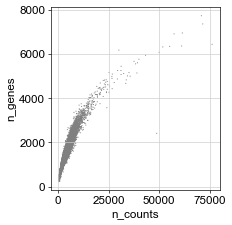

In [160]:
sc.pl.scatter(adata, x='n_counts', y='percent_mito')
sc.pl.scatter(adata, x='n_counts', y='n_genes')

### Examine KID21 for "weirdness"

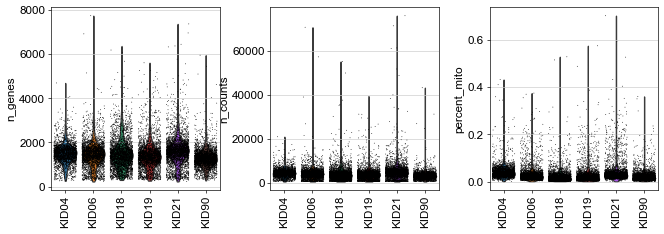

In [161]:
sc.pl.violin(adata, ['n_genes', 'n_counts', 'percent_mito'],
             jitter=0.4, groupby='sample_id', rotation=90)

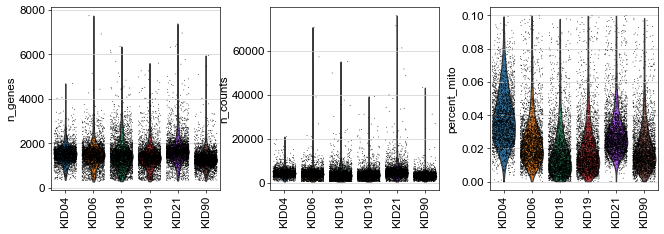

In [162]:
sc.pl.violin(adata[adata.obs.percent_mito < 0.10, :], 
             ['n_genes', 'n_counts', 'percent_mito'],
             jitter=0.4, groupby='sample_id', rotation=90)

KID04


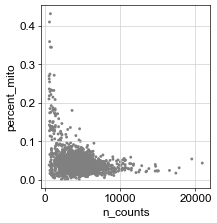

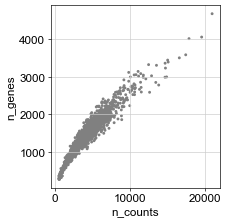

KID06


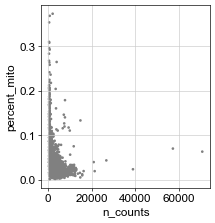

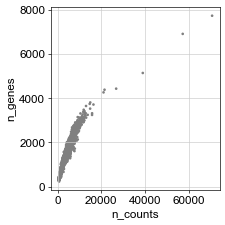

KID18


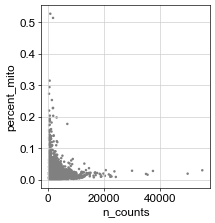

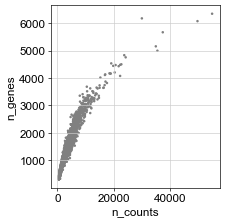

KID19


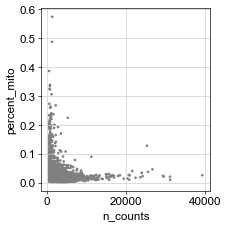

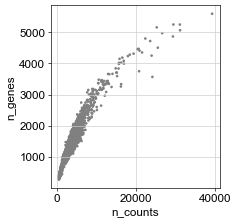

KID21


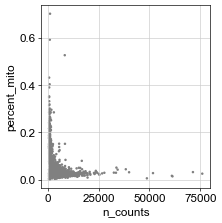

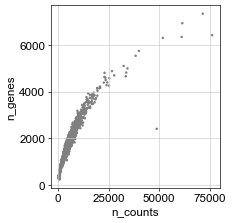

KID90


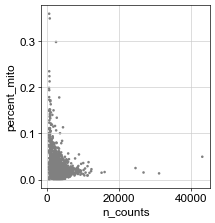

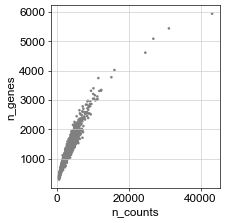

[None, None, None, None, None, None]

In [163]:
sample_list = sorted(adata.obs['sample_id'].unique())
def plt_fn(x):
    print(x)
    sc.pl.scatter(adata[adata.obs['sample_id'] == x], x='n_counts', y='percent_mito')
    sc.pl.scatter(adata[adata.obs['sample_id'] == x], x='n_counts', y='n_genes')
list(map(plt_fn, sample_list))

KID04


/Users/brandonkevinchen/miniconda3/envs/scanpy3/lib/python3.8/site-packages/scanpy/preprocessing/_normalization.py:138: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


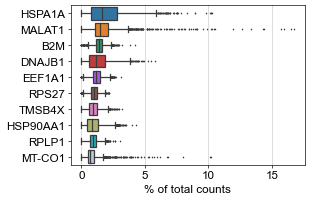

KID06


/Users/brandonkevinchen/miniconda3/envs/scanpy3/lib/python3.8/site-packages/scanpy/preprocessing/_normalization.py:138: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


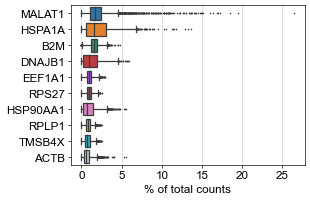

KID18


/Users/brandonkevinchen/miniconda3/envs/scanpy3/lib/python3.8/site-packages/scanpy/preprocessing/_normalization.py:138: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


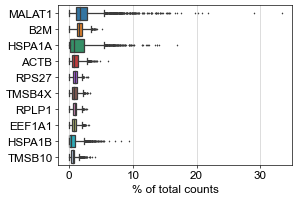

KID19


/Users/brandonkevinchen/miniconda3/envs/scanpy3/lib/python3.8/site-packages/scanpy/preprocessing/_normalization.py:138: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


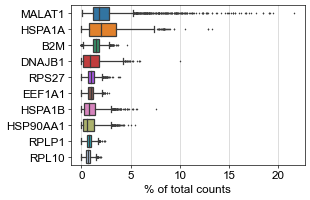

KID21


/Users/brandonkevinchen/miniconda3/envs/scanpy3/lib/python3.8/site-packages/scanpy/preprocessing/_normalization.py:138: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


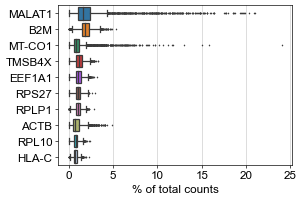

KID90


/Users/brandonkevinchen/miniconda3/envs/scanpy3/lib/python3.8/site-packages/scanpy/preprocessing/_normalization.py:138: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


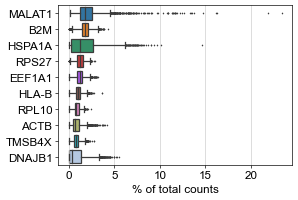

[None, None, None, None, None, None]

In [164]:
sample_list = sorted(adata.obs['sample_id'].unique())
def plt_fn(x):
    print(x)
    sc.pl.highest_expr_genes(adata[adata.obs['sample_id'] == x], n_top=10)
list(map(plt_fn, sample_list))

### Subset for live singlets

In [165]:
# (1) Preliminary subset / (2) Final subset
print(adata.shape)
adata = adata[adata.obs.n_genes < 4000, :]
adata = adata[adata.obs.n_counts < 20000, :]
adata = adata[adata.obs.percent_mito < 0.10, :]  # originally 0.08
print(adata.shape)

(18281, 18766)
(17537, 18766)


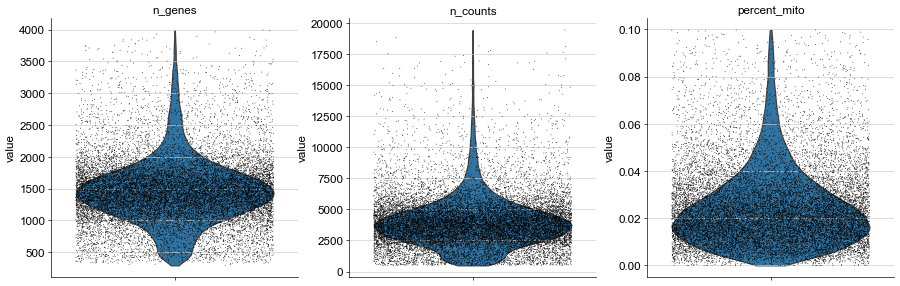

In [166]:
sc.pl.violin(adata, ['n_genes', 'n_counts', 'percent_mito'],
             jitter=0.4, multi_panel=True)

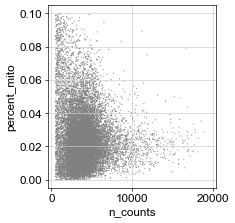

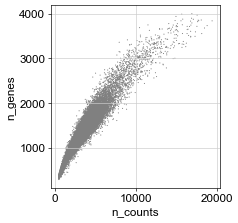

In [167]:
sc.pl.scatter(adata, x='n_counts', y='percent_mito')
sc.pl.scatter(adata, x='n_counts', y='n_genes')

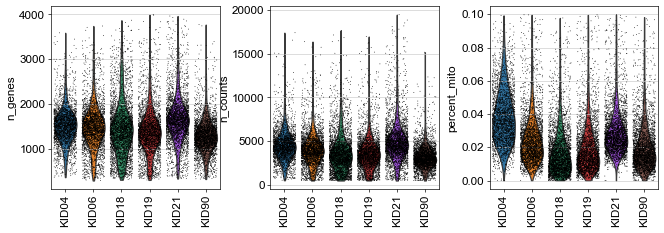

In [168]:
sc.pl.violin(adata, ['n_genes', 'n_counts', 'percent_mito'],
             jitter=0.4, groupby='sample_id', rotation=90,
            save='_qc_sample_id')

### (6) Normalize and log
[Return to top](#0)

In [169]:
# Normalize counts (to 10k reads per cell)
sc.pp.normalize_total(adata, target_sum=1e4)

/Users/brandonkevinchen/miniconda3/envs/scanpy3/lib/python3.8/site-packages/scanpy/preprocessing/_normalization.py:138: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [170]:
# Logarithmize
sc.pp.log1p(adata)

In [171]:
# Save normed and logged counts
adata.raw = adata

### (8) Feature selection
[Return to top](#0)

In [172]:
# Identify highly variable genes
sc.pp.highly_variable_genes(adata, 
                            min_mean=0.0125, max_mean=3, 
                            min_disp=0.5)

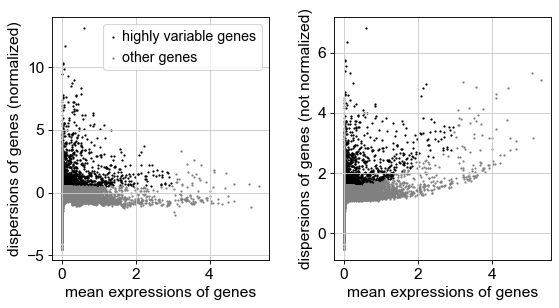

In [173]:
# Plot highly variable genes
sc.settings.set_figure_params(dpi=80)
sc.pl.highly_variable_genes(adata)

In [174]:
# Filter for highly variable genes
print(adata.shape)
adata = adata[:, adata.var.highly_variable]
print(adata.shape)

(17537, 18766)
(17537, 1916)


### (7) Data correction
[Return to top](#0)

### Regress out technical and biological effects

In [175]:
# Regress out counts per cell and % mitochondrial genes
#%%time
sc.pp.regress_out(adata, ['n_counts', 'percent_mito'])

### Batch correction using Combat (on sample_id)

#### Before batch correction

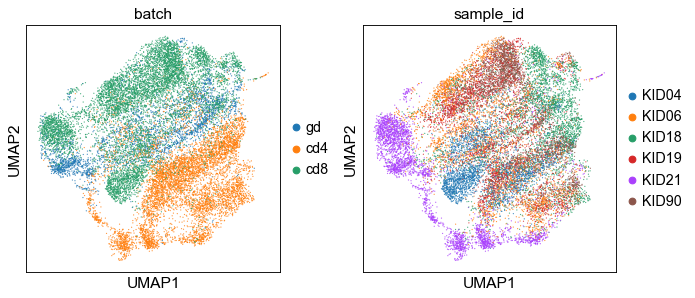

In [176]:
sc.tl.pca(adata, svd_solver='arpack')
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40)
sc.tl.umap(adata)
sc.pl.umap(adata, color=['batch', 'sample_id'], size=5, alpha=0.8,
          save='_before_batch_correction')

#### Apply batch correction (sample_id) - Combat

In [177]:
sc.pp.combat(adata, key='sample_id')  # potential covariates: sample_id?

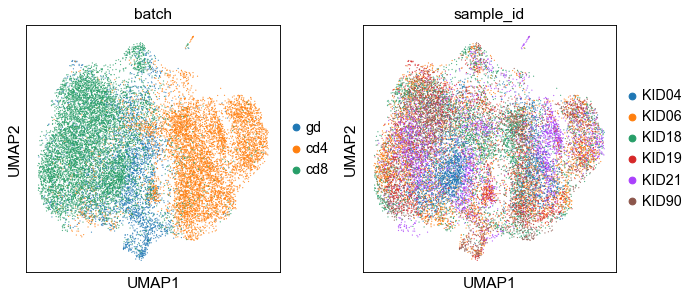

In [178]:
sc.tl.pca(adata, svd_solver='arpack')
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40)
sc.tl.umap(adata)
sc.pl.umap(adata, color=['batch', 'sample_id'], size=5, alpha=0.8,
          save='_combat_sample_id')

### Scale (using Combat corrected data)

In [179]:
# Scale to unit variance; clip values exceeding sd 10
sc.pp.scale(adata, max_value=10)

In [180]:
adata.write('write/after_pp_wo_mac.h5ad')

## 12. Re-run dimensionality reduction and visualization <a name="12"></a>
[Return to top](#0)

### Compute PCA and UMAP

In [5]:
adata = sc.read('write/after_pp_wo_mac.h5ad')
adata

AnnData object with n_obs × n_vars = 17537 × 1916
    obs: 'barcode', 'doublet', 'sample_id', 'batch_name', 'cell.barcode', 'tcr_expansion', 'trdv', 'batch', 'n_genes', 'percent_mito', 'n_counts'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'batch_colors', 'hvg', 'neighbors', 'pca', 'sample_id_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [6]:
sc.tl.pca(adata, svd_solver='arpack')
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40)
sc.tl.umap(adata)
sc.tl.leiden(adata)

### Visualize

In [7]:
sc.settings.set_figure_params(dpi=80, dpi_save=1000, frameon=False)

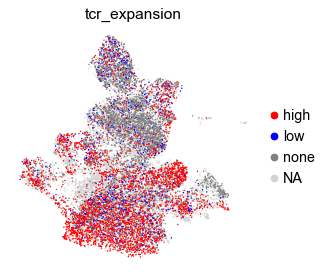

In [8]:
sc.pl.umap(adata, color='tcr_expansion', palette=['red', 'blue', 'grey', 'green'])

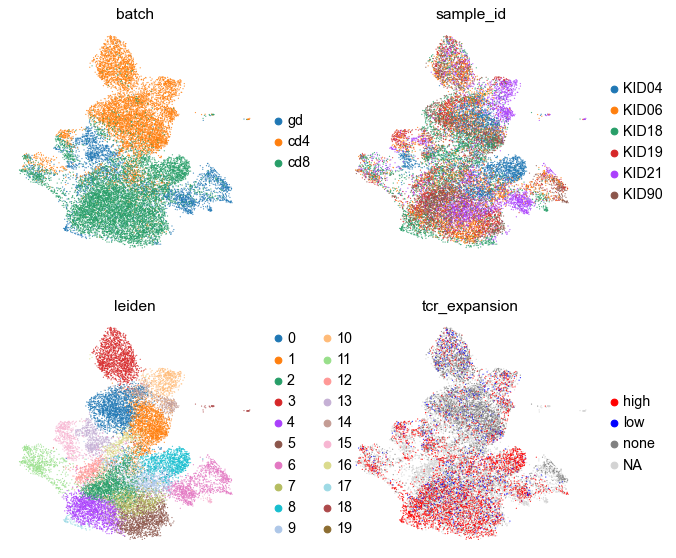

In [9]:
# Main annotations
sc.pl.umap(adata, color=['batch', 'sample_id', 'leiden', 'tcr_expansion'], size=5, alpha=0.8, ncols=2,
          save='_annotations')

/Users/brandonkevinchen/miniconda3/envs/scanpy3/lib/python3.8/site-packages/scanpy/plotting/_tools/__init__.py:1186: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. This has been deprecated since 3.3 and in 3.6, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = mpl.cm.get_cmap("YlOrRd").copy()
  color_map.set_over('black')
/Users/brandonkevinchen/miniconda3/envs/scanpy3/lib/python3.8/site-packages/scanpy/plotting/_tools/__init__.py:1187: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. This has been deprecated since 3.3 and in 3.6, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = mpl.cm.get_cmap("YlOrRd").copy()
  color_map.set_under('lightgray')
/Users/brandonkevinchen/miniconda3/envs/scanpy3/lib/python3.8/site-packages/scanp

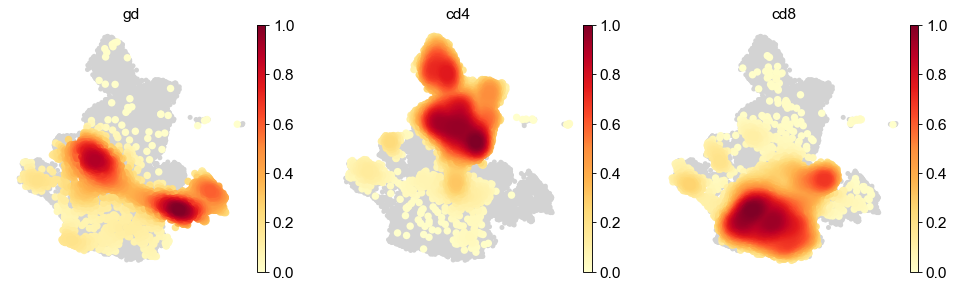

In [10]:
# Density plot - batch
sc.tl.embedding_density(adata, basis='umap', groupby='batch')
sc.pl.embedding_density(adata, basis='umap', key='umap_density_batch', save='True')

/Users/brandonkevinchen/miniconda3/envs/scanpy3/lib/python3.8/site-packages/scanpy/plotting/_tools/__init__.py:1186: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. This has been deprecated since 3.3 and in 3.6, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = mpl.cm.get_cmap("YlOrRd").copy()
  color_map.set_over('black')
/Users/brandonkevinchen/miniconda3/envs/scanpy3/lib/python3.8/site-packages/scanpy/plotting/_tools/__init__.py:1187: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. This has been deprecated since 3.3 and in 3.6, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = mpl.cm.get_cmap("YlOrRd").copy()
  color_map.set_under('lightgray')
/Users/brandonkevinchen/miniconda3/envs/scanpy3/lib/python3.8/site-packages/scanp

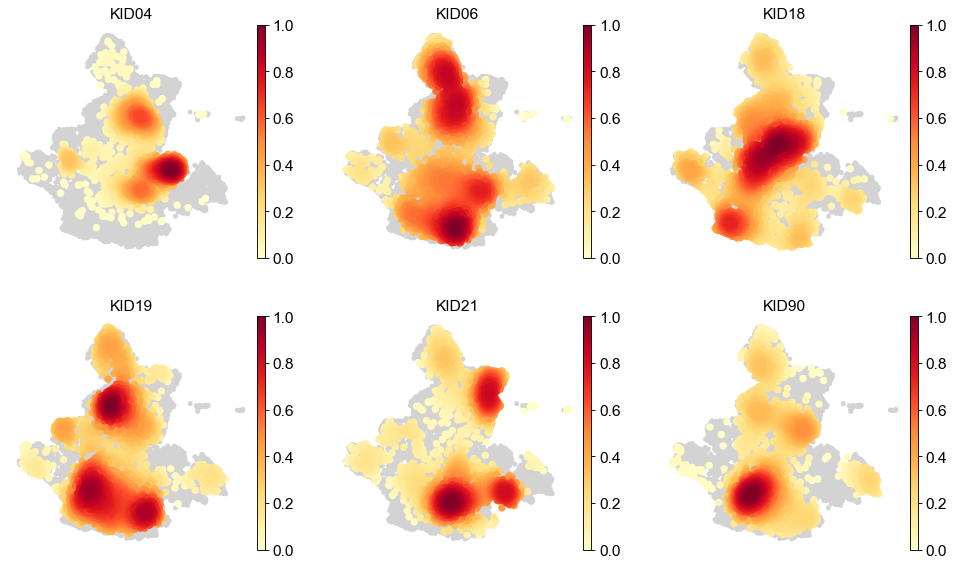

In [11]:
# Density plot - sample_id
sc.tl.embedding_density(adata, basis='umap', groupby='sample_id')
sc.pl.embedding_density(adata, basis='umap', key='umap_density_sample_id', ncols=3)

### Cluster identification

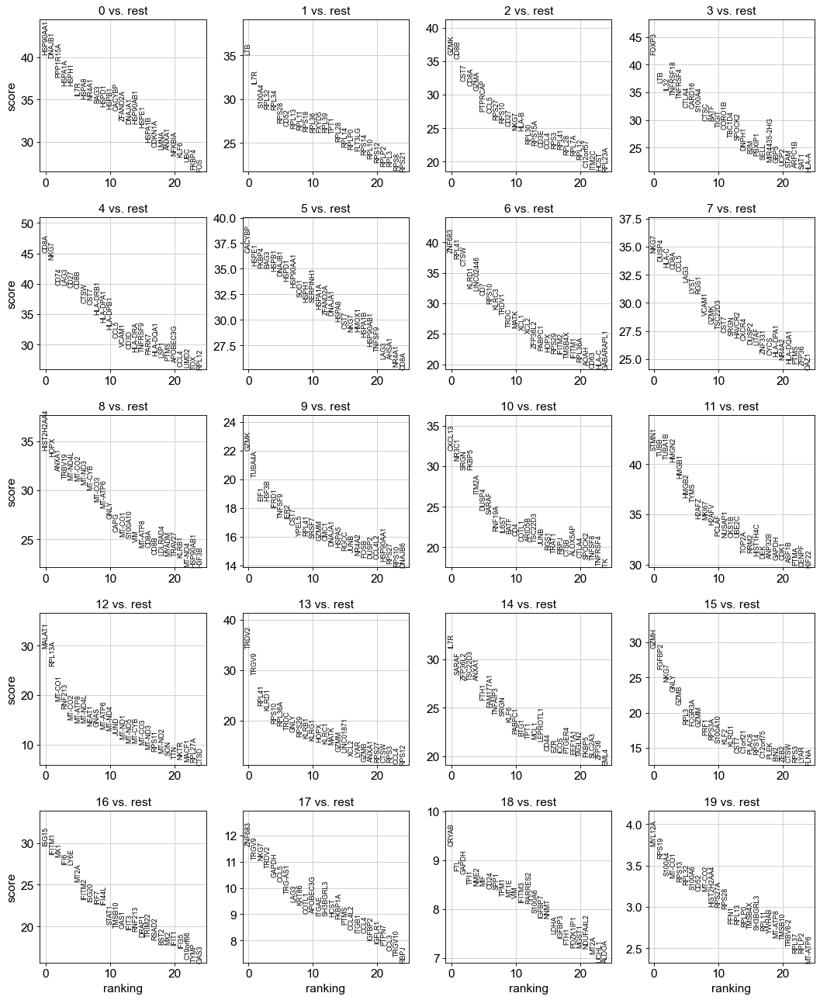

In [12]:
sc.tl.rank_genes_groups(adata, 'leiden', method='wilcoxon')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

In [13]:
result = adata.uns['rank_genes_groups']
groups = result['names'].dtype.names
df = pd.DataFrame(
    {group + '_' + key[:4]: result[key][group]
    for group in groups for key in ['names', 'pvals_adj', 'logfoldchanges']})
df.to_csv('outputs/clusters_res1.csv', index=False)
df.head()

,0_name,0_pval,0_logf,1_name,1_pval,1_logf,2_name,2_pval,2_logf,3_name,...,16_logf,17_name,17_pval,17_logf,18_name,18_pval,18_logf,19_name,19_pval,19_logf
0,HSP90AA1,0.000000e+00,2.073326,LTB,1.904984e-266,2.244252,GZMK,5.918455e-280,2.364863,FOXP3,...,4.132317,ZNF683,6.643648e-27,4.254734,CRYAB,2.676077e-16,10.072663,MYL12A,0.074445,0.858201
1,DNAJB1,0.000000e+00,2.681333,IL7R,1.836406e-217,2.254957,CD8B,5.611173e-272,2.504266,LTB,...,2.589622,TRGV9,9.903105e-25,4.527353,FTL,1.476684e-14,3.276433,RPS19,0.094609,0.635125
2,PPP1R15A,8.374897e-307,2.019705,S100A4,4.082694e-183,1.266958,CST7,5.897306e-222,1.643774,IL32,...,4.957285,NKG7,9.903105e-25,2.871720,GAPDH,1.611136e-14,2.289040,S100A4,0.152807,1.006369
3,HSPA1A,4.278414e-291,2.500765,RPL32,7.212633e-181,0.510197,CD8A,4.265297e-212,2.278972,TNFRSF18,...,4.389966,TRDV2,2.150204e-23,5.232637,TPI1,6.811230e-14,2.781476,MT-CO1,0.152927,0.624886
4,HSPH1,5.038249e-290,2.237654,RPL34,1.893148e-179,0.493538,GZMA,6.553244e-204,1.701258,TNFRSF4,...,2.540904,GAPDH,6.611234e-22,1.408558,NME2,6.811230e-14,2.966151,RPS13,0.162060,0.562417


## 13. Generate (GD Vd2- TP) gene signatures  <a name="13"></a>
[Return to top](#0)

### GD vs all

#### Generate 'gd' gene signature

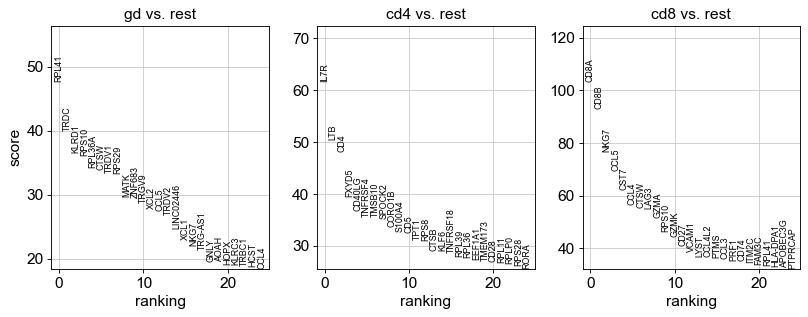

In [14]:
sc.tl.rank_genes_groups(adata, 'batch', method='wilcoxon', n_genes=300)
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

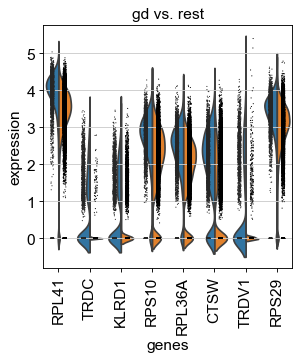

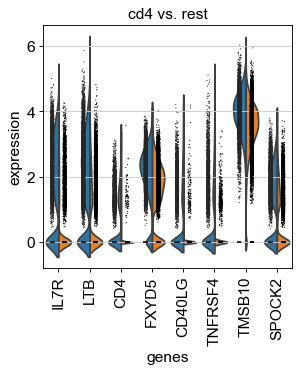

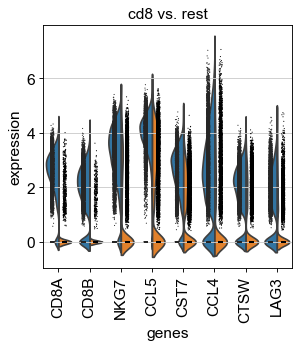

In [15]:
sc.pl.rank_genes_groups_violin(adata, groups=None, n_genes=8)

In [16]:
result = adata.uns['rank_genes_groups']
groups = result['names'].dtype.names
df = pd.DataFrame(
    {group + '_' + key[:4]: result[key][group]
    for group in groups for key in ['names', 'pvals_adj', 'logfoldchanges']})
df.to_csv('outputs/gd_v_all.csv', index=False)
df.head()

,gd_name,gd_pval,gd_logf,cd4_name,cd4_pval,cd4_logf,cd8_name,cd8_pval,cd8_logf
0,RPL41,0.000000e+00,0.716211,IL7R,0.000000e+00,3.243943,CD8A,0.0,6.526740
1,TRDC,0.000000e+00,7.538453,LTB,0.000000e+00,2.135409,CD8B,0.0,6.413932
2,KLRD1,1.429123e-287,3.034026,CD4,0.000000e+00,6.321688,NKG7,0.0,3.539850
3,RPS10,4.959036e-281,0.925578,FXYD5,0.000000e+00,0.842968,CCL5,0.0,2.697091
4,RPL36A,1.188436e-251,0.876708,CD40LG,9.901597e-293,5.181063,CST7,0.0,2.049457


In [17]:
adata.write(results_file)
adata

AnnData object with n_obs × n_vars = 17537 × 1916
    obs: 'barcode', 'doublet', 'sample_id', 'batch_name', 'cell.barcode', 'tcr_expansion', 'trdv', 'batch', 'n_genes', 'percent_mito', 'n_counts', 'leiden', 'umap_density_batch', 'umap_density_sample_id'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'batch_colors', 'hvg', 'neighbors', 'pca', 'sample_id_colors', 'umap', 'leiden', 'tcr_expansion_colors', 'leiden_colors', 'umap_density_batch_params', 'umap_density_sample_id_params', 'rank_genes_groups'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

### GD_VD2- vs all

#### Create 'max_trdv' annotation

In [18]:
trdv_genes = ['TRDV1', 'TRDV2', 'TRDV3', 'TRAV14DV4', 'TRAV29DV5', 'TRAV23DV6', 'TRAV36DV7', 'TRAV38-2DV8']
df = pd.DataFrame(adata[:, trdv_genes].X, columns = trdv_genes)
df

,TRDV1,TRDV2,TRDV3,TRAV14DV4,TRAV29DV5,TRAV23DV6,TRAV36DV7,TRAV38-2DV8
0,4.478809,-0.247702,-0.151496,-0.165102,-0.209893,-0.196821,-0.118102,-0.147939
1,1.847444,-0.253546,-0.162650,-0.106438,-0.187417,-0.180657,-0.159240,-0.114622
2,-0.247956,8.397062,-0.080222,-0.201805,-0.344089,-0.152745,-0.034712,-0.186848
3,-0.330606,-0.239372,-0.156976,-0.118947,-0.185642,-0.183110,-0.144506,-0.123129
4,-0.259654,-0.174014,-0.103763,-0.065607,3.162023,-0.079054,-0.149263,-0.114174
...,...,...,...,...,...,...,...,...
17532,-0.255911,-0.359258,-0.089077,-0.199324,-0.175731,-0.151348,-0.061973,-0.179353
17533,-0.318710,-0.277924,-0.108861,3.986119,-0.255407,-0.212405,-0.103860,-0.200387
17534,-0.187510,-0.124867,-0.073568,-0.141983,3.254171,-0.113242,-0.052096,-0.160307
17535,-0.402812,-0.282662,-0.130741,-0.222380,-0.268674,4.674474,-0.122389,-0.169051


array([[<AxesSubplot:title={'center':'TRDV1'}>,
        <AxesSubplot:title={'center':'TRDV2'}>,
        <AxesSubplot:title={'center':'TRDV3'}>],
       [<AxesSubplot:title={'center':'TRAV14DV4'}>,
        <AxesSubplot:title={'center':'TRAV29DV5'}>,
        <AxesSubplot:title={'center':'TRAV23DV6'}>],
       [<AxesSubplot:title={'center':'TRAV36DV7'}>,
        <AxesSubplot:title={'center':'TRAV38-2DV8'}>, <AxesSubplot:>]],
      dtype=object)

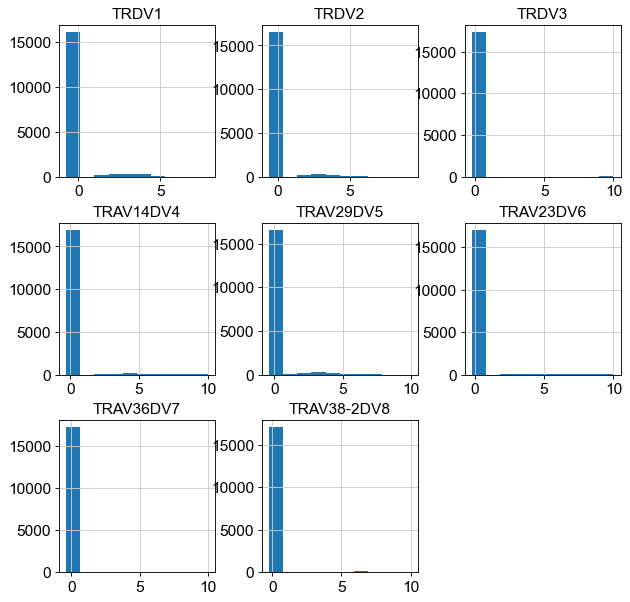

In [19]:
df.hist(figsize = (9, 9))

In [20]:
max_trdv = df.idxmax(axis = 1)
max_trdv

0            TRDV1
1            TRDV1
2            TRDV2
3        TRAV14DV4
4        TRAV29DV5
           ...    
17532    TRAV36DV7
17533    TRAV14DV4
17534    TRAV29DV5
17535    TRAV23DV6
17536    TRAV36DV7
Length: 17537, dtype: object

In [21]:
adata.obs['max_trdv'] = pd.Categorical(np.array(max_trdv), categories = trdv_genes+['nan'])
adata.obs['max_trdv'].value_counts()

TRAV36DV7      6302
TRDV3          4552
TRAV14DV4      1606
TRDV2          1346
TRDV1          1303
TRAV29DV5      1090
TRAV38-2DV8     771
TRAV23DV6       567
nan               0
Name: max_trdv, dtype: int64

In [22]:
# change values for cells from cd4 and cd8 batches to 'nan'
adata.obs.loc[adata.obs['batch'] == 'cd4', 'max_trdv'] = 'nan'
adata.obs.loc[adata.obs['batch'] == 'cd8', 'max_trdv'] = 'nan'

In [23]:
adata.obs['max_trdv'].sample(10)

TAGTTGGGTTCACCTC-1-cd8      nan
CCTTCCCCACCAGGTC-1-cd8      nan
ATTGGACTCTTTCCTC-1-cd8      nan
CAGCATACAATAAGCA-1-gd     TRDV3
CACCACTTCCTTGCCA-1-cd4      nan
CATTATCAGTGTTTGC-1-cd4      nan
CGAGCACCACACGCTG-1-gd     TRDV1
GCAGCCAAGAAGCCCA-1-cd8      nan
GATGAAACACGGTGTC-1-cd4      nan
ATAACGCGTCCTCCAT-1-cd4      nan
Name: max_trdv, dtype: category
Categories (9, object): ['TRDV1', 'TRDV2', 'TRDV3', 'TRAV14DV4', ..., 'TRAV23DV6', 'TRAV36DV7', 'TRAV38-2DV8', 'nan']

In [24]:
adata.obs['max_trdv'].value_counts()

nan            14519
TRDV1           1102
TRDV2            901
TRDV3            286
TRAV36DV7        275
TRAV29DV5        179
TRAV14DV4        174
TRAV38-2DV8       88
TRAV23DV6         13
Name: max_trdv, dtype: int64

#### Create 'max_vd2' annotation

In [25]:
adata.obs['max_vd2'] = pd.Categorical(['nan']*adata.shape[0], categories = ['Vd2+', 'Vd2-', 'nan'])
adata.obs['max_vd2']

AAACCTGCACAGCCCA-1-gd     nan
AAACCTGCAGGACCCT-1-gd     nan
AAACCTGCATTCACTT-1-gd     nan
AAACGGGAGCTAGTTC-1-gd     nan
AAACGGGCAATACGCT-1-gd     nan
                         ... 
TTTGTCACAGGTCTCG-1-cd8    nan
TTTGTCACATACAGCT-1-cd8    nan
TTTGTCAGTCTAGTCA-1-cd8    nan
TTTGTCATCCAAATGC-1-cd8    nan
TTTGTCATCTATCGCC-1-cd8    nan
Name: max_vd2, Length: 17537, dtype: category
Categories (3, object): ['Vd2+', 'Vd2-', 'nan']

In [26]:
#trdv_genes = ['TRDV1', 'TRDV2', 'TRDV3', 'TRAV14DV4', 'TRAV29DV5', 'TRAV23DV6', 'TRAV36DV7', 'TRAV38-2DV8']

adata.obs.loc[adata.obs['max_trdv'] == 'TRDV2', 'max_vd2'] = 'Vd2+'

adata.obs.loc[adata.obs['max_trdv'] == 'TRDV1', 'max_vd2'] = 'Vd2-'
adata.obs.loc[adata.obs['max_trdv'] == 'TRDV3', 'max_vd2'] = 'Vd2-'
adata.obs.loc[adata.obs['max_trdv'] == 'TRAV14DV4', 'max_vd2'] = 'Vd2-'
adata.obs.loc[adata.obs['max_trdv'] == 'TRAV29DV5', 'max_vd2'] = 'Vd2-'
adata.obs.loc[adata.obs['max_trdv'] == 'TRAV23DV6', 'max_vd2'] = 'Vd2-'
adata.obs.loc[adata.obs['max_trdv'] == 'TRAV36DV7', 'max_vd2'] = 'Vd2-'
adata.obs.loc[adata.obs['max_trdv'] == 'TRAV38-2DV8', 'max_vd2'] = 'Vd2-'

In [27]:
adata.obs[['max_trdv', 'max_vd2']]

,max_trdv,max_vd2
AAACCTGCACAGCCCA-1-gd,TRDV1,Vd2-
AAACCTGCAGGACCCT-1-gd,TRDV1,Vd2-
AAACCTGCATTCACTT-1-gd,TRDV2,Vd2+
AAACGGGAGCTAGTTC-1-gd,TRAV14DV4,Vd2-
AAACGGGCAATACGCT-1-gd,TRAV29DV5,Vd2-
...,...,...
TTTGTCACAGGTCTCG-1-cd8,nan,nan
TTTGTCACATACAGCT-1-cd8,nan,nan
TTTGTCAGTCTAGTCA-1-cd8,nan,nan
TTTGTCATCCAAATGC-1-cd8,nan,nan


In [28]:
adata.obs['max_vd2'].value_counts()

nan     14519
Vd2-     2117
Vd2+      901
Name: max_vd2, dtype: int64

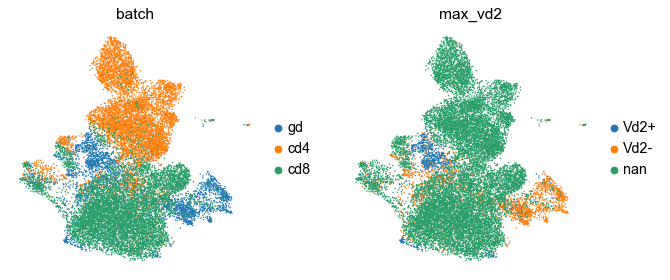

In [33]:
sc.pl.umap(adata, color=['batch', 'max_vd2'])

#### Generate 'max_vd2' gene signature

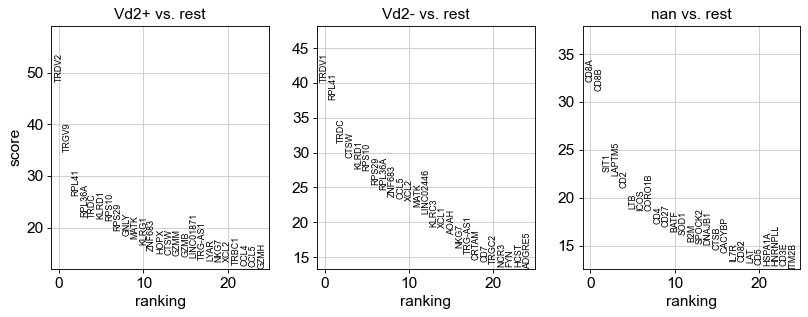

In [30]:
sc.tl.rank_genes_groups(adata, 'max_vd2', method='wilcoxon', n_genes=300)
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

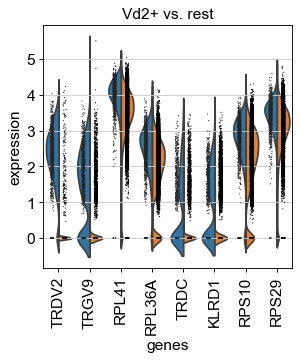

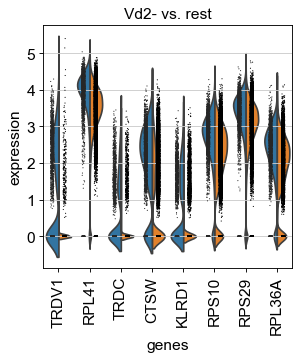

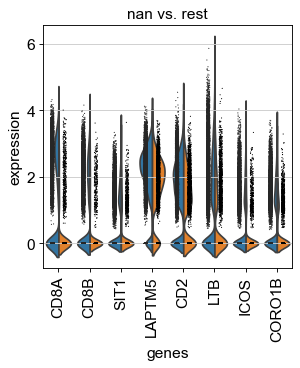

In [31]:
sc.pl.rank_genes_groups_violin(adata, groups=None, n_genes=8)

In [32]:
result = adata.uns['rank_genes_groups']
groups = result['names'].dtype.names
df = pd.DataFrame(
    {group + '_' + key[:4]: result[key][group]
    for group in groups for key in ['names', 'pvals_adj', 'logfoldchanges']})
df.to_csv('outputs/gd_vd2neg_v_all.csv', index=False)
df.head()

,Vd2+_name,Vd2+_pval,Vd2+_logf,Vd2-_name,Vd2-_pval,Vd2-_logf,nan_name,nan_pval,nan_logf
0,TRDV2,0.000000e+00,8.874660,TRDV1,0.000000e+00,6.431989,CD8A,8.849940e-223,2.725935
1,TRGV9,1.321136e-259,4.724355,RPL41,1.294387e-303,0.626936,CD8B,1.438859e-209,2.986982
2,RPL41,4.354518e-147,0.727017,TRDC,5.240443e-213,4.312954,SIT1,1.382406e-110,1.703556
3,RPL36A,3.833485e-104,0.984643,CTSW,4.500338e-185,1.508273,LAPTM5,6.375280e-107,0.584622
4,TRDC,3.552430e-103,3.652212,KLRD1,1.665884e-164,2.516608,CD2,4.018671e-95,0.738666


In [34]:
adata.write(results_file)
adata

AnnData object with n_obs × n_vars = 17537 × 1916
    obs: 'barcode', 'doublet', 'sample_id', 'batch_name', 'cell.barcode', 'tcr_expansion', 'trdv', 'batch', 'n_genes', 'percent_mito', 'n_counts', 'leiden', 'umap_density_batch', 'umap_density_sample_id', 'max_trdv', 'max_vd2'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'batch_colors', 'hvg', 'neighbors', 'pca', 'sample_id_colors', 'umap', 'leiden', 'tcr_expansion_colors', 'leiden_colors', 'umap_density_batch_params', 'umap_density_sample_id_params', 'rank_genes_groups', 'max_vd2_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [ ]:
# 3. create 'gd_vd2neg' label
#adata.obs['gd_vd2neg'] = np.array(adata.obs['batch'] == 'gd') & \
#                       np.array(adata.obs['max_vd2'] == 'Vd2-')
#adata.obs['gd_vd2neg'] = adata.obs['gd_vd2neg'].astype('string')
#adata.obs[['batch', 'max_vd2', 'gd_vd2neg']]

Wed May 19

### GD TP vs all

In [55]:
adata = sc.read(results_file)
adata.obs

,barcode,doublet,sample_id,batch_name,cell.barcode,tcr_expansion,trdv,batch,n_genes,percent_mito,n_counts,leiden,umap_density_batch,umap_density_sample_id,max_trdv,max_vd2
AAACCTGCACAGCCCA-1-gd,AAACCTGCACAGCCCA-1,SNG,KID21,Chiara_Kidney_Pooled_gdTCR,AAACCTGCACAGCCCA-1,NaN,NaN,gd,1852,0.027114,5274.0,7,0.128245,0.855876,TRDV1,Vd2-
AAACCTGCAGGACCCT-1-gd,AAACCTGCAGGACCCT-1,SNG,KID21,Chiara_Kidney_Pooled_gdTCR,AAACCTGCAGGACCCT-1,high,TRDV1,gd,1761,0.041157,6463.0,6,0.788255,0.525416,TRDV1,Vd2-
AAACCTGCATTCACTT-1-gd,AAACCTGCATTCACTT-1,SNG,KID19,Chiara_Kidney_Pooled_gdTCR,AAACCTGCATTCACTT-1,NaN,NaN,gd,1195,0.003378,2664.0,13,0.818915,0.284222,TRDV2,Vd2+
AAACGGGAGCTAGTTC-1-gd,AAACGGGAGCTAGTTC-1,SNG,KID21,Chiara_Kidney_Pooled_gdTCR,AAACGGGAGCTAGTTC-1,NaN,NaN,gd,1652,0.038266,5697.0,6,0.501369,0.571459,TRAV14DV4,Vd2-
AAACGGGCAATACGCT-1-gd,AAACGGGCAATACGCT-1,SNG,KID19,Chiara_Kidney_Pooled_gdTCR,AAACGGGCAATACGCT-1,NaN,NaN,gd,2057,0.037108,4204.0,11,0.060915,0.034520,TRAV29DV5,Vd2-
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCACAGGTCTCG-1-cd8,TTTGTCACAGGTCTCG-1,SNG,KID18,Chiara_Kidney_Pooled_CD8pos,TTTGTCACAGGTCTCG-1,NaN,NaN,cd8,1263,0.013266,2563.0,4,0.804523,0.583318,nan,nan
TTTGTCACATACAGCT-1-cd8,TTTGTCACATACAGCT-1,SNG,KID90,Chiara_Kidney_Pooled_CD8pos,TTTGTCACATACAGCT-1,high,TRBV27,cd8,1588,0.003661,4643.0,5,0.449411,0.235553,nan,nan
TTTGTCAGTCTAGTCA-1-cd8,TTTGTCAGTCTAGTCA-1,SNG,KID19,Chiara_Kidney_Pooled_CD8pos,TTTGTCAGTCTAGTCA-1,high,TRBV4-1,cd8,705,0.018605,1290.0,5,0.393408,0.541569,nan,nan
TTTGTCATCCAAATGC-1-cd8,TTTGTCATCCAAATGC-1,SNG,KID06,Chiara_Kidney_Pooled_CD8pos,TTTGTCATCCAAATGC-1,high,TRBV5-8,cd8,2399,0.014153,6571.0,5,0.579264,0.885244,nan,nan


#### Examine 'tp' markers

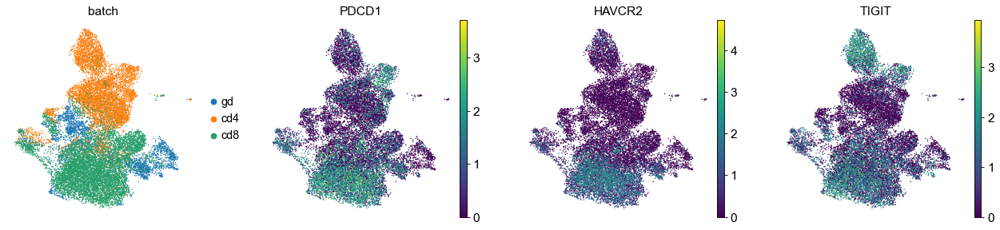

In [56]:
sc.pl.umap(adata, color=['batch', 'PDCD1', 'HAVCR2', 'TIGIT'], save='_markers_tp')

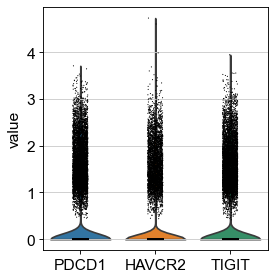

In [57]:
sc.pl.violin(adata, ['PDCD1', 'HAVCR2', 'TIGIT'], save='_tp_before')

#### Create 'tp' annotation

In [59]:
# define 'triple positive' (TP) cells as cells with PDCD1, HAVCR2, and TIGIT values > 0.5
cutoff = 0.5
adata.obs['tp'] = \
np.array(adata[:, 'PDCD1'].X > cutoff) & \
np.array(adata[:, 'HAVCR2'].X > cutoff) & \
np.array(adata[:, 'TIGIT'].X > cutoff)

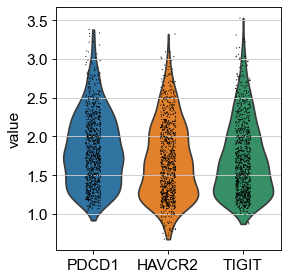

In [64]:
sc.pl.violin(adata[adata.obs['tp'] == True], ['PDCD1', 'HAVCR2', 'TIGIT'], save='_tp_after_gt0.5')

In [65]:
adata.obs['tp'] = adata.obs['tp'].astype('string')

... storing 'tp' as categorical


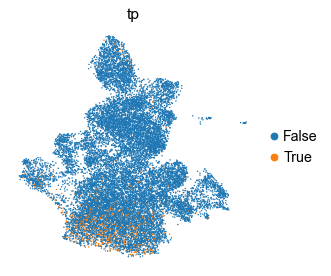

In [66]:
sc.pl.umap(adata, color='tp')

In [68]:
# number and percent TP
print(adata[adata.obs['tp'] == 'True'].n_obs)
print(adata[adata.obs['tp'] == 'True'].n_obs / adata.n_obs * 100)

932
5.314477960882705


In [69]:
# Number 'single' positive
print(np.unique(np.array(adata[:, 'PDCD1'].X > cutoff), return_counts = 'True'))
print(np.unique(np.array(adata[:, 'HAVCR2'].X > cutoff), return_counts = 'True'))
print(np.unique(np.array(adata[:, 'TIGIT'].X > cutoff), return_counts = 'True'))

(array([False,  True]), array([12422,  5115]))
(array([False,  True]), array([13767,  3770]))
(array([False,  True]), array([12325,  5212]))


In [70]:
# percent 'single' positive
print(763/3024 * 100)
print(605/3024 * 100)
print(878/3024 * 100)

25.23148148148148
20.006613756613756
29.034391534391535


#### Generate 'tp' gene signature

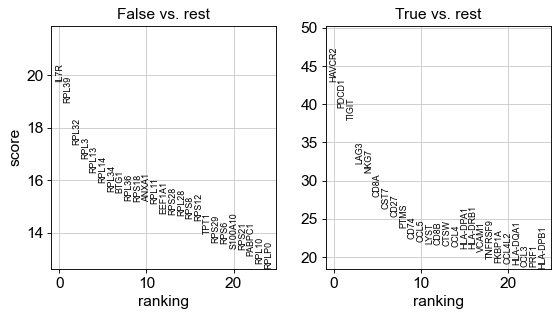

In [25]:
#sc.tl.rank_genes_groups(adata, 'tp', method='wilcoxon', n_genes=300)
#sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

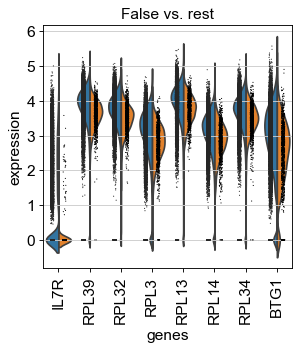

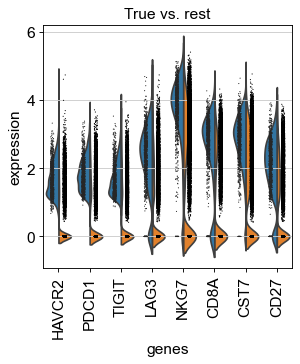

In [26]:
#sc.pl.rank_genes_groups_violin(adata, groups=None, n_genes=8)

In [27]:
#result = adata.uns['rank_genes_groups']
#groups = result['names'].dtype.names
#df = pd.DataFrame(
#    {group + '_' + key[:4]: result[key][group]
#    for group in groups for key in ['names', 'pvals_adj', 'logfoldchanges']})
#df.to_csv('outputs/tp.csv', index=False)
#df.head()

,False_name,False_pval,False_logf,True_name,True_pval,True_logf
0,IL7R,7.546424e-84,4.386042,HAVCR2,0.000000e+00,3.667491
1,RPL39,2.911829e-77,0.308519,PDCD1,0.000000e+00,2.993574
2,RPL32,1.171846e-64,0.311829,TIGIT,0.000000e+00,2.895970
3,RPL3,1.139747e-60,0.391001,LAG3,9.849549e-224,2.641054
4,RPL13,7.238537e-57,0.293796,NKG7,6.169683e-207,2.646586


In [30]:
# writing errors if annotation is created using .astype('categorical')
#adata.obs['tp'] = adata.obs['tp'].astype('string')

#test_file = 'write/test_save.h5ad'
#adata.write(test_file)

... storing 'tp' as categorical


In [32]:
#adata = sc.read(test_file)
#adata

AnnData object with n_obs × n_vars = 17537 × 1916
    obs: 'barcode', 'doublet', 'sample_id', 'batch_name', 'cell.barcode', 'tcr_expansion', 'trdv', 'batch', 'n_genes', 'percent_mito', 'n_counts', 'leiden', 'umap_density_batch', 'umap_density_sample_id', 'max_trdv', 'max_vd2', 'gd_vd2neg', 'tp'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'batch_colors', 'gd_vd2neg_colors', 'hvg', 'leiden', 'leiden_colors', 'max_trdv_colors', 'max_vd2_colors', 'neighbors', 'pca', 'rank_genes_groups', 'sample_id_colors', 'tcr_expansion_colors', 'umap', 'umap_density_batch_params', 'umap_density_sample_id_params'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [33]:
#adata.write(results_file)

#### Create 'gd_tp' annotation

In [71]:
adata.obs[['batch', 'tp']]

,batch,tp
AAACCTGCACAGCCCA-1-gd,gd,False
AAACCTGCAGGACCCT-1-gd,gd,False
AAACCTGCATTCACTT-1-gd,gd,False
AAACGGGAGCTAGTTC-1-gd,gd,False
AAACGGGCAATACGCT-1-gd,gd,True
...,...,...
TTTGTCACAGGTCTCG-1-cd8,cd8,False
TTTGTCACATACAGCT-1-cd8,cd8,False
TTTGTCAGTCTAGTCA-1-cd8,cd8,False
TTTGTCATCCAAATGC-1-cd8,cd8,False


In [72]:
adata.obs['gd_tp'] = np.array(adata.obs['batch'] == 'gd') & np.array(adata.obs['tp'] == 'True')
adata.obs['gd_tp'] = adata.obs['gd_tp'].astype('string')
adata.obs[['batch', 'tp', 'gd_tp']]

,batch,tp,gd_tp
AAACCTGCACAGCCCA-1-gd,gd,False,False
AAACCTGCAGGACCCT-1-gd,gd,False,False
AAACCTGCATTCACTT-1-gd,gd,False,False
AAACGGGAGCTAGTTC-1-gd,gd,False,False
AAACGGGCAATACGCT-1-gd,gd,True,True
...,...,...,...
TTTGTCACAGGTCTCG-1-cd8,cd8,False,False
TTTGTCACATACAGCT-1-cd8,cd8,False,False
TTTGTCAGTCTAGTCA-1-cd8,cd8,False,False
TTTGTCATCCAAATGC-1-cd8,cd8,False,False


In [77]:
adata.obs['gd_tp'].value_counts()

False    17441
True        96
Name: gd_tp, dtype: Int64

... storing 'gd_tp' as categorical


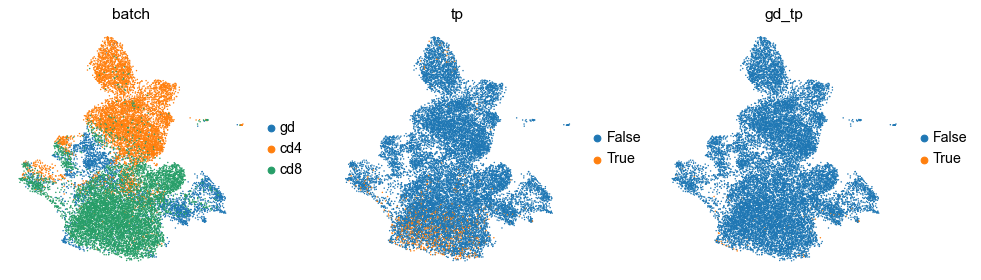

In [78]:
sc.pl.umap(adata, color=['batch', 'tp', 'gd_tp'], save='_gd_tp')

#### Generate 'gd_tp' gene signature

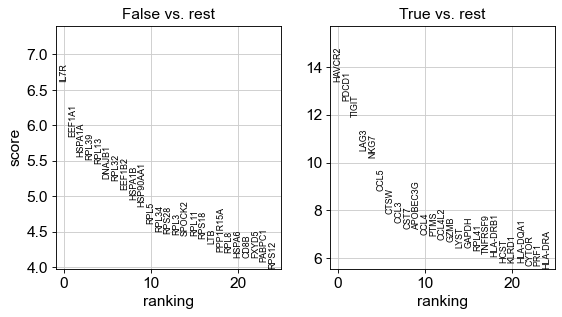

In [79]:
sc.tl.rank_genes_groups(adata, 'gd_tp', method='wilcoxon', n_genes=300)
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

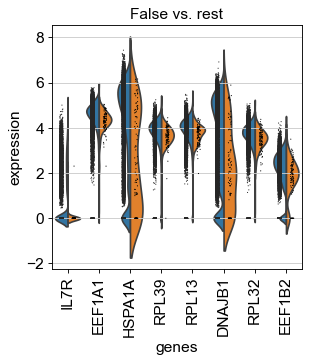

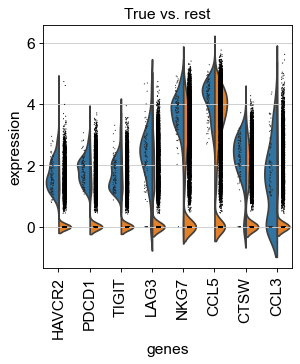

In [80]:
sc.pl.rank_genes_groups_violin(adata, groups=None, n_genes=8)

In [81]:
result = adata.uns['rank_genes_groups']
groups = result['names'].dtype.names
df = pd.DataFrame(
    {group + '_' + key[:4]: result[key][group]
    for group in groups for key in ['names', 'pvals_adj', 'logfoldchanges']})
df.to_csv('outputs/gd_tp_v_all.csv', index=False)
df.head()

,False_name,False_pval,False_logf,True_name,True_pval,True_logf
0,IL7R,4.611711e-08,6.004496,HAVCR2,1.293828e-36,3.295781
1,EEF1A1,4.705522e-06,0.287053,PDCD1,2.636918e-32,2.802066
2,HSPA1A,1.881730e-05,1.890876,TIGIT,7.526453e-29,2.691007
3,RPL39,2.186187e-05,0.300970,LAG3,4.141702e-22,2.583499
4,RPL13,2.982245e-05,0.301481,NKG7,8.063662e-21,2.675653


In [83]:
adata.write(results_file)
adata

AnnData object with n_obs × n_vars = 17537 × 1916
    obs: 'barcode', 'doublet', 'sample_id', 'batch_name', 'cell.barcode', 'tcr_expansion', 'trdv', 'batch', 'n_genes', 'percent_mito', 'n_counts', 'leiden', 'umap_density_batch', 'umap_density_sample_id', 'max_trdv', 'max_vd2', 'tp', 'gd_tp'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'batch_colors', 'hvg', 'leiden', 'leiden_colors', 'max_vd2_colors', 'neighbors', 'pca', 'rank_genes_groups', 'sample_id_colors', 'tcr_expansion_colors', 'umap', 'umap_density_batch_params', 'umap_density_sample_id_params', 'tp_colors', 'gd_tp_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

### GD VD2- TP vs all

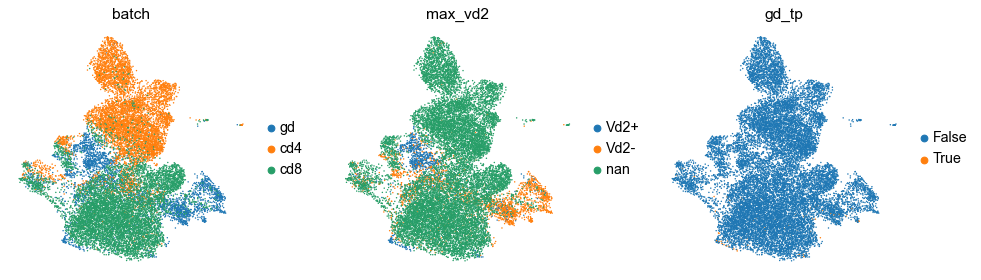

In [84]:
sc.pl.umap(adata, color=['batch', 'max_vd2', 'gd_tp'])

#### Create 'gd_vd2neg_tp' annotation

In [88]:
adata.obs['gd_vd2neg_tp'] = np.array(adata.obs['max_vd2'] == 'Vd2-') & np.array(adata.obs['gd_tp'] == 'True')
adata.obs['gd_vd2neg_tp'] = adata.obs['gd_vd2neg_tp'].astype('string')
adata.obs[['batch', 'max_vd2', 'gd_tp', 'gd_vd2neg_tp']]

,batch,max_vd2,gd_tp,gd_vd2neg_tp
AAACCTGCACAGCCCA-1-gd,gd,Vd2-,False,False
AAACCTGCAGGACCCT-1-gd,gd,Vd2-,False,False
AAACCTGCATTCACTT-1-gd,gd,Vd2+,False,False
AAACGGGAGCTAGTTC-1-gd,gd,Vd2-,False,False
AAACGGGCAATACGCT-1-gd,gd,Vd2-,True,True
...,...,...,...,...
TTTGTCACAGGTCTCG-1-cd8,cd8,nan,False,False
TTTGTCACATACAGCT-1-cd8,cd8,nan,False,False
TTTGTCAGTCTAGTCA-1-cd8,cd8,nan,False,False
TTTGTCATCCAAATGC-1-cd8,cd8,nan,False,False


In [89]:
adata.obs['gd_vd2neg_tp'].value_counts()

False    17469
True        68
Name: gd_vd2neg_tp, dtype: Int64

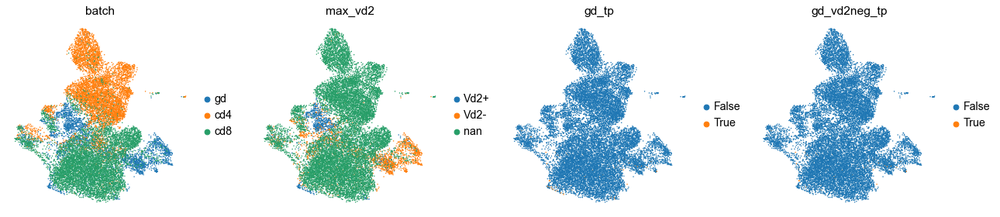

In [91]:
sc.pl.umap(adata, color=['batch', 'max_vd2', 'gd_tp', 'gd_vd2neg_tp'], save='_gene_sig')

#### Generate 'gd_vd2neg_tp' gene signature

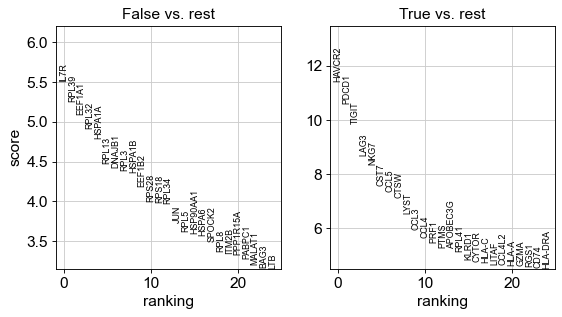

In [92]:
sc.tl.rank_genes_groups(adata, 'gd_vd2neg_tp', method='wilcoxon', n_genes=300)
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

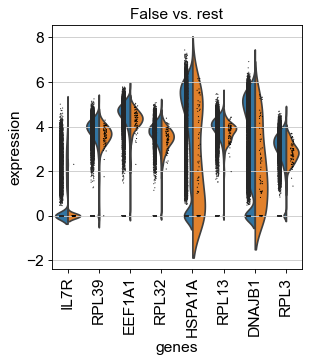

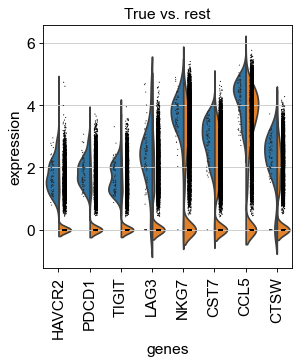

In [93]:
sc.pl.rank_genes_groups_violin(adata, groups=None, n_genes=8)

In [94]:
result = adata.uns['rank_genes_groups']
groups = result['names'].dtype.names
df = pd.DataFrame(
    {group + '_' + key[:4]: result[key][group]
    for group in groups for key in ['names', 'pvals_adj', 'logfoldchanges']})
df.to_csv('outputs/gd_vd2neg_tp_v_all.csv', index=False)
df.head()

,False_name,False_pval,False_logf,True_name,True_pval,True_logf
0,IL7R,0.000058,5.496255,HAVCR2,6.745770e-26,3.365270
1,RPL39,0.000184,0.381913,PDCD1,2.488811e-22,2.812617
2,EEF1A1,0.000387,0.310437,TIGIT,3.989087e-19,2.620009
3,RPL32,0.000918,0.377330,LAG3,1.966373e-14,2.564876
4,HSPA1A,0.001550,1.980161,NKG7,2.617538e-13,2.605479


In [95]:
adata.write(results_file)

In [96]:
adata

AnnData object with n_obs × n_vars = 17537 × 1916
    obs: 'barcode', 'doublet', 'sample_id', 'batch_name', 'cell.barcode', 'tcr_expansion', 'trdv', 'batch', 'n_genes', 'percent_mito', 'n_counts', 'leiden', 'umap_density_batch', 'umap_density_sample_id', 'max_trdv', 'max_vd2', 'tp', 'gd_tp', 'gd_vd2neg_tp'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'batch_colors', 'hvg', 'leiden', 'leiden_colors', 'max_vd2_colors', 'neighbors', 'pca', 'rank_genes_groups', 'sample_id_colors', 'tcr_expansion_colors', 'umap', 'umap_density_batch_params', 'umap_density_sample_id_params', 'tp_colors', 'gd_tp_colors', 'gd_vd2neg_tp_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

## 14. Make volcano plot - PTT <a name="14"></a>
[Return to top](#0)

In [5]:
adata = sc.read(results_file)
adata

AnnData object with n_obs × n_vars = 17537 × 1916
    obs: 'barcode', 'doublet', 'sample_id', 'batch_name', 'cell.barcode', 'tcr_expansion', 'trdv', 'batch', 'n_genes', 'percent_mito', 'n_counts', 'leiden', 'umap_density_batch', 'umap_density_sample_id', 'max_trdv', 'max_vd2', 'tp', 'gd_tp', 'gd_vd2neg_tp'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'batch_colors', 'gd_tp_colors', 'gd_vd2neg_tp_colors', 'hvg', 'leiden', 'leiden_colors', 'max_vd2_colors', 'neighbors', 'pca', 'rank_genes_groups', 'sample_id_colors', 'tcr_expansion_colors', 'tp_colors', 'umap', 'umap_density_batch_params', 'umap_density_sample_id_params'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [6]:
# check that top20 gene list matches the one we gave Dvir
result = adata.uns['rank_genes_groups']
groups = result['names'].dtype.names
df = pd.DataFrame(
    {group + '_' + key[:4]: result[key][group]
    for group in groups for key in ['names', 'pvals_adj', 'logfoldchanges']})
#df.to_csv('outputs/gd_vd2neg_tp_v_all.csv', index=False)
df.head(20)

,False_name,False_pval,False_logf,True_name,True_pval,True_logf
0,IL7R,0.000058,5.496255,HAVCR2,6.745770e-26,3.365270
1,RPL39,0.000184,0.381913,PDCD1,2.488811e-22,2.812617
2,EEF1A1,0.000387,0.310437,TIGIT,3.989087e-19,2.620009
3,RPL32,0.000918,0.377330,LAG3,1.966373e-14,2.564876
4,HSPA1A,0.001550,1.980161,NKG7,2.617538e-13,2.605479
5,RPL13,0.004511,0.298906,CST7,1.356635e-10,1.759728
6,DNAJB1,0.005149,1.575525,CCL5,5.615515e-10,1.922033
7,RPL3,0.005689,0.288453,CTSW,2.439731e-09,1.807410
8,HSPA1B,0.006333,1.688099,LYST,1.343047e-07,1.768132
9,EEF1B2,0.011038,0.494602,CCL3,4.872996e-06,2.130461


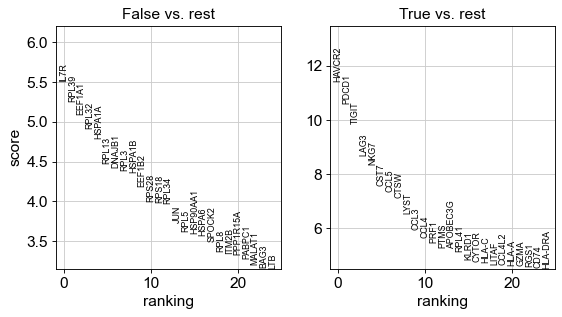

In [7]:
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

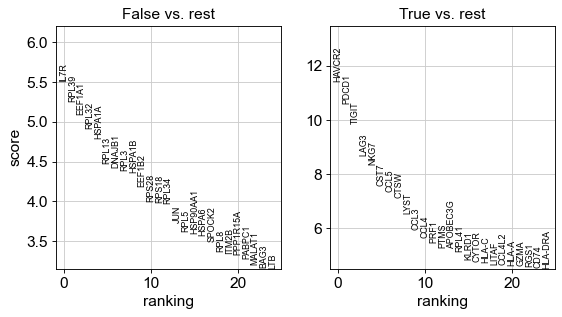

In [8]:
# re-calculate DE with all genes; confirm top20 unchanged
sc.tl.rank_genes_groups(adata, 'gd_vd2neg_tp', method='wilcoxon', n_genes=None)
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

In [11]:
# save update result as CSV
result = adata.uns['rank_genes_groups']
groups = result['names'].dtype.names
df = pd.DataFrame(
    {group + '_' + key[:4]: result[key][group]
    for group in groups for key in ['names', 'pvals_adj', 'logfoldchanges']})
df.to_csv('outputs/gd_vd2neg_tp_v_all_volcano_genes.csv', index=False)
df.head(20)

,False_name,False_pval,False_logf,True_name,True_pval,True_logf
0,IL7R,0.000058,5.496255,HAVCR2,6.745770e-26,3.365270
1,RPL39,0.000184,0.381913,PDCD1,2.488811e-22,2.812617
2,EEF1A1,0.000387,0.310437,TIGIT,3.989087e-19,2.620009
3,RPL32,0.000918,0.377330,LAG3,1.966373e-14,2.564876
4,HSPA1A,0.001550,1.980161,NKG7,2.617538e-13,2.605479
5,RPL13,0.004511,0.298906,CST7,1.356635e-10,1.759728
6,DNAJB1,0.005149,1.575525,CCL5,5.615515e-10,1.922033
7,RPL3,0.005689,0.288453,CTSW,2.439731e-09,1.807410
8,HSPA1B,0.006333,1.688099,LYST,1.343047e-07,1.768132
9,EEF1B2,0.011038,0.494602,CCL3,4.872996e-06,2.130461


In [38]:
# prep final volcano plot dataframe
df2 = df[['True_name', 'True_pval', 'True_logf']]
df2.columns = ['genes', 'p_adj', 'lfc']
df2

,genes,p_adj,lfc
0,HAVCR2,6.745770e-26,3.365270
1,PDCD1,2.488811e-22,2.812617
2,TIGIT,3.989087e-19,2.620009
3,LAG3,1.966373e-14,2.564876
4,NKG7,2.617538e-13,2.605479
...,...,...,...
18761,HSPA1A,1.549963e-03,-1.980161
18762,RPL32,9.179379e-04,-0.377330
18763,EEF1A1,3.865348e-04,-0.310437
18764,RPL39,1.839385e-04,-0.381913


<AxesSubplot:xlabel='lfc', ylabel='p_adj'>

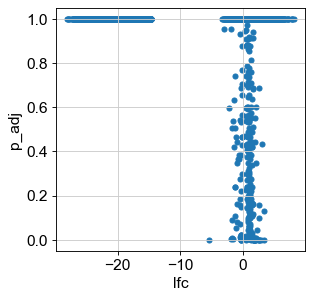

In [23]:
# plot scatter
df2.plot.scatter('lfc', 'p_adj')

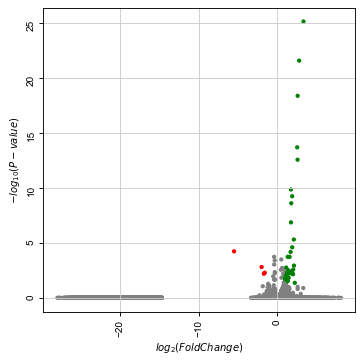

In [24]:
# plot volcano
from bioinfokit import analys, visuz

visuz.gene_exp.volcano(df=df2, lfc='lfc', pv='p_adj', show=True,
                       lfc_thr=(1,1), pv_thr=(0.05, 0.05))

In [41]:
df3 = df2
df3['lfc'] = df3['lfc'].clip(lower=-6, upper=6)
print(df3['lfc'].min(), df3['lfc'].min())

-6.0 -6.0


<ipython-input-41-5945799b1617>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df3['lfc'] = df3['lfc'].clip(lower=-6, upper=6)


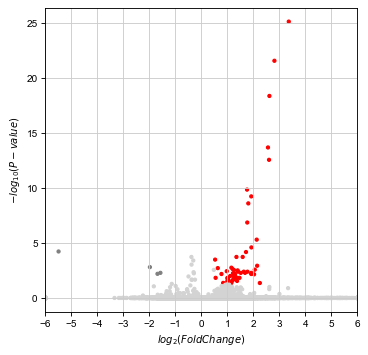

In [64]:
# plot volcano - clipped
visuz.gene_exp.volcano(df=df3, lfc='lfc', pv='p_adj', show=True,
                       lfc_thr=(0.5,0.5), pv_thr=(0.05, 0.05), color=['red', 'lightgrey', 'grey'],
                       xlm=(-6,6.01,1), ar=0)

In [65]:
# save volcano - clipped
visuz.gene_exp.volcano(df=df3, lfc='lfc', pv='p_adj', #show=True,
                       figtype='pdf', figname='figures_volcano/ptt_unlabeled',
                       lfc_thr=(0.5,0.5), pv_thr=(0.05, 0.05), color=['red', 'lightgrey', 'grey'],
                       xlm=(-6,6.01,1), ar=0)

In [54]:
# select gene labels
top_20_genes = tuple(df3['genes'][0:20])
top_20_genes

('HAVCR2',
 'PDCD1',
 'TIGIT',
 'LAG3',
 'NKG7',
 'CST7',
 'CCL5',
 'CTSW',
 'LYST',
 'CCL3',
 'CCL4',
 'PRF1',
 'PTMS',
 'APOBEC3G',
 'RPL41',
 'KLRD1',
 'CYTOR',
 'HLA-C',
 'LITAF',
 'CCL4L2')

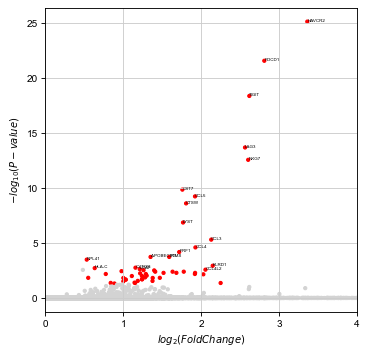

In [62]:
# plot volcano - clipped, labeled
visuz.gene_exp.volcano(df=df3, lfc='lfc', pv='p_adj', show=True,
                       #figtype='pdf', figname='figures_volcano/ptt_labeled_zoomed',
                       lfc_thr=(0.5,0.5), pv_thr=(0.05, 0.05), color=['red', 'lightgrey', 'grey'],
                       xlm=(0,4.01,1), ar=0,
                       geneid="genes", genenames=top_20_genes, gfont=4, gstyle=1)

In [63]:
# save volcano - clipped, labeled
visuz.gene_exp.volcano(df=df3, lfc='lfc', pv='p_adj', #show=True,
                       figtype='pdf', figname='figures_volcano/ptt_labeled_zoomed',
                       lfc_thr=(0.5,0.5), pv_thr=(0.05, 0.05), color=['red', 'lightgrey', 'grey'],
                       xlm=(0,4.01,1), ar=0,
                       geneid="genes", genenames=top_20_genes, gfont=4, gstyle=1)

In [68]:
# save volcano - clipped, smaller
visuz.gene_exp.volcano(df=df3, lfc='lfc', pv='p_adj', #show=True,
                       figtype='pdf', figname='figures_volcano/ptt_unlabeled_size6',
                       lfc_thr=(0.5,0.5), pv_thr=(0.05, 0.05), color=['red', 'lightgrey', 'grey'], dotsize=6,
                       xlm=(-6,6.01,1), ar=0)

In [69]:
# save volcano - clipped, smaller
visuz.gene_exp.volcano(df=df3, lfc='lfc', pv='p_adj', #show=True,
                       figtype='pdf', figname='figures_volcano/ptt_unlabeled_size4',
                       lfc_thr=(0.5,0.5), pv_thr=(0.05, 0.05), color=['red', 'lightgrey', 'grey'], dotsize=4,
                       xlm=(-6,6.01,1), ar=0)

In [71]:
adata.write('./write/analysis3_gd_signature_volcano.h5ad')
adata

AnnData object with n_obs × n_vars = 17537 × 1916
    obs: 'barcode', 'doublet', 'sample_id', 'batch_name', 'cell.barcode', 'tcr_expansion', 'trdv', 'batch', 'n_genes', 'percent_mito', 'n_counts', 'leiden', 'umap_density_batch', 'umap_density_sample_id', 'max_trdv', 'max_vd2', 'tp', 'gd_tp', 'gd_vd2neg_tp'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'batch_colors', 'gd_tp_colors', 'gd_vd2neg_tp_colors', 'hvg', 'leiden', 'leiden_colors', 'max_vd2_colors', 'neighbors', 'pca', 'rank_genes_groups', 'sample_id_colors', 'tcr_expansion_colors', 'tp_colors', 'umap', 'umap_density_batch_params', 'umap_density_sample_id_params'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

## 15. Dec 21, 2021 - Remake Fig 5A-C (volcano plot)- Vd2- signature <a name="15"></a>
[Return to top](#0)

In [5]:
adata = sc.read(results_file)
adata

AnnData object with n_obs × n_vars = 17537 × 1916
    obs: 'barcode', 'doublet', 'sample_id', 'batch_name', 'cell.barcode', 'tcr_expansion', 'trdv', 'batch', 'n_genes', 'percent_mito', 'n_counts', 'leiden', 'umap_density_batch', 'umap_density_sample_id', 'max_trdv', 'max_vd2', 'tp', 'gd_tp', 'gd_vd2neg_tp'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'batch_colors', 'gd_tp_colors', 'gd_vd2neg_tp_colors', 'hvg', 'leiden', 'leiden_colors', 'max_vd2_colors', 'neighbors', 'pca', 'rank_genes_groups', 'sample_id_colors', 'tcr_expansion_colors', 'tp_colors', 'umap', 'umap_density_batch_params', 'umap_density_sample_id_params'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [7]:
adata.obs['max_vd2'].value_counts()

nan     14519
Vd2-     2117
Vd2+      901
Name: max_vd2, dtype: int64

### A. Fig 5A - Volcano plot

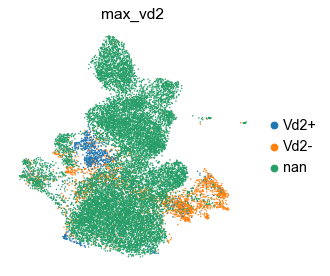

In [6]:
sc.pl.umap(adata, color='max_vd2')

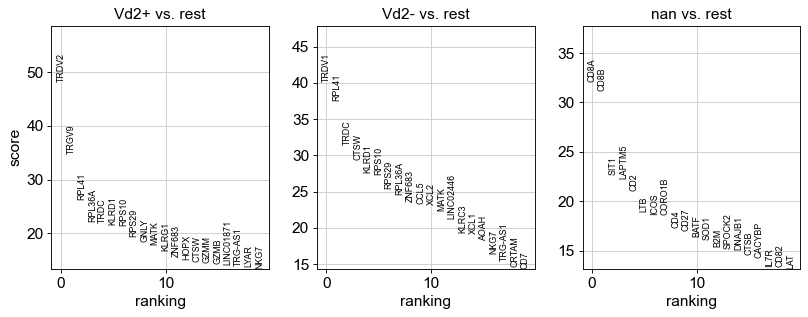

In [7]:
# re-calculate DE with all genes; confirm top20 unchanged
sc.tl.rank_genes_groups(adata, 'max_vd2', method='wilcoxon', n_genes=None)
sc.pl.rank_genes_groups(adata, n_genes=20, sharey=False)

In [8]:
# save update result as CSV
result = adata.uns['rank_genes_groups']
groups = result['names'].dtype.names
df = pd.DataFrame(
    {group + '_' + key[:4]: result[key][group]
    for group in groups for key in ['names', 'pvals_adj', 'logfoldchanges']})
df.to_csv('outputs/gd_vd2neg_v_all_volcano_genes.csv', index=False)
df.head(20)

,Vd2+_name,Vd2+_pval,Vd2+_logf,Vd2-_name,Vd2-_pval,Vd2-_logf,nan_name,nan_pval,nan_logf
0,TRDV2,0.000000e+00,8.874660,TRDV1,0.000000e+00,6.431989,CD8A,8.849940e-223,2.725935
1,TRGV9,1.321136e-259,4.724355,RPL41,1.294387e-303,0.626936,CD8B,1.438859e-209,2.986982
2,RPL41,4.354518e-147,0.727017,TRDC,5.240443e-213,4.312954,SIT1,1.382406e-110,1.703556
3,RPL36A,3.833485e-104,0.984643,CTSW,4.500338e-185,1.508273,LAPTM5,6.375280e-107,0.584622
4,TRDC,3.552430e-103,3.652212,KLRD1,1.665884e-164,2.516608,CD2,4.018671e-95,0.738666
5,KLRD1,6.504413e-100,2.577066,RPS10,3.271218e-161,0.803774,LTB,1.079071e-76,1.146078
6,RPS10,4.056261e-97,0.946513,RPS29,1.896746e-138,0.432963,ICOS,1.185269e-74,1.723144
7,RPS29,3.818971e-80,0.584972,RPL36A,3.793563e-130,0.719214,CORO1B,2.432704e-74,1.264751
8,GNLY,5.748452e-72,3.009347,ZNF683,1.370461e-119,2.355994,CD4,2.426203e-64,4.765623
9,MATK,1.747611e-67,1.846779,CCL5,3.996273e-117,1.394404,CD27,8.145551e-62,0.917356


In [9]:
# prep final volcano plot dataframe
df2 = df[['Vd2-_name', 'Vd2-_pval', 'Vd2-_logf']]
df2.columns = ['genes', 'p_adj', 'lfc']
df2

,genes,p_adj,lfc
0,TRDV1,0.000000e+00,6.431989
1,RPL41,1.294387e-303,0.626936
2,TRDC,5.240443e-213,4.312954
3,CTSW,4.500338e-185,1.508273
4,KLRD1,1.665884e-164,2.516608
...,...,...,...
18761,CD2,9.963674e-79,-0.789631
18762,LAPTM5,1.431324e-106,-0.707416
18763,CD8B,4.476420e-109,-2.361291
18764,SIT1,2.529433e-115,-2.323634


In [24]:
print(1e-320)
print(1e-330)

1e-320
0.0


In [27]:
# bugfix: edit p_adj for TRDV1 to not equal 0
print(df2.loc[0, 'p_adj'])
df2.loc[0, 'p_adj'] = 1e-320

df2.head(3)

1e-320


,genes,p_adj,lfc
0,TRDV1,9.999889e-321,6.431989
1,RPL41,1.294387e-303,0.626936
2,TRDC,5.240443e-213,4.312954


<AxesSubplot:xlabel='lfc', ylabel='p_adj'>

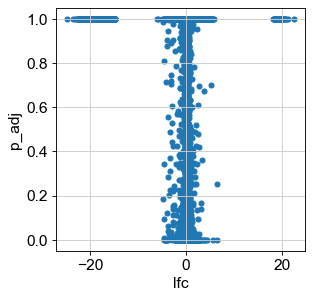

In [28]:
# plot scatter
df2.plot.scatter('lfc', 'p_adj')

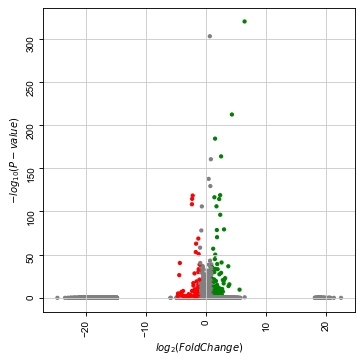

In [29]:
# plot volcano
from bioinfokit import analys, visuz

visuz.gene_exp.volcano(df=df2, lfc='lfc', pv='p_adj', show=True,
                       lfc_thr=(1,1), pv_thr=(0.05, 0.05))

In [32]:
df3 = df2
df3['lfc'] = df3['lfc'].clip(lower=-7, upper=7)
print(df3['lfc'].min(), df3['lfc'].min())

-7.0 -7.0


<ipython-input-32-4a6f4a7e1d21>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df3['lfc'] = df3['lfc'].clip(lower=-7, upper=7)


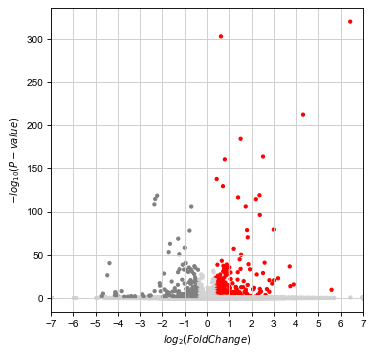

In [33]:
# plot volcano - clipped
visuz.gene_exp.volcano(df=df3, lfc='lfc', pv='p_adj', show=True,
                       lfc_thr=(0.4,0.4), pv_thr=(0.05, 0.05), color=['red', 'lightgrey', 'grey'],
                       xlm=(-7,7.01,1), ar=0)

In [34]:
# save volcano - clipped
visuz.gene_exp.volcano(df=df3, lfc='lfc', pv='p_adj', #show=True,
                       figtype='pdf', figname='figures_volcano/vd2-_unlabeled',
                       lfc_thr=(0.4,0.4), pv_thr=(0.05, 0.05), color=['red', 'lightgrey', 'grey'],
                       xlm=(-7,7.01,1), ar=0)

In [35]:
# select gene labels
top_20_genes = tuple(df3['genes'][0:20])
top_20_genes

('TRDV1',
 'RPL41',
 'TRDC',
 'CTSW',
 'KLRD1',
 'RPS10',
 'RPS29',
 'RPL36A',
 'ZNF683',
 'CCL5',
 'XCL2',
 'MATK',
 'LINC02446',
 'KLRC3',
 'XCL1',
 'AOAH',
 'NKG7',
 'TRG-AS1',
 'CRTAM',
 'CD7')

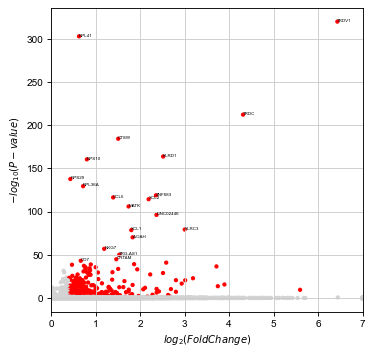

In [36]:
# plot volcano - clipped, labeled
visuz.gene_exp.volcano(df=df3, lfc='lfc', pv='p_adj', show=True,
                       #figtype='pdf', figname='figures_volcano/ptt_labeled_zoomed',
                       lfc_thr=(0.4,0.4), pv_thr=(0.05, 0.05), color=['red', 'lightgrey', 'grey'],
                       xlm=(0,7.01,1), ar=0,
                       geneid="genes", genenames=top_20_genes, gfont=4, gstyle=1)

In [37]:
# save volcano - clipped, labeled
visuz.gene_exp.volcano(df=df3, lfc='lfc', pv='p_adj', #show=True,
                       figtype='pdf', figname='figures_volcano/vd2-_labeled_zoomed',
                       lfc_thr=(0.4,0.4), pv_thr=(0.05, 0.05), color=['red', 'lightgrey', 'grey'],
                       xlm=(0,7.01,1), ar=0,
                       geneid="genes", genenames=top_20_genes, gfont=4, gstyle=1)

In [38]:
# save volcano - clipped, smaller
visuz.gene_exp.volcano(df=df3, lfc='lfc', pv='p_adj', #show=True,
                       figtype='pdf', figname='figures_volcano/vd2-_unlabeled_size6',
                       lfc_thr=(0.4,0.4), pv_thr=(0.05, 0.05), color=['red', 'lightgrey', 'grey'], dotsize=6,
                       xlm=(-7,7.01,1), ar=0)

In [39]:
# save volcano - clipped, smaller
visuz.gene_exp.volcano(df=df3, lfc='lfc', pv='p_adj', #show=True,
                       figtype='pdf', figname='figures_volcano/vd2-_unlabeled_size4',
                       lfc_thr=(0.4,0.4), pv_thr=(0.05, 0.05), color=['red', 'lightgrey', 'grey'], dotsize=4,
                       xlm=(-7,7.01,1), ar=0)

In [40]:
adata.write('./write/analysis3_gd_signature_volcano.h5ad')
adata

AnnData object with n_obs × n_vars = 17537 × 1916
    obs: 'barcode', 'doublet', 'sample_id', 'batch_name', 'cell.barcode', 'tcr_expansion', 'trdv', 'batch', 'n_genes', 'percent_mito', 'n_counts', 'leiden', 'umap_density_batch', 'umap_density_sample_id', 'max_trdv', 'max_vd2', 'tp', 'gd_tp', 'gd_vd2neg_tp'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'batch_colors', 'gd_tp_colors', 'gd_vd2neg_tp_colors', 'hvg', 'leiden', 'leiden_colors', 'max_vd2_colors', 'neighbors', 'pca', 'rank_genes_groups', 'sample_id_colors', 'tcr_expansion_colors', 'tp_colors', 'umap', 'umap_density_batch_params', 'umap_density_sample_id_params'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

## 16. May 27, 2022 - More volcano plots & Signature scores <a name="16"></a>
[Return to top](#0)

In [5]:
adata = sc.read(results_file)
adata

AnnData object with n_obs × n_vars = 17537 × 1916
    obs: 'barcode', 'doublet', 'sample_id', 'batch_name', 'cell.barcode', 'tcr_expansion', 'trdv', 'batch', 'n_genes', 'percent_mito', 'n_counts', 'leiden', 'umap_density_batch', 'umap_density_sample_id', 'max_trdv', 'max_vd2', 'tp', 'gd_tp', 'gd_vd2neg_tp'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'batch_colors', 'batch_name_colors', 'gd_tp_colors', 'gd_vd2neg_tp_colors', 'hvg', 'leiden', 'leiden_colors', 'max_vd2_colors', 'neighbors', 'pca', 'rank_genes_groups', 'sample_id_colors', 'tcr_expansion_colors', 'tp_colors', 'umap', 'umap_density_batch_params', 'umap_density_sample_id_params'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

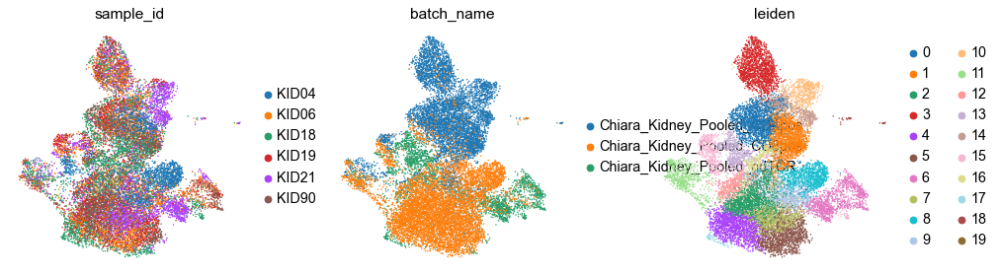

In [10]:
sc.pl.umap(adata, color=['sample_id', 'batch_name', 'leiden'])

### 16a. Volcano 1 - Vd2- vs Vd2+

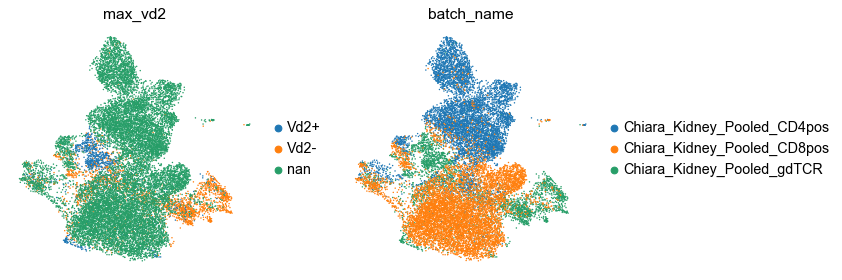

In [11]:
sc.pl.umap(adata, color=['max_vd2', 'batch_name'])

In [21]:
adata_gd = adata[adata.obs['max_vd2'] != 'nan']
adata_gd

View of AnnData object with n_obs × n_vars = 3018 × 1916
    obs: 'barcode', 'doublet', 'sample_id', 'batch_name', 'cell.barcode', 'tcr_expansion', 'trdv', 'batch', 'n_genes', 'percent_mito', 'n_counts', 'leiden', 'umap_density_batch', 'umap_density_sample_id', 'max_trdv', 'max_vd2', 'tp', 'gd_tp', 'gd_vd2neg_tp'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'batch_colors', 'gd_tp_colors', 'gd_vd2neg_tp_colors', 'hvg', 'leiden', 'leiden_colors', 'max_vd2_colors', 'neighbors', 'pca', 'rank_genes_groups', 'sample_id_colors', 'tcr_expansion_colors', 'tp_colors', 'umap', 'umap_density_batch_params', 'umap_density_sample_id_params', 'batch_name_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

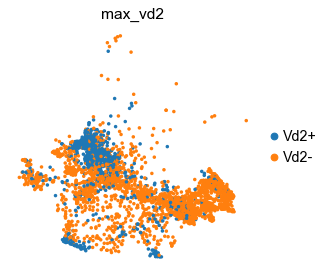

In [22]:
sc.pl.umap(adata_gd, color = 'max_vd2')

Trying to set attribute `.uns` of view, copying.


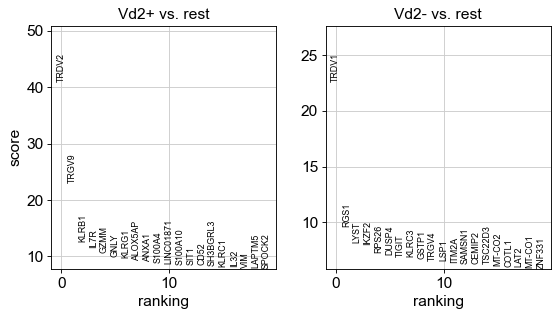

In [23]:
# re-calculate DE with all genes; confirm top20 unchanged
sc.tl.rank_genes_groups(adata_gd, 'max_vd2', method='wilcoxon', n_genes=None)
sc.pl.rank_genes_groups(adata_gd, n_genes=20, sharey=False)

In [24]:
# save update result as CSV
result = adata_gd.uns['rank_genes_groups']
groups = result['names'].dtype.names
df = pd.DataFrame(
    {group + '_' + key[:4]: result[key][group]
    for group in groups for key in ['names', 'pvals_adj', 'logfoldchanges']})
df.to_csv('outputs/volcano_genes_vd2-_v_vd2+.csv', index=False)
df.head(20)

,Vd2+_name,Vd2+_pval,Vd2+_logf,Vd2-_name,Vd2-_pval,Vd2-_logf
0,TRDV2,0.000000e+00,7.071658,TRDV1,1.603636e-109,5.157516
1,TRGV9,7.613869e-113,2.663225,RGS1,3.424671e-18,1.187814
2,KLRB1,5.465914e-33,1.972500,LYST,3.976311e-13,0.929089
3,IL7R,1.068085e-26,1.710992,IKZF2,1.904576e-12,1.778830
4,GZMM,1.719369e-22,0.929654,RPS26,3.425171e-10,0.349465
5,GNLY,1.413725e-19,1.598172,DUSP4,1.152797e-09,0.840396
6,KLRG1,1.920846e-19,1.113245,TIGIT,3.629212e-09,0.998267
7,ALOX5AP,1.108281e-16,0.911138,KLRC3,4.178112e-09,1.299768
8,ANXA1,2.400704e-16,0.908749,GSTP1,1.395072e-08,0.556060
9,S100A4,6.790792e-16,0.660006,TRGV4,3.892208e-08,2.375556


In [25]:
df.shape

(18766, 6)

In [26]:
# prep final volcano plot dataframe
df2 = df[['Vd2-_name', 'Vd2-_pval', 'Vd2-_logf']]
df2.columns = ['genes', 'p_adj', 'lfc']
df2

,genes,p_adj,lfc
0,TRDV1,1.603636e-109,5.157516
1,RGS1,3.424671e-18,1.187814
2,LYST,3.976311e-13,0.929089
3,IKZF2,1.904576e-12,1.778830
4,RPS26,3.425171e-10,0.349465
...,...,...,...
18761,GZMM,1.719369e-22,-0.929654
18762,IL7R,1.068085e-26,-1.710992
18763,KLRB1,5.465914e-33,-1.972500
18764,TRGV9,7.613869e-113,-2.663225


In [30]:
df2.shape

(18766, 3)

In [31]:
adata_gd.raw.shape

NameError: name 'adata_gd' is not defined

<AxesSubplot:xlabel='lfc', ylabel='p_adj'>

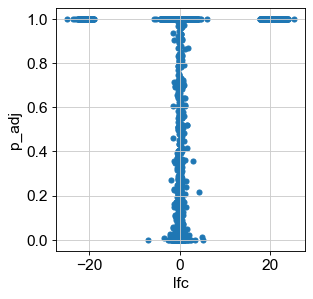

In [30]:
# plot scatter
df2.plot.scatter('lfc', 'p_adj')

/Users/brandonkevinchen/miniconda3/envs/scanpy3/lib/python3.8/site-packages/pandas/core/arraylike.py:358: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


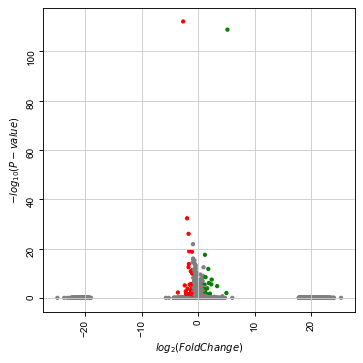

In [31]:
# plot volcano
from bioinfokit import analys, visuz

visuz.gene_exp.volcano(df=df2, lfc='lfc', pv='p_adj', show=True,
                       lfc_thr=(1,1), pv_thr=(0.05, 0.05))

In [34]:
df3 = df2
df3['lfc'] = df3['lfc'].clip(lower=-7, upper=7)
print(df3['lfc'].min(), df3['lfc'].min())

-7.0 -7.0


<ipython-input-34-4a6f4a7e1d21>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df3['lfc'] = df3['lfc'].clip(lower=-7, upper=7)


/Users/brandonkevinchen/miniconda3/envs/scanpy3/lib/python3.8/site-packages/pandas/core/arraylike.py:358: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


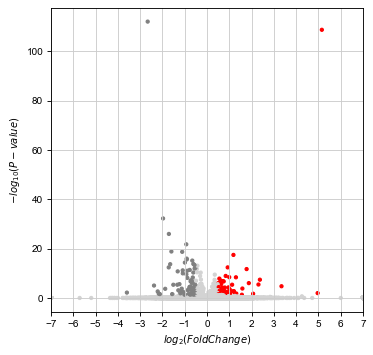

In [35]:
# plot volcano - clipped
visuz.gene_exp.volcano(df=df3, lfc='lfc', pv='p_adj', show=True,
                       lfc_thr=(0.5,0.5), pv_thr=(0.05, 0.05), color=['red', 'lightgrey', 'grey'],
                       xlm=(-7,7.01,1), ar=0)

In [36]:
# save volcano - clipped
visuz.gene_exp.volcano(df=df3, lfc='lfc', pv='p_adj', #show=True,
                       figtype='pdf', figname='figures_volcano_2/vd2-_v_vd2+_unlabeled',
                       lfc_thr=(0.5,0.5), pv_thr=(0.05, 0.05), color=['red', 'lightgrey', 'grey'],
                       xlm=(-7,7.01,1), ar=0)

/Users/brandonkevinchen/miniconda3/envs/scanpy3/lib/python3.8/site-packages/pandas/core/arraylike.py:358: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [37]:
# select gene labels
top_20_genes = tuple(df3['genes'][0:20])
top_20_genes

('TRDV1',
 'RGS1',
 'LYST',
 'IKZF2',
 'RPS26',
 'DUSP4',
 'TIGIT',
 'KLRC3',
 'GSTP1',
 'TRGV4',
 'LSP1',
 'ITM2A',
 'SAMSN1',
 'CEMIP2',
 'TSC22D3',
 'MT-CO2',
 'COTL1',
 'LAT2',
 'MT-CO1',
 'ZNF331')

/Users/brandonkevinchen/miniconda3/envs/scanpy3/lib/python3.8/site-packages/pandas/core/arraylike.py:358: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


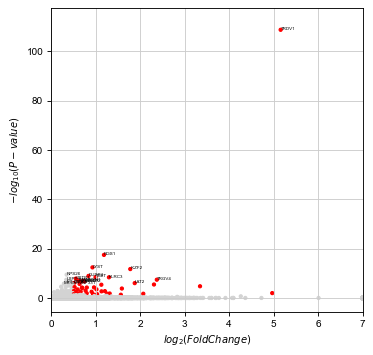

In [38]:
# plot volcano - clipped, labeled, zoomed
visuz.gene_exp.volcano(df=df3, lfc='lfc', pv='p_adj', show=True,
                       #figtype='pdf', figname='figures_volcano/ptt_labeled_zoomed',
                       lfc_thr=(0.5,0.5), pv_thr=(0.05, 0.05), color=['red', 'lightgrey', 'grey'],
                       xlm=(0,7.01,1), ar=0,
                       geneid="genes", genenames=top_20_genes, gfont=4, gstyle=1)

In [40]:
# save volcano - clipped, labeled, zoomed
visuz.gene_exp.volcano(df=df3, lfc='lfc', pv='p_adj', #show=True,
                       figtype='pdf', figname='figures_volcano_2/vd2-_v_vd2+_labeled_zoomed',
                       lfc_thr=(0.5,0.5), pv_thr=(0.05, 0.05), color=['red', 'lightgrey', 'grey'],
                       xlm=(0,7.01,1), ar=0,
                       geneid="genes", genenames=top_20_genes, gfont=4, gstyle=1)

/Users/brandonkevinchen/miniconda3/envs/scanpy3/lib/python3.8/site-packages/pandas/core/arraylike.py:358: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


### 16b. Volcano 2 - Vd2- vs CD8

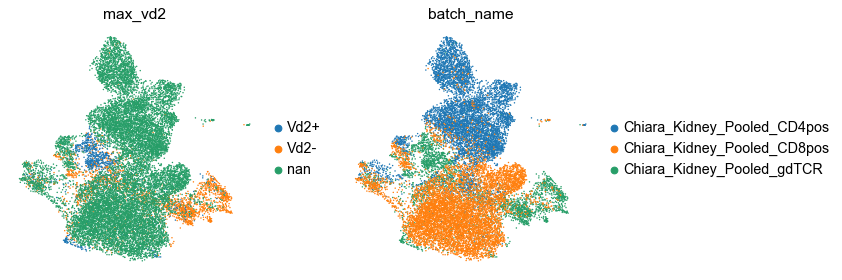

In [6]:
sc.pl.umap(adata, color=['max_vd2', 'batch_name'])

In [7]:
select_rows = \
  np.array(adata.obs['max_vd2'] == 'Vd2-') | \
  np.array(adata.obs['batch_name'] == 'Chiara_Kidney_Pooled_CD8pos')

In [8]:
adata_vd2neg_cd8 = adata[select_rows]
adata_vd2neg_cd8

View of AnnData object with n_obs × n_vars = 9878 × 1916
    obs: 'barcode', 'doublet', 'sample_id', 'batch_name', 'cell.barcode', 'tcr_expansion', 'trdv', 'batch', 'n_genes', 'percent_mito', 'n_counts', 'leiden', 'umap_density_batch', 'umap_density_sample_id', 'max_trdv', 'max_vd2', 'tp', 'gd_tp', 'gd_vd2neg_tp'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'batch_colors', 'batch_name_colors', 'gd_tp_colors', 'gd_vd2neg_tp_colors', 'hvg', 'leiden', 'leiden_colors', 'max_vd2_colors', 'neighbors', 'pca', 'rank_genes_groups', 'sample_id_colors', 'tcr_expansion_colors', 'tp_colors', 'umap', 'umap_density_batch_params', 'umap_density_sample_id_params'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

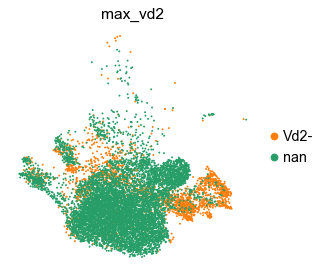

In [9]:
sc.pl.umap(adata_vd2neg_cd8, color = 'max_vd2')

Trying to set attribute `.uns` of view, copying.


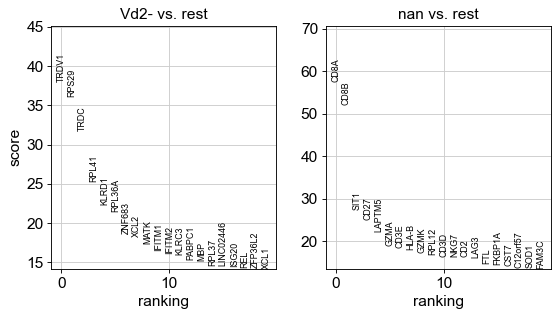

In [10]:
# re-calculate DE with all genes; confirm top20 unchanged
sc.tl.rank_genes_groups(adata_vd2neg_cd8, 'max_vd2', method='wilcoxon', n_genes=None)
sc.pl.rank_genes_groups(adata_vd2neg_cd8, n_genes=20, sharey=False)

In [12]:
# save update result as CSV
result = adata_vd2neg_cd8.uns['rank_genes_groups']
groups = result['names'].dtype.names
df = pd.DataFrame(
    {group + '_' + key[:4]: result[key][group]
    for group in groups for key in ['names', 'pvals_adj', 'logfoldchanges']})
#df.to_csv('outputs/volcano_genes_vd2-_v_cd8.csv', index=False)
df.head(20)

,Vd2-_name,Vd2-_pval,Vd2-_logf,nan_name,nan_pval,nan_logf
0,TRDV1,0.000000e+00,6.477304,CD8A,0.000000e+00,4.346390
1,RPS29,7.488887e-281,0.662270,CD8B,0.000000e+00,4.136349
2,TRDC,4.557439e-218,7.473764,SIT1,9.235682e-162,2.700442
3,RPL41,1.947367e-137,0.290088,CD27,2.653107e-135,1.519841
4,KLRD1,1.675301e-107,1.926803,LAPTM5,2.467522e-105,0.756437
5,RPL36A,9.820504e-99,0.608082,GZMA,2.258995e-76,1.009043
6,ZNF683,4.088434e-74,1.781201,CD3E,3.347865e-73,0.499591
7,XCL2,7.568227e-71,1.679434,HLA-B,1.111834e-68,0.452223
8,MATK,8.614026e-65,1.330794,GZMK,6.579149e-65,1.083586
9,IFITM1,9.272303e-58,0.690450,RPL12,2.439174e-60,0.340252


In [84]:
# prep final volcano plot dataframe
df2 = df[['Vd2-_name', 'Vd2-_pval', 'Vd2-_logf']]
df2.columns = ['genes', 'p_adj', 'lfc']
df2

,genes,p_adj,lfc
0,TRDV1,0.000000e+00,6.477304
1,RPS29,7.488887e-281,0.662270
2,TRDC,4.557439e-218,7.473764
3,RPL41,1.947367e-137,0.290088
4,KLRD1,1.675301e-107,1.926803
...,...,...,...
18761,LAPTM5,2.467522e-105,-0.756437
18762,CD27,2.653107e-135,-1.519841
18763,SIT1,9.235682e-162,-2.700442
18764,CD8B,0.000000e+00,-4.136349


In [85]:
print(1e-320)
print(1e-330)

1e-320
0.0


In [86]:
# bugfix: edit p_adj for TRDV1 to not equal 0
print(df2.loc[0, 'p_adj'])
df2.loc[0, 'p_adj'] = 1e-320

df2.head(3)

0.0


/Users/brandonkevinchen/miniconda3/envs/scanpy3/lib/python3.8/site-packages/pandas/core/indexing.py:1720: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)


,genes,p_adj,lfc
0,TRDV1,9.999889e-321,6.477304
1,RPS29,7.488887e-281,0.662270
2,TRDC,4.557439e-218,7.473764


<AxesSubplot:xlabel='lfc', ylabel='p_adj'>

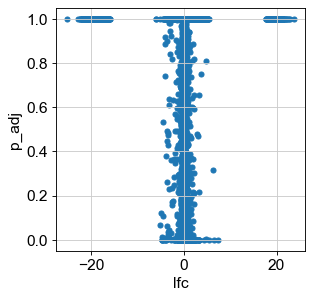

In [87]:
# plot scatter
df2.plot.scatter('lfc', 'p_adj')

/Users/brandonkevinchen/miniconda3/envs/scanpy3/lib/python3.8/site-packages/pandas/core/arraylike.py:358: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


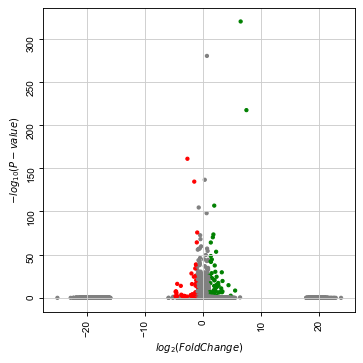

In [88]:
# plot volcano
from bioinfokit import analys, visuz

visuz.gene_exp.volcano(df=df2, lfc='lfc', pv='p_adj', show=True,
                       lfc_thr=(1,1), pv_thr=(0.05, 0.05))

/Users/brandonkevinchen/miniconda3/envs/scanpy3/lib/python3.8/site-packages/pandas/core/arraylike.py:358: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


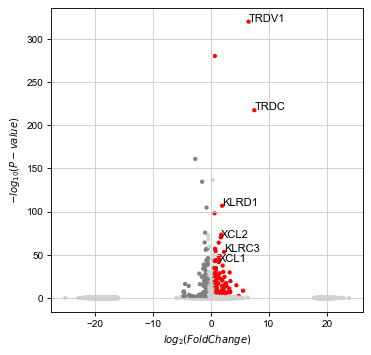

In [89]:
# plot volcano - UNclipped, highlight top 20 overlap with 20 gene Vd2- sig (TRDV1, TRDC, KLRD1, XCL2, XCL1)
top_20_overlap = ('TRDV1', 'TRDC', 'KLRD1', 'KLRC3', 'XCL2', 'XCL1')

visuz.gene_exp.volcano(df=df2, lfc='lfc', pv='p_adj', show=True,
                       lfc_thr=(0.5,0.5), pv_thr=(0.05, 0.05), color=['red', 'lightgrey', 'grey'],
                       #xlm=(-8,8.01,1), 
                       ar=0,
                       geneid="genes", genenames=top_20_overlap, gfont=10, gstyle=1)

In [90]:
# save volcano - UNclipped, highlight top 20 overlap with 20 gene Vd2- sig (TRDV1, TRDC, KLRD1, XCL2, XCL1)
top_20_overlap = ('TRDV1', 'TRDC', 'KLRD1', 'KLRC3', 'XCL2', 'XCL1')

visuz.gene_exp.volcano(df=df2, lfc='lfc', pv='p_adj', #show=True,
                       figtype='pdf', figname='figures_volcano_2/vd2-_v_cd8_label_overlap',
                       lfc_thr=(0.5,0.5), pv_thr=(0.05, 0.05), color=['red', 'lightgrey', 'grey'],
                       #xlm=(-8,8.01,1), 
                       ar=0,
                       geneid="genes", genenames=top_20_overlap, gfont=10, gstyle=1)

/Users/brandonkevinchen/miniconda3/envs/scanpy3/lib/python3.8/site-packages/pandas/core/arraylike.py:358: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [91]:
df3 = df2
df3['lfc'] = df3['lfc'].clip(lower=-10, upper=10)
print(df3['lfc'].min(), df3['lfc'].min())

-10.0 -10.0


<ipython-input-91-c8639f8c981e>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df3['lfc'] = df3['lfc'].clip(lower=-10, upper=10)


/Users/brandonkevinchen/miniconda3/envs/scanpy3/lib/python3.8/site-packages/pandas/core/arraylike.py:358: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


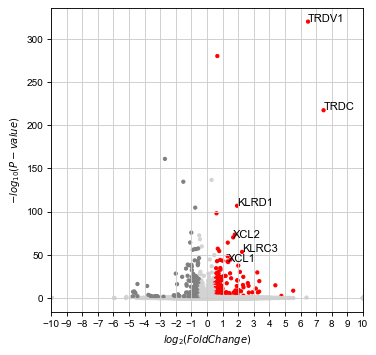

In [92]:
# plot volcano - UNclipped, highlight top 20 overlap with 20 gene Vd2- sig (TRDV1, TRDC, KLRD1, KLRC3, XCL2, XCL1)
top_20_overlap = ('TRDV1', 'TRDC', 'KLRD1', 'KLRC3', 'XCL2', 'XCL1')

visuz.gene_exp.volcano(df=df3, lfc='lfc', pv='p_adj', show=True,
                       lfc_thr=(0.5,0.5), pv_thr=(0.05, 0.05), color=['red', 'lightgrey', 'grey'],
                       xlm=(-10,10.01,1), 
                       ar=0,
                       geneid="genes", genenames=top_20_overlap, gfont=10, gstyle=1)

In [93]:
# save volcano - Clipped, highlight top 20 overlap with 20 gene Vd2- sig (TRDV1, TRDC, KLRD1, XCL2, XCL1)
top_20_overlap = ('TRDV1', 'TRDC', 'KLRD1', 'KLRC3', 'XCL2', 'XCL1')

visuz.gene_exp.volcano(df=df3, lfc='lfc', pv='p_adj', #show=True,
                       figtype='pdf', figname='figures_volcano_2/vd2-_v_cd8_label_overlap_clipped',
                       lfc_thr=(0.5,0.5), pv_thr=(0.05, 0.05), color=['red', 'lightgrey', 'grey'],
                       xlm=(-10,10.01,1), 
                       ar=0,
                       geneid="genes", genenames=top_20_overlap, gfont=10, gstyle=1)

/Users/brandonkevinchen/miniconda3/envs/scanpy3/lib/python3.8/site-packages/pandas/core/arraylike.py:358: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


#### original run - continued

In [77]:
df3 = df2
df3['lfc'] = df3['lfc'].clip(lower=-8, upper=8)
print(df3['lfc'].min(), df3['lfc'].min())

-8.0 -8.0


<ipython-input-77-75c0e26b8c52>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df3['lfc'] = df3['lfc'].clip(lower=-8, upper=8)


/Users/brandonkevinchen/miniconda3/envs/scanpy3/lib/python3.8/site-packages/pandas/core/arraylike.py:358: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


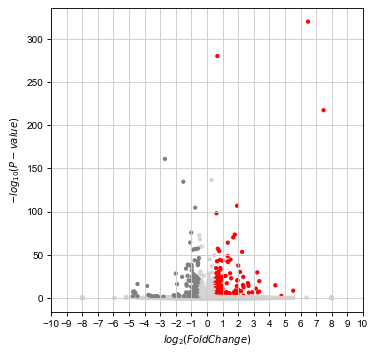

In [78]:
# plot volcano - clipped
visuz.gene_exp.volcano(df=df3, lfc='lfc', pv='p_adj', show=True,
                       lfc_thr=(0.5,0.5), pv_thr=(0.05, 0.05), color=['red', 'lightgrey', 'grey'],
                       xlm=(-10,10.01,1), ar=0)

In [79]:
# save volcano - clipped
visuz.gene_exp.volcano(df=df3, lfc='lfc', pv='p_adj', #show=True,
                       figtype='pdf', figname='figures_volcano_2/vd2-_v_cd8_unlabeled',
                       lfc_thr=(0.5,0.5), pv_thr=(0.05, 0.05), color=['red', 'lightgrey', 'grey'],
                       xlm=(-8,8.01,1), ar=0)

/Users/brandonkevinchen/miniconda3/envs/scanpy3/lib/python3.8/site-packages/pandas/core/arraylike.py:358: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [80]:
# select gene labels
top_20_genes = tuple(df3['genes'][0:20])
top_20_genes

('TRDV1',
 'RPS29',
 'TRDC',
 'RPL41',
 'KLRD1',
 'RPL36A',
 'ZNF683',
 'XCL2',
 'MATK',
 'IFITM1',
 'IFITM2',
 'KLRC3',
 'PABPC1',
 'MBP',
 'RPL37',
 'LINC02446',
 'ISG20',
 'REL',
 'ZFP36L2',
 'XCL1')

/Users/brandonkevinchen/miniconda3/envs/scanpy3/lib/python3.8/site-packages/pandas/core/arraylike.py:358: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


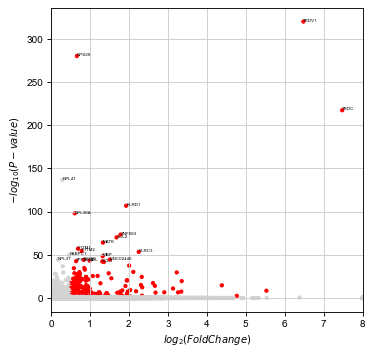

In [81]:
# plot volcano - clipped, labeled, zoomed
visuz.gene_exp.volcano(df=df3, lfc='lfc', pv='p_adj', show=True,
                       #figtype='pdf', figname='figures_volcano/ptt_labeled_zoomed',
                       lfc_thr=(0.5,0.5), pv_thr=(0.05, 0.05), color=['red', 'lightgrey', 'grey'],
                       xlm=(0,8.01,1), ar=0,
                       geneid="genes", genenames=top_20_genes, gfont=4, gstyle=1)

In [82]:
# save volcano - clipped, labeled, zoomed
visuz.gene_exp.volcano(df=df3, lfc='lfc', pv='p_adj', #show=True,
                       figtype='pdf', figname='figures_volcano_2/vd2-_v_cd8_labeled_zoomed',
                       lfc_thr=(0.5,0.5), pv_thr=(0.05, 0.05), color=['red', 'lightgrey', 'grey'],
                       xlm=(0,8.01,1), ar=0,
                       geneid="genes", genenames=top_20_genes, gfont=4, gstyle=1)

/Users/brandonkevinchen/miniconda3/envs/scanpy3/lib/python3.8/site-packages/pandas/core/arraylike.py:358: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


### 16c. Volcano 3 - Vd2- vs CD4

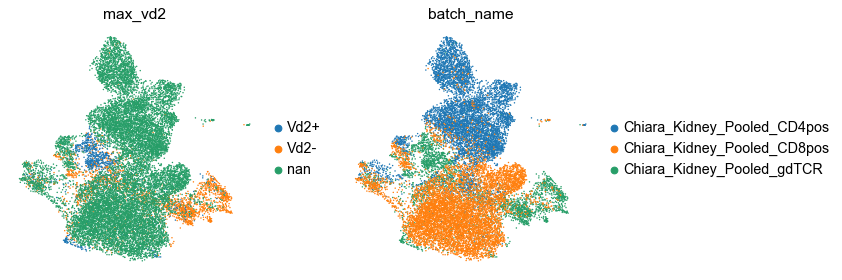

In [81]:
sc.pl.umap(adata, color=['max_vd2', 'batch_name'])

In [82]:
select_rows = \
  np.array(adata.obs['max_vd2'] == 'Vd2-') | \
  np.array(adata.obs['batch_name'] == 'Chiara_Kidney_Pooled_CD4pos')

In [84]:
adata_vd2neg_cd4 = adata[select_rows]
adata_vd2neg_cd4

View of AnnData object with n_obs × n_vars = 8875 × 1916
    obs: 'barcode', 'doublet', 'sample_id', 'batch_name', 'cell.barcode', 'tcr_expansion', 'trdv', 'batch', 'n_genes', 'percent_mito', 'n_counts', 'leiden', 'umap_density_batch', 'umap_density_sample_id', 'max_trdv', 'max_vd2', 'tp', 'gd_tp', 'gd_vd2neg_tp'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'batch_colors', 'gd_tp_colors', 'gd_vd2neg_tp_colors', 'hvg', 'leiden', 'leiden_colors', 'max_vd2_colors', 'neighbors', 'pca', 'rank_genes_groups', 'sample_id_colors', 'tcr_expansion_colors', 'tp_colors', 'umap', 'umap_density_batch_params', 'umap_density_sample_id_params', 'batch_name_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

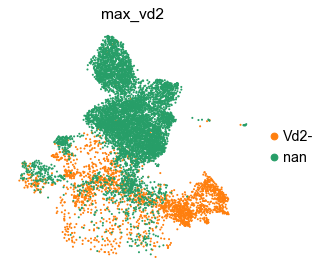

In [85]:
sc.pl.umap(adata_vd2neg_cd4, color = 'max_vd2')

Trying to set attribute `.uns` of view, copying.


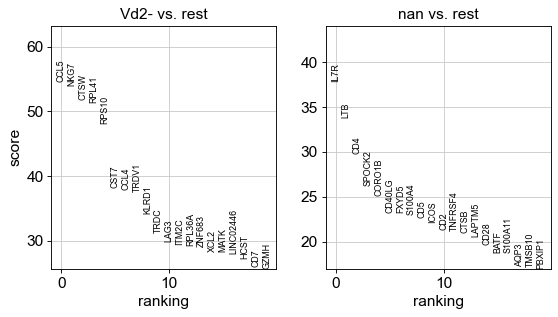

In [86]:
# re-calculate DE with all genes;
sc.tl.rank_genes_groups(adata_vd2neg_cd4, 'max_vd2', method='wilcoxon', n_genes=None)
sc.pl.rank_genes_groups(adata_vd2neg_cd4, n_genes=20, sharey=False)

In [87]:
# save update result as CSV
result = adata_vd2neg_cd4.uns['rank_genes_groups']
groups = result['names'].dtype.names
df = pd.DataFrame(
    {group + '_' + key[:4]: result[key][group]
    for group in groups for key in ['names', 'pvals_adj', 'logfoldchanges']})
df.to_csv('outputs/volcano_genes_vd2-_v_cd4.csv', index=False)
df.head(20)

,Vd2-_name,Vd2-_pval,Vd2-_logf,nan_name,nan_pval,nan_logf
0,CCL5,0.000000e+00,3.701476,IL7R,0.000000e+00,3.150883
1,NKG7,0.000000e+00,4.997975,LTB,3.796627e-246,2.355524
2,CTSW,0.000000e+00,4.242442,CD4,1.555376e-191,5.822341
3,RPL41,0.000000e+00,1.120971,SPOCK2,5.149341e-149,1.608587
4,RPS10,0.000000e+00,1.790359,CORO1B,2.100516e-136,1.939571
5,CST7,0.000000e+00,2.246414,CD40LG,9.503575e-117,5.841206
6,CCL4,0.000000e+00,3.482613,FXYD5,9.767074e-117,0.813814
7,TRDV1,2.749674e-304,6.665266,S100A4,9.157486e-114,1.030976
8,KLRD1,2.647920e-252,10.230193,CD5,2.562504e-110,2.006495
9,TRDC,1.024350e-211,7.451607,ICOS,3.922333e-105,2.348195


In [88]:
# prep final volcano plot dataframe
df2 = df[['Vd2-_name', 'Vd2-_pval', 'Vd2-_logf']]
df2.columns = ['genes', 'p_adj', 'lfc']
df2

,genes,p_adj,lfc
0,CCL5,0.000000e+00,3.701476
1,NKG7,0.000000e+00,4.997975
2,CTSW,0.000000e+00,4.242442
3,RPL41,0.000000e+00,1.120971
4,RPS10,0.000000e+00,1.790359
...,...,...,...
18761,CORO1B,2.100516e-136,-1.939571
18762,SPOCK2,5.149341e-149,-1.608587
18763,CD4,1.555376e-191,-5.822341
18764,LTB,3.796627e-246,-2.355524


<AxesSubplot:xlabel='lfc', ylabel='p_adj'>

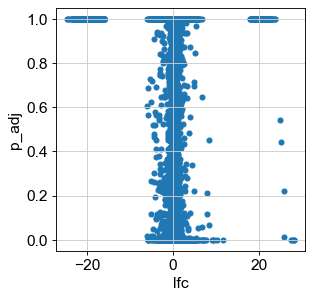

In [89]:
# plot scatter
df2.plot.scatter('lfc', 'p_adj')

/Users/brandonkevinchen/miniconda3/envs/scanpy3/lib/python3.8/site-packages/pandas/core/arraylike.py:358: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


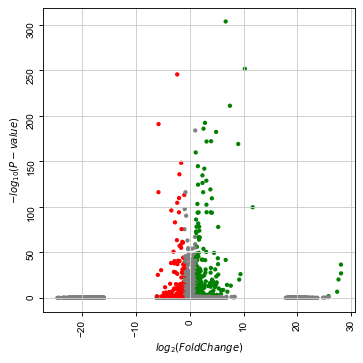

In [90]:
# plot volcano
from bioinfokit import analys, visuz

visuz.gene_exp.volcano(df=df2, lfc='lfc', pv='p_adj', show=True,
                       lfc_thr=(1,1), pv_thr=(0.05, 0.05))

In [91]:
df3 = df2
df3['lfc'] = df3['lfc'].clip(lower=-10)
print(df3['lfc'].min(), df3['lfc'].min())

-10.0 -10.0


<ipython-input-91-5208d53b6f61>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df3['lfc'] = df3['lfc'].clip(lower=-10)


/Users/brandonkevinchen/miniconda3/envs/scanpy3/lib/python3.8/site-packages/pandas/core/arraylike.py:358: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


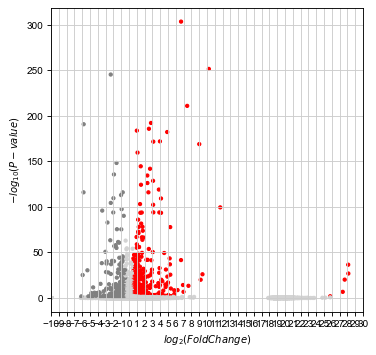

In [92]:
# plot volcano - clipped
visuz.gene_exp.volcano(df=df3, lfc='lfc', pv='p_adj', show=True,
                       lfc_thr=(0.5,0.5), pv_thr=(0.05, 0.05), color=['red', 'lightgrey', 'grey'],
                       xlm=(-10,30.01,1), ar=0)

In [93]:
# save volcano - clipped
visuz.gene_exp.volcano(df=df3, lfc='lfc', pv='p_adj', #show=True,
                       figtype='pdf', figname='figures_volcano_2/vd2-_v_cd4_unlabeled',
                       lfc_thr=(0.5,0.5), pv_thr=(0.05, 0.05), color=['red', 'lightgrey', 'grey'],
                       xlm=(-10,30.01,1), ar=0)

/Users/brandonkevinchen/miniconda3/envs/scanpy3/lib/python3.8/site-packages/pandas/core/arraylike.py:358: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [94]:
# select gene labels
top_20_genes = tuple(df3['genes'][0:20])
top_20_genes

('CCL5',
 'NKG7',
 'CTSW',
 'RPL41',
 'RPS10',
 'CST7',
 'CCL4',
 'TRDV1',
 'KLRD1',
 'TRDC',
 'LAG3',
 'ITM2C',
 'RPL36A',
 'ZNF683',
 'XCL2',
 'MATK',
 'LINC02446',
 'HCST',
 'CD7',
 'GZMH')

/Users/brandonkevinchen/miniconda3/envs/scanpy3/lib/python3.8/site-packages/pandas/core/arraylike.py:358: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


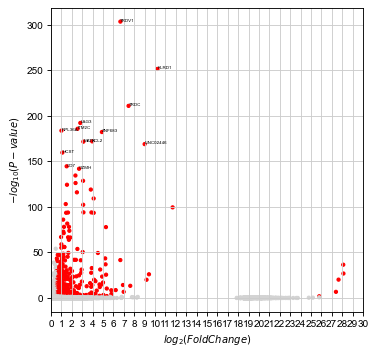

In [95]:
# plot volcano - clipped, labeled, zoomed
visuz.gene_exp.volcano(df=df3, lfc='lfc', pv='p_adj', show=True,
                       #figtype='pdf', figname='figures_volcano/ptt_labeled_zoomed',
                       lfc_thr=(0.5,0.5), pv_thr=(0.05, 0.05), color=['red', 'lightgrey', 'grey'],
                       xlm=(0,30.01,1), ar=0,
                       geneid="genes", genenames=top_20_genes, gfont=4, gstyle=1)

In [96]:
# save volcano - clipped, labeled, zoomed
visuz.gene_exp.volcano(df=df3, lfc='lfc', pv='p_adj', #show=True,
                       figtype='pdf', figname='figures_volcano_2/vd2-_v_cd4_labeled_zoomed',
                       lfc_thr=(0.5,0.5), pv_thr=(0.05, 0.05), color=['red', 'lightgrey', 'grey'],
                       xlm=(0,30.01,1), ar=0,
                       geneid="genes", genenames=top_20_genes, gfont=4, gstyle=1)

/Users/brandonkevinchen/miniconda3/envs/scanpy3/lib/python3.8/site-packages/pandas/core/arraylike.py:358: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finit

### 16d. Signature scores

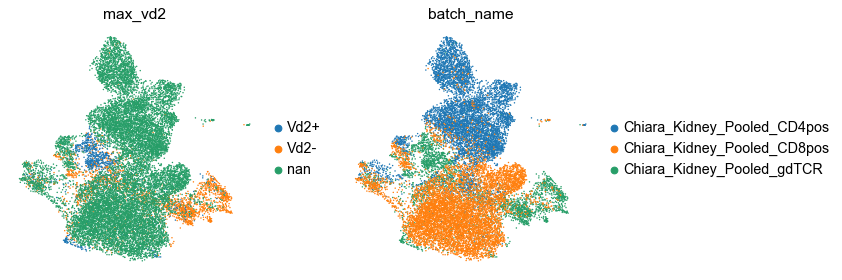

In [8]:
sc.pl.umap(adata, color=['max_vd2', 'batch_name'])

In [9]:
gene_sig = ['TRDV1','RPL41','TRDC','CTSW','KLRD1','RPS10','RPS29','RPL36A','ZNF683','CCL5',
            'XCL2','MATK','LINC02446','KLRC3','XCL1','AOAH','NKG7','TRG-AS1','CRTAM','CD7']

In [14]:
sc.tl.score_genes(adata, gene_list=gene_sig, score_name='gene_sig_20', use_raw=True)

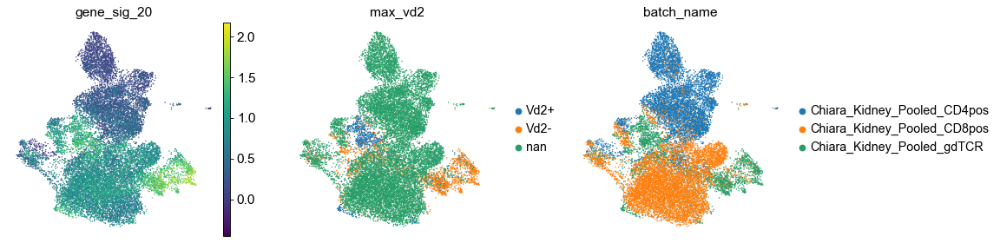

In [21]:
sc.pl.umap(adata, color=['gene_sig_20', 'max_vd2', 'batch_name'], 
           save='_gene_sig_comparison.pdf')

In [24]:
adata.obs.keys()

Index(['barcode', 'doublet', 'sample_id', 'batch_name', 'cell.barcode',
       'tcr_expansion', 'trdv', 'batch', 'n_genes', 'percent_mito', 'n_counts',
       'leiden', 'umap_density_batch', 'umap_density_sample_id', 'max_trdv',
       'max_vd2', 'tp', 'gd_tp', 'gd_vd2neg_tp', 'gene_sig_20'],
      dtype='object')

In [35]:
adata[adata.obs['max_vd2'] == 'Vd2-'].obs['gene_sig_20'].median()

1.1297178

In [32]:
adata[adata.obs['batch_name'] == 'Chiara_Kidney_Pooled_gdTCR'].obs['gene_sig_20'].median()

1.0978864

In [33]:
adata[adata.obs['batch_name'] == 'Chiara_Kidney_Pooled_CD8pos'].obs['gene_sig_20'].median()

0.7459649

In [34]:
adata[adata.obs['batch_name'] == 'Chiara_Kidney_Pooled_CD4pos'].obs['gene_sig_20'].median()

0.19528712

In [42]:
df = adata.obs[['batch_name', 'max_vd2', 'gene_sig_20']]
df.to_csv('outputs/gene_sig_scores.csv')
df

,batch_name,max_vd2,gene_sig_20
AAACCTGCACAGCCCA-1-gd,Chiara_Kidney_Pooled_gdTCR,Vd2-,1.540456
AAACCTGCAGGACCCT-1-gd,Chiara_Kidney_Pooled_gdTCR,Vd2-,1.728146
AAACCTGCATTCACTT-1-gd,Chiara_Kidney_Pooled_gdTCR,Vd2+,0.993646
AAACGGGAGCTAGTTC-1-gd,Chiara_Kidney_Pooled_gdTCR,Vd2-,1.537579
AAACGGGCAATACGCT-1-gd,Chiara_Kidney_Pooled_gdTCR,Vd2-,0.771440
...,...,...,...
TTTGTCACAGGTCTCG-1-cd8,Chiara_Kidney_Pooled_CD8pos,nan,1.036728
TTTGTCACATACAGCT-1-cd8,Chiara_Kidney_Pooled_CD8pos,nan,0.719915
TTTGTCAGTCTAGTCA-1-cd8,Chiara_Kidney_Pooled_CD8pos,nan,0.493400
TTTGTCATCCAAATGC-1-cd8,Chiara_Kidney_Pooled_CD8pos,nan,0.564173


## 17. Aug 12, 2022 - IL-15 expression <a name="17"></a>
[Return to top](#0)

In [6]:
adata = sc.read(results_file)
adata

AnnData object with n_obs × n_vars = 17537 × 1916
    obs: 'barcode', 'doublet', 'sample_id', 'batch_name', 'cell.barcode', 'tcr_expansion', 'trdv', 'batch', 'n_genes', 'percent_mito', 'n_counts', 'leiden', 'umap_density_batch', 'umap_density_sample_id', 'max_trdv', 'max_vd2', 'tp', 'gd_tp', 'gd_vd2neg_tp'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'batch_colors', 'batch_name_colors', 'gd_tp_colors', 'gd_vd2neg_tp_colors', 'hvg', 'leiden', 'leiden_colors', 'max_vd2_colors', 'neighbors', 'pca', 'rank_genes_groups', 'sample_id_colors', 'tcr_expansion_colors', 'tp_colors', 'umap', 'umap_density_batch_params', 'umap_density_sample_id_params'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

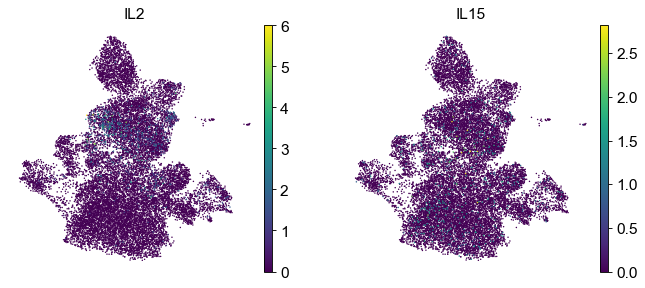

In [12]:
sc.pl.umap(adata, color=['IL2', 'IL15'],
          save='_IL15')

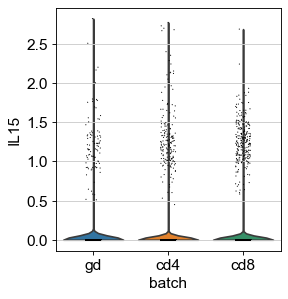

In [13]:
sc.pl.violin(adata, ['IL15'], groupby='batch',
            save='_IL15')

In [14]:
adata.write(results_file)
adata

AnnData object with n_obs × n_vars = 17537 × 1916
    obs: 'barcode', 'doublet', 'sample_id', 'batch_name', 'cell.barcode', 'tcr_expansion', 'trdv', 'batch', 'n_genes', 'percent_mito', 'n_counts', 'leiden', 'umap_density_batch', 'umap_density_sample_id', 'max_trdv', 'max_vd2', 'tp', 'gd_tp', 'gd_vd2neg_tp'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'batch_colors', 'batch_name_colors', 'gd_tp_colors', 'gd_vd2neg_tp_colors', 'hvg', 'leiden', 'leiden_colors', 'max_vd2_colors', 'neighbors', 'pca', 'rank_genes_groups', 'sample_id_colors', 'tcr_expansion_colors', 'tp_colors', 'umap', 'umap_density_batch_params', 'umap_density_sample_id_params', 'max_trdv_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

## 18. Dec 2, 2022 (Fri) - plot heat map of gene sig across Vd2-, Vd2+, CD4, and CD8 <a name="18"></a>
[Return to top](#0)

In [5]:
adata = sc.read(results_file)
adata

AnnData object with n_obs × n_vars = 17537 × 1916
    obs: 'barcode', 'doublet', 'sample_id', 'batch_name', 'cell.barcode', 'tcr_expansion', 'trdv', 'batch', 'n_genes', 'percent_mito', 'n_counts', 'leiden', 'umap_density_batch', 'umap_density_sample_id', 'max_trdv', 'max_vd2', 'tp', 'gd_tp', 'gd_vd2neg_tp'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'batch_colors', 'batch_name_colors', 'gd_tp_colors', 'gd_vd2neg_tp_colors', 'hvg', 'leiden', 'leiden_colors', 'max_trdv_colors', 'max_vd2_colors', 'neighbors', 'pca', 'rank_genes_groups', 'sample_id_colors', 'tcr_expansion_colors', 'tp_colors', 'umap', 'umap_density_batch_params', 'umap_density_sample_id_params'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [6]:
adata.obs.head()

,barcode,doublet,sample_id,batch_name,cell.barcode,tcr_expansion,trdv,batch,n_genes,percent_mito,n_counts,leiden,umap_density_batch,umap_density_sample_id,max_trdv,max_vd2,tp,gd_tp,gd_vd2neg_tp
AAACCTGCACAGCCCA-1-gd,AAACCTGCACAGCCCA-1,SNG,KID21,Chiara_Kidney_Pooled_gdTCR,AAACCTGCACAGCCCA-1,NaN,NaN,gd,1852,0.027114,5274.0,7,0.128245,0.855876,TRDV1,Vd2-,False,False,False
AAACCTGCAGGACCCT-1-gd,AAACCTGCAGGACCCT-1,SNG,KID21,Chiara_Kidney_Pooled_gdTCR,AAACCTGCAGGACCCT-1,high,TRDV1,gd,1761,0.041157,6463.0,6,0.788255,0.525416,TRDV1,Vd2-,False,False,False
AAACCTGCATTCACTT-1-gd,AAACCTGCATTCACTT-1,SNG,KID19,Chiara_Kidney_Pooled_gdTCR,AAACCTGCATTCACTT-1,NaN,NaN,gd,1195,0.003378,2664.0,13,0.818915,0.284222,TRDV2,Vd2+,False,False,False
AAACGGGAGCTAGTTC-1-gd,AAACGGGAGCTAGTTC-1,SNG,KID21,Chiara_Kidney_Pooled_gdTCR,AAACGGGAGCTAGTTC-1,NaN,NaN,gd,1652,0.038266,5697.0,6,0.501369,0.571459,TRAV14DV4,Vd2-,False,False,False
AAACGGGCAATACGCT-1-gd,AAACGGGCAATACGCT-1,SNG,KID19,Chiara_Kidney_Pooled_gdTCR,AAACGGGCAATACGCT-1,NaN,NaN,gd,2057,0.037108,4204.0,11,0.060915,0.034520,TRAV29DV5,Vd2-,True,True,True


In [9]:
adata.obs['batch'].value_counts()

cd8    7761
cd4    6758
gd     3018
Name: batch, dtype: int64

In [46]:
batch_Vd2 = adata.obs['batch'].astype(str)+'_'+adata.obs['max_vd2'].astype(str)
batch_Vd2

AAACCTGCACAGCCCA-1-gd     gd_Vd2-
AAACCTGCAGGACCCT-1-gd     gd_Vd2-
AAACCTGCATTCACTT-1-gd     gd_Vd2+
AAACGGGAGCTAGTTC-1-gd     gd_Vd2-
AAACGGGCAATACGCT-1-gd     gd_Vd2-
                           ...   
TTTGTCACAGGTCTCG-1-cd8    cd8_nan
TTTGTCACATACAGCT-1-cd8    cd8_nan
TTTGTCAGTCTAGTCA-1-cd8    cd8_nan
TTTGTCATCCAAATGC-1-cd8    cd8_nan
TTTGTCATCTATCGCC-1-cd8    cd8_nan
Length: 17537, dtype: object

In [47]:
batch_Vd2.value_counts()

cd8_nan    7761
cd4_nan    6758
gd_Vd2-    2117
gd_Vd2+     901
dtype: int64

In [48]:
batch_Vd2.replace({'cd8_nan': 'CD8',
                   'cd4_nan': 'CD4',
                   'gd_Vd2-': 'Vd2-',
                   'gd_Vd2+': 'Vd2+'}, inplace=True)

In [49]:
batch_Vd2.value_counts()

CD8     7761
CD4     6758
Vd2-    2117
Vd2+     901
dtype: int64

In [50]:
adata.obs['batch_Vd2'] = batch_Vd2
adata.obs[['batch', 'max_vd2', 'batch_Vd2']]

,batch,max_vd2,batch_Vd2
AAACCTGCACAGCCCA-1-gd,gd,Vd2-,Vd2-
AAACCTGCAGGACCCT-1-gd,gd,Vd2-,Vd2-
AAACCTGCATTCACTT-1-gd,gd,Vd2+,Vd2+
AAACGGGAGCTAGTTC-1-gd,gd,Vd2-,Vd2-
AAACGGGCAATACGCT-1-gd,gd,Vd2-,Vd2-
...,...,...,...
TTTGTCACAGGTCTCG-1-cd8,cd8,nan,CD8
TTTGTCACATACAGCT-1-cd8,cd8,nan,CD8
TTTGTCAGTCTAGTCA-1-cd8,cd8,nan,CD8
TTTGTCATCCAAATGC-1-cd8,cd8,nan,CD8


In [44]:
# Fig. 6C genes (Vd2- 20 gene signature)
gd_vd2neg_sig = ['TRDV1', 'RPL41', 'TRDC', 'CTSW', 'KLRD1', 'RPS10', 'RPS29', 'RPL36A', 'ZNF683', 'CCL5', 
                 'XCL2', 'MATK', 'LINC02446', 'KLRC3', 'XCL1', 'AOAH', 'NKG7', 'TRG-AS1', 'CRTAM', 'CD7']

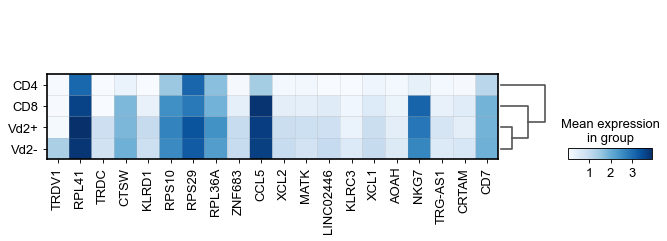

In [55]:
sc.pl.matrixplot(adata, gd_vd2neg_sig, 'batch_Vd2', dendrogram=True, 
                 cmap='Blues', save='_fig6c_1_genesig_by_batch')

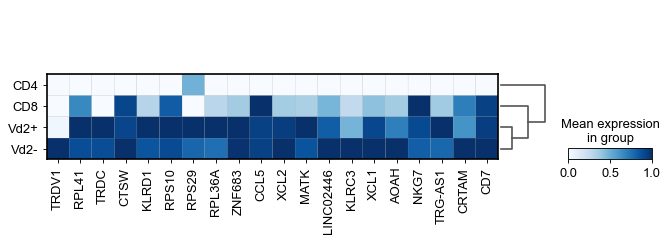

In [56]:
sc.pl.matrixplot(adata, gd_vd2neg_sig, 'batch_Vd2', dendrogram=True, 
                 cmap='Blues', standard_scale='var', save='_fig6c_1_genesig_by_batch_scaled')

## 19. Bottom of notebook <a name="19"></a>
[Return to top](#0)